## This is HNA or Hybrid SFLA-CSO Network Aligner program, and implemented by Elham Mahdipour that is Ph.D. Candidate of Artificial Intelligence at Yazd University, Yazd, Iran. 
### All copyright reserved by the author.

You can run the program from first to end and see all the results, but since the population generation process can take a time depended on the node numbers of networks, you can use the populations stored in each program. We saved the populations as the pair of related species that you can see in the input folder and load them on program, such as "ce-sc-pop.pickle". Therefore, you must run follow steps: 1) Run all cells in "Load Graphs", "Swap Graphs", "Define Target Graph",and "Compute Score for create similarity matrix" sections. 2) If you will use saved population, please upload related pickle on root of jupyter notebook, then go "load population" cell and run them; else, please run "multi tasking for initial population", "multi processing for speed up", and "Initialization such as MeAlign" cells. 3) Run all remains cells to create results.

# Load Graphs 

In [1]:
import pickle
with open('sc-sc-weighted.pickle', 'rb') as f:
    sclist = pickle.load(f)

In [2]:
with open('dm-dm-weighted.pickle', 'rb') as f:
    dmlist = pickle.load(f)

In [3]:
import networkx as nx
G1=nx.Graph()
for i in range(len(sclist)):
    if G1.has_node(sclist[i][0])==False:
        G1.add_node(sclist[i][0])
    if G1.has_node(sclist[i][1])==False:
        G1.add_node(sclist[i][1])
    G1.add_edge(sclist[i][0],sclist[i][1],weight=sclist[i][2])
G1

In [4]:
G1.number_of_nodes()

5513

In [5]:
G1.number_of_edges()

16185

In [6]:
len(G1)

5513

In [7]:
G2=nx.Graph()
for i in range(len(dmlist)):
    if G2.has_node(dmlist[i][0])==False:
        G2.add_node(dmlist[i][0])
    if G2.has_node(dmlist[i][1])==False:
        G2.add_node(dmlist[i][1])
    G2.add_edge(dmlist[i][0],dmlist[i][1],weight=dmlist[i][2])
G2

In [8]:
print('len G1:', len(G1))

print('len G2:',len(G2))

len G1: 5513
len G2: 7361


# Swap graphs if len G1 > len G2

In [9]:
### Check and Swap if G1 > G2 ###
if len(G1)>len(G2):
    temp=G1
    G1=G2
    G2=temp
print(len(G1))
print(len(G2))

5513
7361


In [10]:
ed1=G1.edges()

In [11]:
nd1=G1.nodes()

In [12]:
ed2=G2.edges()

In [13]:
len(ed2)

33691

In [14]:
nd2=G2.nodes()

In [15]:
len(ed1)

16185

In [16]:
len(nd1)

5513

In [17]:
el1=list(ed1)
el2=list(ed2)

In [18]:
nd1=list(nd1)
nd2=list(nd2)

In [19]:
degG1 = [val for (node, val) in G1.degree()]


In [20]:
degG2 = [val for (node, val) in G2.degree()]

# Define Target Graph

In [21]:
G_target_na=nx.read_weighted_edgelist('dm-sc.evals')
G_target_na  

In [22]:
gtnode=list(G_target_na.nodes())
print(len(gtnode))
g_t_node=[]
for i in range(len(gtnode)):
    if (G1.has_node(gtnode[i])==False and G2.has_node(gtnode[i])==False):
        continue
    else:
        g_t_node.append(gtnode[i])

#print(gtnode)
print(len(g_t_node))

8470
6473


In [23]:
G_target=nx.Graph()
for i in range(len(g_t_node)):
    for j in range(len(g_t_node)):
        if G_target_na.has_node(g_t_node[i])==False:
            G_target.add_node(g_t_node[i])
        if G_target_na.has_node(g_t_node[j])==False:
            G_target.add_node(g_t_node[j])
        if G_target_na.has_edge(g_t_node[i],g_t_node[j]):
            a=list(G_target_na.get_edge_data(g_t_node[i],g_t_node[j]).values())
            #b=list(a[0][0].values())
            G_target.add_edge(g_t_node[i],g_t_node[j],weight=a[0])
G_target

In [24]:
len(G_target)

6031

In [25]:
G_target_na=G_target

In [26]:
G_target_na.edges()

EdgeView([('dm4977', 'sc2631'), ('sc2631', 'dm6415'), ('sc2631', 'dm5271'), ('dm4975', 'sc2464'), ('dm4975', 'sc1168'), ('dm4975', 'sc2765'), ('dm4975', 'sc2609'), ('sc2464', 'dm975'), ('sc2464', 'dm6324'), ('sc2464', 'dm1180'), ('sc1168', 'dm975'), ('sc1168', 'dm6324'), ('sc1168', 'dm1180'), ('sc2765', 'dm975'), ('sc2765', 'dm6324'), ('sc2765', 'dm1180'), ('sc2609', 'dm975'), ('sc2609', 'dm6324'), ('sc2609', 'dm1180'), ('dm975', 'sc1202'), ('dm1180', 'sc1202'), ('dm1180', 'sc1710'), ('dm1180', 'sc941'), ('dm4974', 'sc2126'), ('dm4972', 'sc5042'), ('sc2011', 'dm5012'), ('sc2011', 'dm5194'), ('sc2011', 'dm4891'), ('sc2011', 'dm6351'), ('sc2011', 'dm4861'), ('sc2011', 'dm4633'), ('sc2011', 'dm4991'), ('sc2011', 'dm4999'), ('sc2011', 'dm5247'), ('sc2011', 'dm4758'), ('sc2011', 'dm5103'), ('sc2011', 'dm5436'), ('sc2011', 'dm4095'), ('sc2011', 'dm5397'), ('sc2011', 'dm5321'), ('sc2011', 'dm5320'), ('sc2011', 'dm5094'), ('sc2011', 'dm5278'), ('sc2011', 'dm5295'), ('sc2011', 'dm4856'), ('sc20

# Compute Score for create similarity matrix
برای ساخت هسته اولیه جهت تولید جمعیت بایدامتیاز اولیه و ماتریس شباهت را بسازیم. این امتیازات را بر اساس پیج رنک، میزان تفاوت درجات رئوس در دو گراف، ضریب یال ورودی، تفاوت بین ضرایب یال های دو گراف و خوشه بندی آنها و شباهت توالی (امتیاز بلست) می سازیم که برگرفته از مقاله می-الاین است 

In [27]:
def deg_Diff(G1,G2):
    Degree_Difference=np.zeros((len(G1),len(G2)))
    for i in range(len(G1)):
        for j in range(len(G2)):
            Degree_Difference[i][j]=abs(degG1[i]-degG2[j])/max(degG1[i],degG2[j])
    return Degree_Difference

In [28]:
def score_pageRank(X):
    a=nx.pagerank(X)
    return a

In [29]:
def coefficient_pagerank(x,y):  #x is G1, y is G2
   # print(len(x))
    p1=score_pageRank(x)
    b=p1.values()
    pr1=list(b)
    p2=score_pageRank(y)
    c=p2.values()
    pr2=list(c)
    pr=np.zeros((len(x),len(y)))
    for i in range(len(x)):
        for j in range(len(y)):
            #print(pr1[i],pr2[j])
            pr[i][j]=abs(pr1[i]-pr2[j])/max(pr1[i],pr2[j])   #minimum pr is maximum similarity of topology 
    return pr

In [30]:
def coefficient_edges(index_node, G, GraphNumber):
    if GraphNumber==1:
        sum_edge=0        
        for i in G.neighbors(nd1[index_node]):                       
            sum_edge=sum_edge+degG1[nd1.index(i)]
        #print(sum_edge)
        temp=(degG1[index_node]-1) if degG1[index_node]> 1 else 1        
        coeff_node=(2*sum_edge)/(degG1[index_node]*temp)
    else:
        sum_edge=0        
        for i in G.neighbors(nd2[index_node]):                       
            sum_edge=sum_edge+degG2[nd2.index(i)]
        #print(sum_edge)
        temp=(degG2[index_node]-1) if degG2[index_node]> 1 else 1        
        coeff_node=(2*sum_edge)/(degG2[index_node]*temp)
    return coeff_node
    

In [31]:
def compute_Ea(G1,G2):
    Ea_G1=np.zeros(len(G1))
    Ea_G2=np.zeros(len(G2))
    for i in range(len(G1)):
        Ea_G1[i]=coefficient_edges(i, G1, 1)
    for j in range(len(G2)):
        Ea_G2[j]=coefficient_edges(j,G2,2)
    ea=[Ea_G1, Ea_G2]
    return(ea)

In [32]:
# compute relative clustering coefficient difference between node a (in G1) and node b (in G2)
def CD(G1, G2):
    cd=np.zeros((len(G1),len(G2)))
    EA=compute_Ea(G1,G2)
    #print(EA[0])      #Ea for G1
    #print("===================")
    #print(EA[1])      #Ea for G2
    for i in range(len(G1)):
        for j in range(len(G2)):
            cd[i,j]=abs(EA[0][i]-EA[1][j])/max(EA[0][i],EA[1][j])
    return cd

In [33]:
def sequence_score(x,y):
    seq=np.zeros((len(x),len(y)))
    for i in range(len(x)):
        for j in range(len(y)):
            q1=G_target_na.get_edge_data(str(nd1[i]),str(nd2[j]))
            if q1==None:
                c=0
            else:
                c=list(q1.values())
                c=c[0]
            seq[i][j]=c    
            
    return seq

In [34]:
def compute_score(G1,G2):
    coeff_pr=coefficient_pagerank(G1,G2)
    dd=deg_Diff(G1,G2)
    cd=CD(G1,G2)
    seq_sc=sequence_score(G1,G2)
    
    alpha=0.1
    betta=0.2
    gamma=0.2
    zetta=1-alpha-betta-gamma
    s=alpha*(1-coeff_pr)+betta*(1-dd)+gamma*(1-cd)+zetta*seq_sc
    return s

In [35]:
import numpy as np
m=compute_score(G1,G2)
n=m


# multi tasking for initial population

In [37]:
def task1(len_G1, similarity_score_matrix,m,index_score,pop,rand_permutation):
    print('task1')
    for z1 in range(int(len_G1/3)):
        for z2 in range(len_G1):
            similarity_score_matrix[z1][z2]=m[z1][int(rand_permutation[z1][z2])]
        index_score=np.argmax(similarity_score_matrix,axis=1)               
        pop[i][z1][0]=nd1.index(nd1[z1])
        pop[i][z1][1]=nd2.index(nd2[int(rand_permutation[z1][index_score[z1]])])
  

In [38]:
def task2(len_G1, similarity_score_matrix,m,index_score,pop,rand_permutation):
    print('task2')
    for z1 in range(int(len_G1/3),int(2*len_G1/3)):
        for z2 in range(len_G1):
            similarity_score_matrix[z1][z2]=m[z1][int(rand_permutation[z1][z2])]
        index_score=np.argmax(similarity_score_matrix,axis=1)               
        pop[i][z1][0]=nd1.index(nd1[z1])
        pop[i][z1][1]=nd2.index(nd2[int(rand_permutation[z1][index_score[z1]])])
    

In [39]:
def task3(len_G1, similarity_score_matrix,m,index_score,pop,rand_permutation):
    print('task3')
    for z1 in range(int(2*len_G1/3),len_G1):
        for z2 in range(len_G1):
            similarity_score_matrix[z1][z2]=m[z1][int(rand_permutation[z1][z2])]
        index_score=np.argmax(similarity_score_matrix,axis=1)               
        pop[i][z1][0]=nd1.index(nd1[z1])
        pop[i][z1][1]=nd2.index(nd2[int(rand_permutation[z1][index_score[z1]])])
    

# multi processing for speed up

In [40]:
def fun_rand_permute(len_G1, base_permute, rand_permutation):
    for k in range(len_G1):
        rand_permutation[k]=random.sample(base_permute,len_G1)
    #print(rand_permutation)

# Initialization such as MeAlign

In [41]:
#%%prun
import random
import threading

len_pop=300 
len_G1=len(G1)
len_G2=len(G2)
similarity_score_matrix=np.zeros((len_G1,len_G1))
sim_score_matrix=np.zeros((len_G1,len_G1))
pop=np.zeros((len_pop,len_G1,2))
index_score=np.zeros(len_G1)
rand_permutation=np.zeros((len_G1,len_G1))
base_permute = [j for  j in range(0, len_G2)]

for i in range(len_pop):  
    print('wait')
    if i>0:
        do_not_permute = set(base_permute)-set(index_score)#[item for item in base_permute if item not in index_score]
        #print(do_not_permute)
        #print(len(base_permute))
        base_permute.extend(do_not_permute)
        #print(len(do_not_permute))
        #print(len(base_permute))
        #print(base_permute)
     
    t = threading.Thread(target=fun_rand_permute, args=(len_G1,base_permute, rand_permutation,))
    t.start() 
    t.join()
    #print(rand_permutation)
    
    """for k in range(len_G1):
        rand_permutation[k]=random.sample(base_permute,len_G1)"""               
    print('in for loop')
    """for z1 in range(len_G1):
        for z2 in range(len_G1):
            similarity_score_matrix[z1][z2]=m[z1][int(rand_permutation[z1][z2])]
        index_score=np.argmax(similarity_score_matrix,axis=1)               
        pop[i][z1][0]=nd1.index(nd1[z1])
        pop[i][z1][1]=nd2.index(nd2[int(rand_permutation[z1][index_score[z1]])])"""
     
    
      
    t1 = threading.Thread(target=task1, args=(len_G1, similarity_score_matrix,m,index_score,pop,rand_permutation,)) 
    t2 = threading.Thread(target=task2, args=(len_G1, similarity_score_matrix,m,index_score,pop,rand_permutation,))
    t3 = threading.Thread(target=task3, args=(len_G1, similarity_score_matrix,m,index_score,pop,rand_permutation,))
    # starting thread 1 
    t1.start() 
    # starting thread 2 
    t2.start() 
    # starting thread 3 
    t3.start() 
    # wait until thread 1 is completely executed 
    t1.join() 
    # wait until thread 2 is completely executed 
    t2.join() 
    # wait until thread 3 is completely executed 
    t3.join()
    # both threads completely executed 
    print("Done!, i=",i) 
    
pop

wait
in for loop
task1
task2
task3
Done!, i= 0
wait
in for loop
task1
task2
task3
Done!, i= 1
wait
in for loop
task1
task2
task3
Done!, i= 2
wait
in for loop
task1
task2
task3
Done!, i= 3
wait
in for loop
task1
task2
task3
Done!, i= 4
wait
in for loop
task1
task2
task3
Done!, i= 5
wait
in for loop
task1
task2
task3
Done!, i= 6
wait
in for loop
task1
task2
task3
Done!, i= 7
wait
in for loop
task1
task2
task3
Done!, i= 8
wait
in for loop
task1
task2
task3
Done!, i= 9
wait
in for loop
task1task2

task3
Done!, i= 10
wait
in for loop
task1
task2
task3
Done!, i= 11
wait
in for loop
task1
task2
task3
Done!, i= 12
wait
in for loop
task1
task2task3

Done!, i= 13
wait
in for loop
task1
task2
task3
Done!, i= 14
wait
in for loop
task1
task2
task3
Done!, i= 15
wait
in for loop
task1
task2
task3
Done!, i= 16
wait
in for loop
task1
task2
task3
Done!, i= 17
wait
in for loop
task1
task2
task3
Done!, i= 18
wait
in for loop
task1task2

task3
Done!, i= 19
wait
in for loop
task1
task2
task3
Done!, i= 20
wa

Done!, i= 169
wait
in for loop
task1
task2
task3
Done!, i= 170
wait
in for loop
task1
task2
task3
Done!, i= 171
wait
in for loop
task1
task2
task3
Done!, i= 172
wait
in for loop
task1
task2
task3
Done!, i= 173
wait
in for loop
task1
task2
task3
Done!, i= 174
wait
in for loop
task1
task2
task3
Done!, i= 175
wait
in for loop
task1
task2
task3
Done!, i= 176
wait
in for loop
task1
task2
task3
Done!, i= 177
wait
in for loop
task1
task2
task3
Done!, i= 178
wait
in for loop
task1
task2
task3
Done!, i= 179
wait
in for loop
task1
task2
task3
Done!, i= 180
wait
in for loop
task1
task2
task3
Done!, i= 181
wait
in for loop
task1
task2
task3
Done!, i= 182
wait
in for loop
task1
task2
task3
Done!, i= 183
wait
in for loop
task1
task2
task3
Done!, i= 184
wait
in for loop
task1
task2
task3
Done!, i= 185
wait
in for loop
task1
task2
task3
Done!, i= 186
wait
in for loop
task1task2

task3
Done!, i= 187
wait
in for loop
task1
task2
task3
Done!, i= 188
wait
in for loop
task1
task2
task3
Done!, i= 189
wait
i

array([[[0.000e+00, 4.941e+03],
        [1.000e+00, 5.357e+03],
        [2.000e+00, 5.357e+03],
        ...,
        [5.510e+03, 2.013e+03],
        [5.511e+03, 5.626e+03],
        [5.512e+03, 5.452e+03]],

       [[0.000e+00, 3.136e+03],
        [1.000e+00, 5.357e+03],
        [2.000e+00, 5.357e+03],
        ...,
        [5.510e+03, 5.536e+03],
        [5.511e+03, 5.676e+03],
        [5.512e+03, 4.978e+03]],

       [[0.000e+00, 4.455e+03],
        [1.000e+00, 6.270e+03],
        [2.000e+00, 5.357e+03],
        ...,
        [5.510e+03, 5.395e+03],
        [5.511e+03, 2.310e+03],
        [5.512e+03, 2.524e+03]],

       ...,

       [[0.000e+00, 5.918e+03],
        [1.000e+00, 6.831e+03],
        [2.000e+00, 5.357e+03],
        ...,
        [5.510e+03, 5.397e+03],
        [5.511e+03, 6.433e+03],
        [5.512e+03, 6.485e+03]],

       [[0.000e+00, 4.841e+03],
        [1.000e+00, 5.356e+03],
        [2.000e+00, 5.356e+03],
        ...,
        [5.510e+03, 3.258e+03],
        [5.511e+03

# Save population

In [42]:
import pickle
with open('sc-dm-base_permute.pickle', 'wb') as f:
    pickle.dump(base_permute, f)

In [43]:
import pickle
with open('sc-dm-pop.pickle', 'wb') as f:
    pickle.dump(pop, f)

## You can load population if there is save population such as 'sc-dm-pop.pickle'

# Load population

In [ ]:
with open('sc-dm-base_permute', 'rb') as f:
    base_permute = pickle.load(f)

In [ ]:
with open('sc-dm-pop.pickle', 'rb') as f:
    pop = pickle.load(f)

# compute measure edge correctness, ics, nc and s3

In [44]:
def induced_function_for_initialpop(sub_pop):
    num_induced=0
    sub_g2=list(set([sub_pop[i][1] for i in range(len(G1))]))
    for i in range(len(sub_g2)):
        for j in range(i,len(sub_g2)):
            if G2.has_edge(nd2[int(sub_g2[i])], nd2[int(sub_g2[j])]):
                num_induced=num_induced+1
    return num_induced

In [45]:
score_ec=np.zeros(len_pop)
score_ics=np.zeros(len_pop)
score_s3=np.zeros(len_pop)
score_nc=np.zeros(len_pop)
num_seq=np.zeros(len_pop)
score_ncorectness=np.zeros(len_pop)

p=pop 
len_G1=len(G1)
map_items=[] #np.zeros((len_pop,len_G1,2))

for i in range(len(p)):
    ec=0
    nc=0
    sub_pop=p[i]
    sub_g2=list(set([sub_pop[i][1] for i in range(len(G1))]))
    num_induced=induced_function_for_initialpop(sub_pop) 
    #print("number induced for i=",i," is: ",num_induced)
    
    for j in range(len_G1):                           
         if G_target_na.has_edge(nd1[int(p[i][j][0])],nd2[int(p[i][j][1])]):
            num_seq[i]+=1  # create sequence matrix 
            map_items.append([nd1[int(p[i][j][0])],nd2[int(p[i][j][1])]])
            ec=ec+1            
            nc=nc+2
                 
    score_ec[i]=ec/G1.number_of_edges()*100
    score_ics[i]=ec/num_induced*100
    score_s3[i]=ec/(G1.number_of_edges()+num_induced-ec)*100
    score_nc[i]=nc/G1.number_of_nodes()*100 
    score_ncorectness[i]=(nc/G_target_na.number_of_nodes())*100
    """if (score_nc[i] > 100):
        score_nc[i]=100
    if (score_ec[i] > 100):
        score_ec[i]=100
    if (score_ics[i] > 100):
        score_ics[i]=100
    if (score_s3[i] > 100):
        score_s3[i]=100
    if ( score_ncorectness[i]>100):
         score_ncorectness[i]=100"""

print('ec')
print(score_ec)
print('ics')
print(score_ics)
print('s3')
print(score_s3)
print('nc',score_nc)
print('node correctness: ',  score_ncorectness)

ec
[14.87179487 13.66079703 13.32715477 13.25301205 13.03058387 12.97497683
 13.23447637 13.25919061 13.1665122  12.96879827 13.11090516 13.08001236
 13.00586963 12.83286994 13.12944084 12.75872722 12.97497683 12.85758418
 12.94408403 12.75254866 13.02440531 13.11090516 12.93790547 13.1665122
 13.08619092 13.04911956 12.79579858 13.08619092 12.87611986 12.93172691
 12.93790547 13.08619092 12.70929873 13.0738338  12.90083411 13.00586963
 13.0738338  12.90083411 13.01204819 12.93790547 13.01822675 12.78344146
 12.94408403 12.8081557  12.99351251 12.99351251 12.70929873 12.88847698
 12.92554835 12.91319123 12.88229842 12.72165585 13.04911956 12.90701267
 12.8081557  13.05529812 13.04911956 12.90701267 13.01822675 12.8390485
 13.09236948 12.98115539 12.73401297 12.83286994 12.98733395 12.5733704
 12.63515601 12.97497683 12.81433426 13.14797652 12.94408403 12.91319123
 13.08619092 12.92554835 12.95026259 12.88229842 12.89465555 13.0738338
 13.09854804 12.69076305 12.93790547 12.81433426 12.

## number of matched sequences 

In [46]:
num_seq

array([2407., 2211., 2157., 2145., 2109., 2100., 2142., 2146., 2131.,
       2099., 2122., 2117., 2105., 2077., 2125., 2065., 2100., 2081.,
       2095., 2064., 2108., 2122., 2094., 2131., 2118., 2112., 2071.,
       2118., 2084., 2093., 2094., 2118., 2057., 2116., 2088., 2105.,
       2116., 2088., 2106., 2094., 2107., 2069., 2095., 2073., 2103.,
       2103., 2057., 2086., 2092., 2090., 2085., 2059., 2112., 2089.,
       2073., 2113., 2112., 2089., 2107., 2078., 2119., 2101., 2061.,
       2077., 2102., 2035., 2045., 2100., 2074., 2128., 2095., 2090.,
       2118., 2092., 2096., 2085., 2087., 2116., 2120., 2054., 2094.,
       2074., 2077., 2091., 2075., 2088., 2131., 2103., 2106., 2104.,
       2074., 2067., 2108., 2094., 2089., 2097., 2084., 2078., 2081.,
       2119., 2126., 2084., 2065., 2107., 2063., 2113., 2066., 2097.,
       2095., 2098., 2065., 2064., 2091., 2105., 2086., 2070., 2099.,
       2103., 2091., 2053., 2110., 2058., 2068., 2087., 2083., 2053.,
       2088., 2107.,

## compute topology score

In [47]:
#compute Final Score
tscore=np.zeros(len_pop)
for i in range(len(p)):
    tscore[i]=(0.25*(score_ec[i]/G1.number_of_edges())+0.25*(score_s3[i]/(G1.number_of_edges()+score_ics[i]-score_ec[i]))+0.25*(score_ics[i]/2*G1.number_of_edges())+0.25*(score_nc[i]/(G1.number_of_nodes()+G2.number_of_nodes())))
print(tscore)

[69815.94296455 65454.0460502  62528.73988356 62801.78371171
 62297.71866251 64518.79454728 63588.17135096 66102.71579324
 64013.05865565 60483.3998527  61620.08582039 61430.8054201
 61161.54319966 61958.57782486 58965.03579936 60714.33293274
 62978.98938354 63722.16202852 61983.72331317 59892.85894487
 61012.12630414 63932.55956162 62401.2943618  61126.88935509
 62236.43975869 61391.38115471 63234.10798334 61477.45880796
 61086.53470914 64825.48598573 65477.95778269 61645.5024971
 59400.06067372 64278.26761588 61230.39753319 63704.98501151
 62788.68621385 61062.23079144 61032.82306797 62752.53849128
 59660.24501567 62215.30539022 59595.71154427 61739.11744497
 60737.07357058 62448.7303712  62112.95888736 59373.08496616
 60514.40703097 63383.77112706 63941.42406063 59954.15227274
 64176.03068409 63003.99891898 58730.40546369 62270.40424944
 61790.89121562 63553.50746548 62184.16486042 63152.37901357
 62103.46230292 61256.45989795 60517.57255468 63532.36687504
 64045.31433792 59469.2979

# Compute Topology and Sequence score

In [48]:
# Final Score
score=np.zeros(len_pop)
alpha=0.5
for i in range (len(p)):
    score[i]=alpha*tscore[i]+(1-alpha)*num_seq[i]   
score

array([36111.47148227, 33832.5230251 , 32342.86994178, 32473.39185586,
       32203.35933125, 33309.39727364, 32865.08567548, 34124.35789662,
       33072.02932782, 31291.19992635, 31871.04291019, 31773.90271005,
       31633.27159983, 32017.78891243, 30545.01789968, 31389.66646637,
       32539.49469177, 32901.58101426, 32039.36165659, 30978.42947244,
       31560.06315207, 33027.27978081, 32247.6471809 , 31628.94467755,
       32177.21987935, 31751.69057735, 32652.55399167, 31797.72940398,
       31585.26735457, 33459.24299286, 33785.97889134, 31881.75124855,
       30728.53033686, 33197.13380794, 31659.1987666 , 32904.99250575,
       32452.34310692, 31575.11539572, 31569.41153399, 32423.26924564,
       30883.62250783, 32142.15269511, 30845.35577214, 31906.05872249,
       31420.03678529, 32275.8651856 , 32084.97944368, 30729.54248308,
       31303.20351548, 32736.88556353, 33013.21203032, 31006.57613637,
       33144.01534205, 32546.49945949, 30401.70273184, 32191.70212472,
      

## Define function for fitness and compute final score

In [49]:
def induced_function_for_pop(wpop):
    counter_induced=0
    subg=list(set([wpop[i][1] for i in range(len_G1)]))
    for i in range(len(subg)):
        for j in range(i,len(subg)):
            if G2.has_edge(nd2[int(subg[i])], nd2[int(subg[j])]):
                counter_induced=counter_induced+1
    #print("con: ",counter_induced)
    return counter_induced

In [50]:
def Fitness(wpop,counter_induced):
    ec_temp=0
    nc_temp=0
    num_seq_temp=0
    score_ncorectness=0
    
  
    for j in range(len_G1):        
        x1=int(wpop[j][0])
        x2=int(wpop[j][1])
        if G_target_na.has_edge(nd1[x1],nd2[x2]):
            num_seq_temp+=1              
            ec_temp=ec_temp+1            
            nc_temp=nc_temp+2
                 
    score_ec_temp=ec_temp/G1.number_of_edges()*100
    score_ics_temp=ec_temp/counter_induced*100
    score_s3_temp=ec_temp/(G1.number_of_edges()+counter_induced-ec_temp)*100
    score_nc_temp=nc_temp/G1.number_of_nodes()*100
    score_ncorectness=(nc_temp/G_target_na.number_of_nodes())*100
    """if (score_nc_temp > 100):
        score_nc_temp=100
    if (score_ec_temp > 100):
        score_ec_temp=100
    if (score_ics_temp > 100):
        score_ics_temp=100
    if (score_s3_temp > 100):
        score_s3_temp=100
    if ( score_ncorectness>100):
         score_ncorectness=100"""
    # local measures
    pre=ec_temp/G_target_na.number_of_edges()*100
    rec=ec_temp/len(wpop)*100
    fsc=2*((pre*rec)/(pre+rec))
    
    if (GbestFlag==True):
        print('ec')
        print(score_ec_temp)
        print('ics')
        print(score_ics_temp)
        print('s3')
        print(score_s3_temp)
        print('nc',score_nc_temp)
        print('num_seq',num_seq_temp)
        print('precision: ',pre)
        print('Recall: ',rec)
        print('F-score: ',fsc)

    alpha=0.5
    tscore_temp=(0.25*(score_ec_temp/G1.number_of_edges())+0.25*(score_s3_temp/(G1.number_of_edges()+score_ics_temp-score_ec_temp))+0.25*(score_ics_temp/2*G1.number_of_edges())+0.25*(score_nc_temp/(G1.number_of_nodes()+G2.number_of_nodes())))
    score_temp=alpha*tscore_temp+(1-alpha)*num_seq_temp
    print('score:',score_temp)
    
    return score_temp,pre,rec,fsc


# HNA: Hybrid SFLA-CSO proposed method

In [51]:
# Implementation of Hybrid SFLA-CSO Algorithm
import random
from operator import itemgetter
from random import shuffle
import concurrent.futures

precision=np.zeros(len_pop)
recall=np.zeros(len_pop)
fscore=np.zeros(len_pop)

dim=len_G1
new_pop=p.tolist()
[new_pop[i].append(score[i]) for i in range(len_pop)]
#[print(new_pop[i][dim]) for i in range(len_pop)]

new_pop=sorted(new_pop, key=itemgetter(dim),reverse=True)
counter_induced=num_induced #0

GBestFrog=new_pop[0]
#print("GBest: ",GBestFrog)

index=0
iteration=2
epoch=0
memeplex=100

group=int(len_pop/memeplex)
len_G1=len(G1)
dim=len_G1
GbestFlag=False
max_score=max(score)
while (epoch<5):
    k=u=0
    #==== Set memeplexes =====
    memp=[]
    memp.append([new_pop[0],new_pop[memeplex],new_pop[2*memeplex]])#,new_pop[3*memeplex],new_pop[4*memeplex]])
    for i in range(1,memeplex):    
        memp.append([new_pop[i],new_pop[i+memeplex],new_pop[i+2*memeplex]])#,new_pop[i+3*memeplex],new_pop[i+4*memeplex]])
    #print('Check memeplex')
    #[[print(memp[i][j][dim]) for j in range(group)]for i in range(memeplex)]
    #=== Local Search =====   
    while(k<memeplex):
        u=0
        print("k ",k)
        print("epoch ",epoch)
        while(u<iteration):
            print("u ",u)
            memp[k]=sorted(memp[k], key=itemgetter(dim),reverse=True)
            #print('Check sort memeplex')
            #[[print(memp[i][j][dim]) for j in range(group)]for i in range(memeplex)]
            #=== set best frog and worst frog 
            bestFrog=memp[k][0]
            worstFrog=memp[k][group-1]            
            #print("BestFrog",bestFrog[dim])
            #print("WorstFrog",worstFrog[dim])
            r1=random.random()
            c1=2
            TeV=(worstFrog[dim]+r1*c1*(bestFrog[dim]-worstFrog[dim]))/100             #number of permutation
           # print(TeV)
                       
            # move 1
            temp_worst=worstFrog    #temp_worst is TeX
            Flag_move1=False
            # counter induced for ics compute            
            """with concurrent.futures.ThreadPoolExecutor() as executor:
                future = executor.submit(induced_function_for_pop, temp_worst)
                counter_induced = future.result()
                #print("counter induced: ",counter_induced)"""
            
            for i in range(int(TeV)):
                #Flag_move1=False
                rand_index1=random.randint(0,dim-1)
                rand_permute=random.sample(base_permute,len_G1)                
                #print('rand1',rand_index1)                                
                if not(G_target_na.has_edge(temp_worst[rand_index1][0],temp_worst[rand_index1][1])):                                                 
                        temp_score=np.argmax(m[rand_index1])
                        #print(nd2[temp_score])                        
                        #print('temp:',G_target_na.has_edge(nd1[int(temp_worst[rand_index1][0])],nd2[temp_score]))
                        if(G_target_na.has_edge(nd1[int(temp_worst[rand_index1][0])],nd2[temp_score])):                                
                                temp_worst[rand_index1][1]=temp_score
                                Fit_New,pre,rec,fsc=Fitness(temp_worst,counter_induced)     
                                if(Fit_New>worstFrog[dim]):
                                    print('w',worstFrog[dim])
                                    print('new',Fit_New)
                                    temp_worst[dim]=Fit_New
                                    memp[k][group-1]=temp_worst 
                                    Flag_move1=True
                                    print('move1 ', TeV)                                                                 
            #======== move 2 =======
            Flag_move2=False
            
            if(Flag_move1==False):
                    TeV=(worstFrog[dim]+r1*c1*(GBestFrog[dim]-worstFrog[dim]))/100   #number of random permutation                
                            #print(TeV)                
           
                    temp_worst=worstFrog    #temp_worst is TeX               
                
                    for i in range(int(TeV)):
                        #Flag_move2=False
                        rand_permute=random.sample(base_permute,len_G1)
                        rand_index1=random.randint(0,dim-1)
                        if not(G_target_na.has_edge(temp_worst[rand_index1][0],temp_worst[rand_index1][1])):                            
                            temp_score=np.argmax(m[rand_index1])
                            #print(nd2[temp_score])
                            #print('temp:',G_target_na.has_edge(nd1[int(temp_worst[rand_index1][0])],nd2[temp_score]))
                            if(G_target_na.has_edge(temp_worst[rand_index1][0],nd2[temp_score])):                                
                                temp_worst[rand_index1][1]=temp_score                                                                   
                                Fit_New,pre,rec,fsc=Fitness(temp_worst,counter_induced)     
                                if(Fit_New>worstFrog[dim]):
                                    print('w',worstFrog[dim])
                                    print('new',Fit_New)
                                    temp_worst[dim]=Fit_New
                                    memp[k][group-1]=temp_worst 
                                    Flag_move2=True
                                    print('move2 ', TeV)                                                                      
                    #===== move 3 =====
            
            if(Flag_move1==False and Flag_move2==False):
                TeV=(worstFrog[dim]*random.random()*2)/100             #number of permutation
                                            # print(TeV)
                              
                temp_worst=worstFrog   #temp_worst is TeX                    
                for i in range(int(TeV)):
                    rand_permute=random.sample(base_permute,len_G1)
                    rand_index1=random.randint(0,dim-1) 
                    if not(G_target_na.has_edge(temp_worst[rand_index1][0],temp_worst[rand_index1][1])):                        
                        temp_score=np.argmax(m[rand_index1])
                        #print(nd2[temp_score])
                        #print('temp:',G_target_na.has_edge(nd1[int(temp_worst[rand_index1][0])],nd2[temp_score]))
                        if (G_target_na.has_edge(temp_worst[rand_index1][0],nd2[temp_score])):                                                    
                            temp_worst[rand_index1][1]=temp_score                            
                            Fit_New,pre,rec,fsc=Fitness(temp_worst,counter_induced)     
                            if(Fit_New>worstFrog[dim]):
                                print('w',worstFrog[dim])
                                print('new',Fit_New)
                                temp_worst[dim]=Fit_New
                                memp[k][group-1]=temp_worst  
                                print('move3 ',TeV)
                
            u=u+1
        k=k+1    
    epoch+=1
    #==== combine memeplexes and create new pop ====
    print('*********** fitness **************')    
    new_pop=[]
    for i in range(memeplex):
        for j in range(group):        
            del memp[i][j][dim]
       
    [[new_pop.append(memp[i][j]) for j in range(group)] for i in range(memeplex)]         
    
    for i in range(len_pop):
        Fit,pre,rec,fsc=Fitness(new_pop[i],counter_induced)
        print('Fit pop',Fit)
        new_pop[i].append(Fit)
        score[i]=Fit
        precision[i]=pre
        recall[i]=rec
        fscore[i]=fsc
    
    new_pop=sorted(new_pop, key=itemgetter(dim), reverse=True)
    print('********** new population ************')
    [print('Fitness: ',new_pop[i][dim]) for i in range(len_pop)]
    
    GBestFrog=new_pop[0]
    
#print("GBest: ",GBestFrog)    
print("epoch: ",epoch)
print("score:", score)
#********** print Local Measures *********
print("Precision: ",precision)
print("Recall: ", recall)
print("F-measure: ",fscore)
#******** map items **********
map_items=[]
weight=[]
for i in range(len_pop):
    for j in range(len_G1):
        if G_target_na.has_edge(nd1[int(new_pop[i][j][0])],nd2[int(new_pop[i][j][1])]):
            map_items.append([nd1[int(new_pop[i][j][0])],nd2[int(new_pop[i][j][1])]]) 
            weight.append(G_target_na.get_edge_data(nd1[int(new_pop[i][j][0])],nd2[int(new_pop[i][j][1])])) 

print("end")

k  0
epoch  0
u  0
score: 31045.839035994915
score: 31045.839035994915
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31076.08339940774
score: 31076.08339940774
score: 31076.08339940774
score: 31076.08339940774
score: 31091.205581114154
score: 31106.32776282058
score: 31106.32776282058
score: 31106.32776282058
score: 31121.449944527
score: 31121.449944527
score: 31121.449944527
score: 31121.449944527
score: 31121.449944527
score: 31136.57212623343
score: 31136.57212623343
score: 31151.694307939866
score: 31151.694307939866
score: 31166.816489646295
score: 31181.93867135273
score: 31181.93867135273
score: 31197.060853059178
score: 31197.060853059178
score: 31197.060853059178
score: 31212.18303476563
score: 31227.305216472072
score: 31227.305216472072
score: 31227.305216472072
score: 31242.4273981

score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  372.86012330544924
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  372.86012330544924
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  372.86012330544924
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  372.86012330544924
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  372.86012330544924
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  372.86012330544924
score: 3

score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  329.6198744212419
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  329.6198744212419
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968

score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  335.30644093228
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  335.30644093228
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  335.30644093228
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  335.30644093228
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  335.30644093228
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
m

score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  333.6642511747959
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  333.6642511747959
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  333.6642511747959
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
u  1
score: 31499.50448718885
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
score: 31559.993214014954
score: 31559.993214014954
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.1153957214

score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  357.0672924016972
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  357.0672924016972
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  357.0672924016972
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  357.0672924016972
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  357.0672924016972
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  357.0672924016972
score:

score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  318.59996092843534
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  318.59996092843534
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  318.59996092843534
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.

score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  351.66035383749033
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  351.66035383749033
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  351.66035383749033
score: 32300.98011763981
w 3228

score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  317.0137918863857
score: 31847.314666439834
u  1
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  336.95765834238824
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  336.95765834238824
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  336.95765834238824
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  336.95765834238824
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  336.95765834238824
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  336.95765834238824
score: 31938.04775667956
score: 31938.04

score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  351.7633946865733
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  351.7633946865733
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  351.7633946865733
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  351.7633946865733
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  351.7633946865733
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  351.7633946865733
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31

score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  331.91174984993233
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  331.91174984993233
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  331.91174984993233
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  331.91174984993233
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  331.91174984993233
score: 32361.

score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  329.7826880463974
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  329.7826880463974
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  329.7826880463974
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  329.7826880463974
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159

score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  322.16249493263433
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  322.16249493263433
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  322.16249493263433
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  322.16249493263433
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  322.16249493263433
k  8
epoch  0
u  0
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
w 31506.40124184957
new 31514.62666889537
move1  344.8727473786471
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666

score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  331.95633433517884
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  331.95633433517884
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  331.95633433517884
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  331.95633433517884
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  331.95633433517884
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  331.956334335

score: 31454.1379420693
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31484.382305482322
score: 31484.382305482322
score: 31499.50448718885
w 31493.99389822084
new 31499.50448718885
move1  341.8336914332564
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
w 31499.50448718885
new 31514.62666889537
move1  341.8336914332564
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  341.8336914332564
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  341.8336914332564
score: 31544.8710

score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  324.6177646948401
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  324.6177646948401
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  324.6177646948401
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  324.6177646948401
score: 32346.346662759996
score: 32346.34

score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  345.8319236367174
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  345.8319236367174
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  345.8319236367174
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  345.8319236367174
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  345.8319236367174
score: 32104.391755452736
score

score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  328.9042405251441
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  328.9042405251441
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  328.9042405251441
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  328.9042405251441
score: 31786.825939613434
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  328.9042405251441
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  328.9042405251441
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.07030

score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  342.82365020678395
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  342.82365020678395
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  342.82365020678395
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  342.82365020678395
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  342.82365020678395
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.22448

score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  340.1039020273163
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  340.1039020273163
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  340.1039020273163
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
u  1
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 3

move1  318.0068745134486
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  318.0068745134486
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  318.0068745134486
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  318.0068745134486
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  318.0068745134486
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
scor

score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  322.2569398721338
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  322.2569398721338
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  322.2569398721338
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  322.2569398721338
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  322.2569398721338
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  322.2569398721338
score: 32285.857935933087
score: 32285.8579359330

score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  332.22571381540996
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  332.22571381540996
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  332.22571381540996
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  332.22571381540996
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  332.22571381540996
score: 31877.559029853062
score: 31877.559029853062
score: 31877.55902985

score: 31151.694307939866
score: 31151.694307939866
score: 31166.816489646295
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31197.060853059178
score: 31212.18303476563
score: 31212.18303476563
score: 31227.305216472072
score: 31227.305216472072
score: 31227.305216472072
score: 31227.305216472072
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
score: 31272.671761591453
score: 31287.79394329792
score: 31287.79394329792
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31318.038306710863
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 

score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  340.41005470964717
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  340.41005470964717
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  340.41005470964717
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  340.41005470964717
score: 32089.269573746067
w 32074.1473920393

score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  339.49040954752206
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  339.49040954752206
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  339.49040954752206
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  339.49040954752206
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248


score: 31030.716854288505
score: 31030.716854288505
score: 31045.839035994915
score: 31045.839035994915
score: 31045.839035994915
score: 31045.839035994915
score: 31045.839035994915
score: 31045.839035994915
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31060.961217701326
score: 31076.08339940774
score: 31076.08339940774
score: 31076.08339940774
score: 31076.08339940774
score: 31076.08339940774
score: 31091.205581114154
score: 31106.32776282058
score: 31106.32776282058
score: 31121.449944527
score: 31121.449944527
score: 31121.449944527
score: 31136.57212623343
score: 31136.57212623343
score: 31136.57212623343
score: 31151.694307939866
score: 31151.694307939866
score: 31151.694307939866
score: 31151.694307939866
score: 31151.694307939866
score: 31151.694307939866
score: 31151.694307939866
score: 31166.816489646295
score: 31166.816489646295
score: 31166.816489646295
score: 31181.93867135273
score:

score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  343.06575006744197
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  343.06575006744197
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  343.06575006744197
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  343.06575006744197
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  343.06575006744197
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.53648350

u  1
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
score: 31711.215031080512
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
score: 31786.825939613434
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070

score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  319.0982605449854
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  319.0982605449854
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  319.0982605449854
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  319.0982605449854
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  319.0982605449854
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  319.0982605449854
sco

score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
score: 31711.215031080512
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
score: 31741.459394493675
k  20
epoch  0
u  0
score: 31272.671761591453
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31302.91612500439
score: 31302.91612500439
score: 31318.038306710863
score: 31318.038306710863
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
score: 31348.282670123826
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 313

score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  329.3061325946975
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  329.3061325946975
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  329.3061325946975
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  329.3061325946975
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  329.3061325946975
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  329.3061325946975
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  329.3061325946975
score: 32074.147392039395
score: 32074.147392039395
sc

score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  314.9215412770262
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  314.9215412770262
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  314.9215412770262
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  314.9215412770262
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  314.9215412770262
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  314.9215412770262
score: 

score: 31363.404851830303
score: 31378.527033536793
w 31369.597287727564
new 31378.527033536793
move1  328.46552803854496
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  328.46552803854496
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  328.46552803854496
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  328.46552803854496
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  328.46552803854496
score: 31439.015760362792
score: 31439.015760362792
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  328.46552803854496
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 3146

score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  338.5896182689999
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  338.5896182689999
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  338.5896182689999
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  338.5896182689999
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  338.5896182689999
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  338.5896182689999
score: 32164.8

score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  333.8626086531326
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  333.8626086531326
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  333.8626086531326
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  333.8626086531326
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  

score: 31136.57212623343
score: 31136.57212623343
score: 31151.694307939866
score: 31166.816489646295
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31197.060853059178
score: 31212.18303476563
score: 31227.305216472072
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31287.79394329792
score: 31302.91612500439
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31

score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  324.4611508530515
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  324.4611508530515
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  324.4611508530515
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  324.4611508530515
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  324.4611508530515
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  324.4611508530515
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  324.46

score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  332.70190939574934
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  332.70190939574934
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  332.70190939574934
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  332.70190939574934
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  332.70190939574934
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 320

score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  328.64963176044097
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  328.64963176044097
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  328.64963176044097
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  328.64963176044097
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  328.64963176044097
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.9

score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.8

score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  339.95441966581353
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  339.95441966581353
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  339.95441966581353
score: 31786.825939613434
score: 31786.825939613434
u  1
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 3

score: 31333.16048841734
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  336.85896818756294
score: 31348.282670123826
score: 31363.404851830303
w 31348.282670123826
new 31363.404851830303
move1  336.85896818756294
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
w 31363.404851830303
new 31378.527033536793
move1  336.85896818756294
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  336.85896818756294
score: 31393.64921524329
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  336.85896818756294
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  336.85896818756294
score: 31439.015760

score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  334.8002497306612
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  334.8002497306612
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  334.8002497306612
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  334.8002497306612
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692

score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  345.1498877790618
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  345.1498877790618
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  345.1498877790618
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  345.1498877790618
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  345.1498877790618
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  345.1498877790618
score: 32028.78084691

score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  314.1142778410941
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  314.1142778410941
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  314.1142778410941
score: 31559.993214014954
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  314.1142778410941
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  314.1142778410941
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  314.1142778410941
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  314.11

score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  319.67369746987026
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  319.67369746987026
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  319.67369746987026
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  319.67369746987026
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  319.67369746987026
score: 32437.0797530

score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  336.32418251310554
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  336.32418251310554
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  336.32418251310554
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  336.32418251310554
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  336.32418251310554
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  336.32418251310554
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  336.32418251310554
score: 32210.247

score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  331.3312997076646
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  331.3312997076646
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  331.3312997076646
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  331.3312997076646
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  331.3312997076646
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  331.3312997076646
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
mo

score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  329.7468373609042
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  329.7468373609042
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  329.7468373609042
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score

score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  319.2571785569797
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  319.2571785569797
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  319.2571785569797
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  319.2571785569797
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  319.2571785569797
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  319.2571785569797
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  319.2571785569797
score:

score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  324.4462805134401
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  324.4462805134401
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  324.4462805134401
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  324.4462805134401
score: 319

score: 31181.93867135273
score: 31197.060853059178
score: 31197.060853059178
score: 31212.18303476563
score: 31227.305216472072
score: 31227.305216472072
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31302.91612500439
w 31289.28627733908
new 31302.9

score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  333.8556313240699
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  333.8556313240699
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  333.8556313240699
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  333.8556313240699
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866

score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  324.1795896789032
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  324.1795896789032
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  324.1795896789032
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  324.1795896789032
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  324.1795896789032
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  324.1795896789032
score: 31953.169938386185
score: 31953.169938386185
score: 31953.1699383

score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  322.58376730168237
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  322.58376730168237
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  322.58376730168237
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  322.58376730168237
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  322.58376730

score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  328.9627210648305
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  328.9627210648305
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  328.9627210648305
u  1
score: 31741.459394493675
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
score: 31847.314666

score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  319.79275184685133
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  319.79275184685133
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  319.79275184685133
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  319.79275184685133
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w

score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  321.2406522420544
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  321.2406522420544
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  321.2406522420544
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  321.2406522420544
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  321.2406522420544
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  321.2406522420544
score: 

score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
u  1
score: 31892.68121155968
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31928.383880521673
new 31938.04775667956
move1  330.05636503031894
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  330.05636503031894
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  330.05636503031894
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  330.05636503031894
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483

score: 31318.038306710863
score: 31333.16048841734
w 31318.038306710863
new 31333.16048841734
move1  328.55466573125045
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  328.55466573125045
score: 31348.282670123826
score: 31348.282670123826
score: 31363.404851830303
w 31348.282670123826
new 31363.404851830303
move1  328.55466573125045
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
w 31363.404851830303
new 31378.527033536793
move1  328.55466573125045
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  328.55466573125045
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  328.55466573125045
score: 31423.893578656287
w 31408.77139694979
n

score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  320.54666965336537
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  320.54666965336537
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  320.54666965336537
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  320.54666965336537
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  320.54666965336537
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  320.54666965336537
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  320.54666965336537
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391

score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  324.8936007116318
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  324.8936007116318
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  324.8936007116318
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  324.8936007116318
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  324.8936007116318
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  324.8936007116318
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106

score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  318.1421303677406
score: 31393.64921524329
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  318.1421303677406
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  318.1421303677406
score: 31423.893578656287
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  318.1421303677406
score: 31439.015760362792
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  318.1421303677406
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  318.1421303677406
score: 31469.26012377581
score: 31469.26012377581
score: 31484.382305482322
w 31469.26012377581
new 31484.382305482322
move1  318.1421303677406
score:

score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  329.2823517860404
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  329.2823517860404
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  329.2823517860404
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  329.2823517860404
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  329.

score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  329.6770266597281
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  329.6770266597281
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  329.6770266597281
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  329.6770266597281
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  329.6770266597281
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  329.6770266597281
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  329.6770266597281
score: 32013.6586

score: 31454.1379420693
score: 31454.1379420693
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  317.6633013715059
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31484.382305482322
w 31469.26012377581
new 31484.382305482322
move1  317.6633013715059
score: 31499.50448718885
w 31484.382305482322
new 31499.50448718885
move1  317.6633013715059
score: 31514.62666889537
w 31499.50448718885
new 31514.62666889537
move1  317.6633013715059
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 

score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  324.0243247643025
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  324.0243247643025
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  324.0243247643025
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  324.0243247643025
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106

score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  338.19781640942404
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  338.19781640942404
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  338.19781640942404
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  338.19781640942404
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  338.19781640942404
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  338.19781640942404
score: 32195.124845692844
u  1
score: 31454.1379420693
score: 31469.26012377581
score: 31469.26012377581
score: 

score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  322.0003154899
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  322.0003154899
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  322.0003154899
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  322.0003154899
score: 31741.459394493675
w 31726.33721278709
new 31741

score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  319.25827796402376
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  319.25827796402376
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  319.25827796402376
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  319.25827796402376
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
k  47
epoch  0
u  0
score: 31892.68121155968
w 31155.26785955082
new 31892.68121155968
mo

score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  330.7094535572962
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  330.7094535572962
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  330.7094535572962
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  330.7094535572962
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
n

score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  316.11405446865626
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  316.11405446865626
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  316.11405446865626
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  316.11405446865626
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157

score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  324.1387362602933
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  324.1387362602933
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  324.1387362602933
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  324.1387362602933
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  324.1387362602933
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  324.1387362602933
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  324.1387362602933
score: 32421.957571293722
score: 32421.

score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  327.58630991786885
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  327.58630991786885
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  327.58630991786885
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  327.58630991786885
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.02521

score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  324.25669605650324
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  324.25669605650324
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  324.25669605650324
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  324.25669605650324
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  324.25669605650324
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  324.25669605650324
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1

score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  324.6768449701296
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  324.6768449701296
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  324.6768449701296
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  324.6768449701296
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 

score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  336.4523548587203
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  336.4523548587203
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  336.4523548587203
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  336.4523548587203
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  336.4523548587203
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  336.4523548587203
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662

score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
w 31499.50448718885
new 31514.62666889537
move1  323.67979097112215
score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  323.67979097112215
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  323.67979097112215
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  323.67979097112215
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  323.67979097112215
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  323.67979097112215
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  323.67979097112215
sc

score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31862.283225311105
new 31862.43684814645
move1  320.9336563345742
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  320.9336563345742
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  320.9336563345742
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score

score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  316.5209598905676
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  316.5209598905676
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  316.5209598905676
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  316.5209598905676
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  316.5209598905676
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  316.5209598905676
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  316.5209598905676
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711

score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  319.0253990300691
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  319.0253990300691
score: 32497.56847982754
score: 32497.56847982754
k  54
epoch  0
u  0
score: 31620.481940841135
w 31054.449102394556
new 31620.481940841135
move1  325.77212068952736
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  325.77212068952736
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  325.77212068952736
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  325.77212068952736
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
scor

score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31287.79394329792
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
score: 31348.282670123826
score: 31348

score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  320.3228057655152
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  320.3228057655152
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  320.3228057655152
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
u  1
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
score: 31393.64921524329
score: 313

score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  338.3575510488463
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  338.3575510488463
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  338.3575510488463
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  338.3575510488463
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  338.3575510488463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score

score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  335.1599779656239
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  335.1599779656239
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  335.1599779656239
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  335.1599779656239
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  335.1599779656239
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394


score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31454.1379420693
score: 31454.1379420693
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31484.382305482322
score: 31484.382305482322
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 3

score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  312.62816046826504
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  312.62816046826504
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  312.62816046826504
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  312.62816046826504
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.21503

score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
w 31257.549579884995
new 31272.671761591453
move1  329.34341003858907
score: 31272.671761591453
score: 31287.79394329792
w 31272.671761591453
new 31287.79394329792
move1  329.34341003858907
score: 31287.79394329792
score: 31302.91612500439
w 31287.79394329792
new 31302.91612500439
move1  329.34341003858907
score: 31302.91612500439
score: 31318.038306710863
w 31302.91612500439
new 31318.038306710863
move1  329.34341003858907
score: 31318.038306710863
score: 31318.038306710863
score: 31333.16048841734
w 31318.038306710863
new 31333.16048841734
move1  329.34341003858907
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  329.34341003858907
score: 31363.404851830303
w 31348.282670123826
new 31363.404851830303
move1  329.34341003858907
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
sco

score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  323.6420837900712
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  323.6420837900712
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  323.6420837900712
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  323.6420837900712
score: 32119.513937159416
score: 32119.513937159

score: 31559.993214014954
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  318.0965664093027
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  318.0965664093027
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  318.0965664093027
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  318.0965664093027
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  318.0965664093027
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  318.0965664093027
score: 31650.72630425425
score: 31650.72630425425
u  1
score: 31665.848485

score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  339.72943523400346
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  339.72943523400346
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  339.72943523400346
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  339.72943523400346
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  339.72943523400346


score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  327.23206072820284
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  327.23206072820284
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  327.23206072820284
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  327.23206072820284
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  327.23206072820284
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  327.23206072

score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  328.02745863291557
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  328.02745863291557
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  328.02745863291557
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  328.02745863291557
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
u  1
score: 31680.97066766737


score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  314.0372594750454
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  314.0372594750454
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  314.0372594750454
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  314.0372594750454
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  314.0372594750454
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  314.03

score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  325.34107974091165
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  325.34107974091165
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  325.34107974091165
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  325.34107974091165
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  325.34107974091165
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  325.34107974091165
score: 32195.124845692844
score: 32195.124845692844
score: 3

score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  319.2507465267687
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  319.2507465267687
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  319.2507465267687
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  319.2507465267687
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  319.2507465267687
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 3

score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  312.20654675051696
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  312.20654675051696
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  312.20654675051696
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  312.20654675051696
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  312.20654675051696
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  312.20654675051696
score: 31665.848485960807
w 31650.72630425

score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  317.86792185768593
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  317.86792185768593
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  317.86792185768593
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229

score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  309.4079850786164
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  309.4079850786164
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  309.4079850786164
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  309.4079850786164
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  309.4079850786164
score

score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  319.422348025252
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  319.422348025252
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  319.422348025252
score: 32482.44629812076
k  67
epoch  0
u  0
score: 31166.816489646295
w 30899.13001857087
new 31166.816489646295
move1  310.235892906913
score: 31166.816489646295
score: 31166.816489646295
score: 31181.93867135273
w 31166.816489646295
new 31181.93867135273
move1  310.235892906913
score: 31197.060853059178
w 31181.93867135273
new 31197.060853059178
move1  310.235892906913
score: 31197.060853059178
score: 31197.060853059178
score: 31197.060853059178
score: 31212.18303476563
w 31197.060853059178
new 31212.18303476563
move1  310.235892906913
score: 31212.18303476563
score: 31212.18303476563
score: 31212.18303476563
score: 312

score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  321.9428624498289
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  321.9428624498289
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  321.9428624498289
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  321.9428624498289
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  321.9428624498289
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  321.9428624498289
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  321.9428624498289
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.681

score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  326.65405533584925
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  326.65405533584925
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  326.65405533584925
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  326.65405533584925
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  326.65405533584925
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981

score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  323.17332439819336
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
k  69
epoch  0
u  0
score: 31620.481940841135
w 30857.723428305893
new 31620.481940841135
move1  314.24178306563067
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  314.24178306563067
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  314.24178306563067
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  314.24178306563067
score: 31665.848485960807
score: 31665.848485960807
sc

score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  326.58814478915093
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  326.58814478915093
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  326.58814478915093
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  326.58814478915093
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  326.58814478915093
score: 31847.314666439834
score: 31862.43684814645
w 31

score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  320.81578681885674
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  320.81578681885674
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780

score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  328.31412447933684
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  328.31412447933684
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  328.31412447933684
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  328.31412447933684
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  328.31412447933684
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  328.31412447933684
score: 32270.73575422637
score: 32270.73575

score: 31469.26012377581
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
score: 31559.993214014954
score: 31575.115395721492
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
score: 31620.4819408411

score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  334.58534401044034
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  334.58534401044034
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  334.58534401044034
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  334.58534401044034
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  334.58534401044034
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  334.58534401044034
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122

score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  329.0009317926926
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  329.0009317926926
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  329.0009317926926
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  329.0009317926926
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  329.0009317926926
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  329.0009317926926
score:

score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  318.57694583561846
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  318.57694583561846
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  318.57694583561846
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  318.57694583561846
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  318.57694583561846
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.16993838

score: 31212.18303476563
score: 31227.305216472072
w 31212.18303476563
new 31227.305216472072
move1  333.4678309614914
score: 31242.42739817853
w 31227.305216472072
new 31242.42739817853
move1  333.4678309614914
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31257.549579884995
w 31242.42739817853
new 31257.549579884995
move1  333.4678309614914
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
w 31257.549579884995
new 31272.671761591453
move1  333.4678309614914
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 312

score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  324.69641680229955
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  324.69641680229955
score: 32043.903028626068
score: 32043.903028626068
k  75
epoch  0
u  0
score: 31544.871032308427
w 30729.54248307941
new 31544.871032308427
move1  320.63998472251114
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308

score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  322.184138101549
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  322.184138101549
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  322.184138101549
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  322.184138101549
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  322.184138101549
score: 31862.

score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  329.9694998316621
score: 31423.893578656287
score: 31423.893578656287
score: 31423.893578656287
score: 31423.893578656287
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  329.9694998316621
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  329.9694998316621
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  329.9694998316621
score: 31484.382305482322
w 31469.26012377581
new 31484.382305482322
move1  329.969499831662

score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  326.18933818382675
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  326.18933818382675
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  326.18933818382675
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  326.18933818382675
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  326.18933818382675
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542


score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  336.50798794013826
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
u  1
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  326.2176930462617
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  326.2176930462617
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  326.2176930462617
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  326.2176930462617
score: 31771.70375790

score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  324.8460586725417
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  324.8460586725417
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  324.8460586725417
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  324.8460586725417
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w

score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  319.6775188478995
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  319.6775188478995
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  319.6775188478995
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  319.6775188478995
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  319.6775188478995
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  319.6775188478995
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  319.6775188478995
score: 32119.5139371594

score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  309.7183537415882
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  309.7183537415882
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  309.7183537415882
u  1
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
score: 31423.893578656287
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score:

score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  312.85518667710693
score: 31469.26012377581
score: 31484.382305482322
w 31469.26012377581
new 31484.382305482322
move1  312.85518667710693
score: 31484.382305482322
score: 31499.50448718885
w 31484.382305482322
new 31499.50448718885
move1  312.85518667710693
score: 31514.62666889537
w 31499.50448718885
new 31514.62666889537
move1  312.85518667710693
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  312.85518667710693
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427

score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  329.8691313978399
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  329.8691313978399
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  329.8691313978399
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  329.8691313978399
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  329.8691313978399
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  329.8691313978399
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  329.8691313978399

score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  318.4387297184004
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
u  1
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31333.16048841734
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
score: 31393.64921524329
score: 3

score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  310.6466397526613
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  310.6466397526613
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  310.6466397526613
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  310.6466397526613
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  310.6466397526613
score: 31650.72630425425
score: 31665.848485960807
w 31650.726

score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  327.0539164329212
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  327.0539164329212
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  327.0539164329212
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  327.0539164329212
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662

score: 31469.26012377581
score: 31469.26012377581
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31499.50448718885
score: 31514.62666889537
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
score: 31590.2375

score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  329.8881069449668
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  329.8881069449668
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  329.8881069449668
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  329.8881069449668
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  329.8881069449668
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697

score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
k  85
epoch  0
u  0
score: 31378.527033536793
w 30598.514572711316
new 31378.527033536793
move1  329.99963828936694
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  329.99963828936694
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  329.99963828936694
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  329.99963828936694
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  329.99963828936694
score: 31439.015760362792
score: 31439.015760362792
score: 31439.015760362792
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  329.99963828936694
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 3

score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
score: 31650.72630425425
score: 31665.848485960807
w 31658.47468759931
new 31665.848485960807
move1  325.11493683951187
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  325.11493683951187
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  325.11493683951187
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  325.11493683951187
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  325.11493683951187
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  325.11493683951187
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.45939449

score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  333.35984714262554
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  333.35984714262554
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  333.35984714262554
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  333.35984714262554
score: 32648.79029689546
score: 32648.79029689

score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  329.67209616426203
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  329.67209616426203
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  329.67209616426203
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  329.67209616426203
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  329.67209616426203
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  329.67209616426203
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  329.67209616426203
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
mov

score: 31136.57212623343
score: 31136.57212623343
score: 31136.57212623343
score: 31136.57212623343
score: 31136.57212623343
score: 31136.57212623343
score: 31136.57212623343
score: 31136.57212623343
score: 31151.694307939866
score: 31151.694307939866
score: 31166.816489646295
score: 31166.816489646295
score: 31181.93867135273
score: 31197.060853059178
score: 31197.060853059178
score: 31197.060853059178
score: 31197.060853059178
score: 31197.060853059178
score: 31212.18303476563
score: 31227.305216472072
score: 31227.305216472072
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
sco

score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  334.4387507072404
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  334.4387507072404
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  334.4387507072404
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  334.4387507072404
score: 31847.314666439834
score: 31847.314666439834
s

score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31181.93867135273
score: 31197.060853059178
w 31181.93867135273
new 31197.060853059178
move1  314.07650555357196
score: 31197.060853059178
score: 31197.060853059178
score: 31197.060853059178
score: 31197.060853059178
score: 31212.18303476563
w 31197.060853059178
new 31212.18303476563
move1  314.07650555357196
score: 31227.305216472072
w 31212.18303476563
new 31227.305216472072
move1  314.07650555357196
score: 31227.305216472072
score: 31227.305216472072
score: 31242.42739817853
w 31227.305216472072
new 31242.42739817853
move1  314.07650555357196
score: 31242.42739817853
score: 31257.549579884995
w 31242.42739817853
new 31257.549579884995
move1  314.07650555357196
score: 31257.549579884995
score: 31272.671761591453
w 31257.549579884995
new 31272.671761591453
move1  314.07650555357196
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31287.79394329

score: 31559.993214014954
score: 31575.115395721492
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
score: 31650.72630425425
w 31636.919018295153
new 31650.72630425425
move1  326.9272006114915
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  326.9272006114915
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  326.9272006114915
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  326.9272006114915
score: 31696.09284937394
score: 31711.215031080512
w 31696.092

score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  322.0254638039512
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  322.0254638039512
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  322.0254638039512
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  322.0254638039512
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  322.0254638039512
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  322

score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
k  91
epoch  0
u  0
score: 31620.481940841135
w 30439.291733380007
new 31620.481940841135
move1  323.6687388282
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  323.6687388282
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  323.6687388282
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  323.6687388282
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  323.6687388282
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  323.6687388282
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
sco

score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  323.28879559747844
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  323.28879559747844
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  323.28879559747844
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  323.28879559747844
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  323.28879559747844
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  323.28879559747844
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880

score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  327.50034688300457
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  327.50034688300457
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  327.50034688300457
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  327.50034688300457
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  327.50034688300457
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  327.50034688300457
score: 31484.382305482322
w 31469.26012377581
new 31484.382305482322
move1  327.50034688300457
score: 31499.50448718885
w 31484.382305482322
new 31499.50448718885
mo

score: 31378.527033536793
w 31363.404851830303
new 31378.527033536793
move1  331.6689290541714
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  331.6689290541714
score: 31393.64921524329
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  331.6689290541714
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  331.6689290541714
score: 31423.893578656287
score: 31423.893578656287
score: 31423.893578656287
score: 31423.893578656287
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  331.6689290541714
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  331.6689290541714
score: 31454.1379420693
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  331.6689290541714
score: 31469.26012377581
score: 31469.26012377581
score: 31484.382305

score: 31605.359759134582
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31629.871211414244
new 31635.604122547687
move1  325.4391878981338
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  325.4391878981338
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  325.4391878981338
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  325.4391878981338
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.

score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
w 31499.50448718885
new 31514.62666889537
move1  327.9948622580264
score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  327.9948622580264
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  327.9948622580264
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  327.9948622580264
score: 31559.993214014954
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  327.9948622580264
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.11

score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  318.3907789257
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  318.3907789257
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  318.3907789257
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  318.3907789257
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  318.3907789257
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  318.3907789257
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  318.3907789257
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  318.3907789257
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.6

score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014

score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  340.19489467251066
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  340.19489467251066
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  340.19489467251066
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  340.19489467251066
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  340.19489467251066
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807

score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  324.0572009522778
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  324.0572009522778
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  324.0572009522778
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  324.0572009522778
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.

score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  324.43440055502856
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  324.43440055502856
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  324.43440055502856
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  324.43440055502856
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  324.43440055502856
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  324.43440055502856
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  324.43440055502856
score: 31832.19248473323
w 31817.070303026627
new 3183

score: 31333.16048841734
w 31318.038306710863
new 31333.16048841734
move1  320.2571258654838
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  320.2571258654838
score: 31348.282670123826
score: 31348.282670123826
score: 31363.404851830303
w 31348.282670123826
new 31363.404851830303
move1  320.2571258654838
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
w 31363.404851830303
new 31378.527033536793
move1  320.2571258654838
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  320.2571258654838
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  320.2571258654838
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  320.2571258654838
score: 31439.015760362792
w 31423.893578656287
new 31439.015760

score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  319.14758222305744
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  319.14758222305744
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  319.14758222305744
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  319.14758222305744
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  319.14758222305744
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  319.14758222305744
score: 32149.758300572772
w 32134.

score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  333.20960612298296
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
u  1
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
score: 31559.993214014954
score: 31559.993214014954
score: 31559.9932140149

score: 31756.58157620025
Fit pop 31756.58157620025
score: 31333.16048841734
Fit pop 31333.16048841734
score: 32346.346662759996
Fit pop 32346.346662759996
score: 32149.758300572772
Fit pop 32149.758300572772
score: 32043.903028626068
Fit pop 32043.903028626068
score: 32361.468844466737
Fit pop 32361.468844466737
score: 31786.825939613434
Fit pop 31786.825939613434
score: 31439.015760362792
Fit pop 31439.015760362792
score: 32452.20193470724
Fit pop 32452.20193470724
score: 32225.369209106248
Fit pop 32225.369209106248
score: 32104.391755452736
Fit pop 32104.391755452736
score: 32316.10229934654
Fit pop 32316.10229934654
score: 31575.115395721492
Fit pop 31575.115395721492
score: 31106.32776282058
Fit pop 31106.32776282058
score: 32225.369209106248
Fit pop 32225.369209106248
score: 31045.839035994915
Fit pop 31045.839035994915
score: 32149.758300572772
Fit pop 32149.758300572772
score: 32361.468844466737
Fit pop 32361.468844466737
score: 31136.57212623343
Fit pop 31136.57212623343
score

score: 32089.269573746067
Fit pop 32089.269573746067
score: 31862.43684814645
Fit pop 31862.43684814645
score: 31514.62666889537
Fit pop 31514.62666889537
score: 31756.58157620025
Fit pop 31756.58157620025
score: 32361.468844466737
Fit pop 32361.468844466737
score: 32618.545933481844
Fit pop 32618.545933481844
score: 31938.04775667956
Fit pop 31938.04775667956
score: 31892.68121155968
Fit pop 31892.68121155968
score: 31953.169938386185
Fit pop 31953.169938386185
score: 31907.8033932663
Fit pop 31907.8033932663
score: 32255.613572519662
Fit pop 32255.613572519662
score: 32406.83538958697
Fit pop 32406.83538958697
score: 32134.636118866096
Fit pop 32134.636118866096
score: 31892.68121155968
Fit pop 31892.68121155968
score: 32588.301570068244
Fit pop 32588.301570068244
score: 31938.04775667956
Fit pop 31938.04775667956
score: 32043.903028626068
Fit pop 32043.903028626068
score: 30803.88412869288
Fit pop 30803.88412869288
score: 31983.41430179947
Fit pop 31983.41430179947
score: 32013.6586

score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  401.61746526258173
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  401.61746526258173
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  401.61746526258173
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  401.61746526258173
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  401.61746526258173
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  401.61746526258173
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  401.61746526258173
score: 31938.04775667956
score: 31938.0

score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  350.15104653100417
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  350.15104653100417
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  350.15104653100417
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move

score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  341.8869410211995
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  341.8869410211995
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  341.8869410211995
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  341.8869410211995
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  341.8869410211995
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  341.8869410211995
score: 32089.2

score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  336.446561249551
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  336.446561249551
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  336.446561249551
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  336.446561249551
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  336.446561249551
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 326

score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  329.7931181354569
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  329.7931181354569
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  329.7931181354569
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613

score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  327.1077859114911
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  327.1077859114911
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  327.1077859114911
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  327.1077859114911
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  327.1077859114911
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  327.1077859114911
score: 32180.002663986153
w 32164.880482

score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  328.6585483580178
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  328.6585483580178
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  328.6585483580178
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  328.6585483580178
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  328.6585483580178
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602

score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  336.22368656612315
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  336.22368656612315
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  336.22368656612315
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  336.22368656612315
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  336.22368656612315
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.85793

score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  330.15238707270305
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
k  5
epoch  1
u  0
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  325.53872415884416
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  325.53872415884416
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  325.53872415884416
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  325.53872415884416
score: 31

score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  327.8503036776739
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  327.8503036776739
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  327.8503036776739
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  327.8503036776739
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  327.8503036776739
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new

score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  335.8207784616349
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  335.8207784616349
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  335.8207784616349
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  335.8207784616349
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763

score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  328.7192883856142
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  328.7192883856142
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  328.7192883856142
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 3

score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  319.5090901447831
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  319.5090901447831
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  319.5090901447831
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
u  1
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  327.8709861522989
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  327.8709861522989
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  327.8709861522989
score: 32225.369209106

score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  330.7610946328108
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  330.7610946328108
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  330.7610946328108
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 3196

score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  327.063529628131
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  327.063529628131
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  327.063529628131
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  327.063529628131
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score:

score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  329.20633387554744
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  329.20633387554744
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  329.20633387554744
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  329.20633387554744
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  329.20633387554744
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  329.20633387554744
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  329.20633387554744

score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  330.95194713347087
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  330.95194713347087
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  330.95194713347087
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  330.95194713347087
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  330.95194713347087
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  330.95194713347087
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  330.95194713347087
score: 31877.5590298530

score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  321.6972895641504
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  321.6972895641504
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  321.6972895641504
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  321.6972895641504
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  321.6972895641504
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  321.6972895641504
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83

score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  325.1508549242192
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  325.1508549242192
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  325.1508549242192
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  325.1508549242192
score: 32149.758300572

score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  322.5860686546753
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  322.5860686546753
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  322.5860686546753
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  322.5860686546753
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  32

score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  324.9920751021364
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  324.9920751021364
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  324.9920751021364
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  324.9920751021364
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  324.9920751021364
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  324.9920751021364
score

score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  327.8569641967664
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  327.8569641967664
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  327.8569641967664
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  327.8569641967664
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move

score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  322.89209290969234
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  322.89209290969234
k  14
epoch  1
u  0
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  331.7865188819505
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  331.7865188819505
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  331.7865188819505
score: 31786.825939613434
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  331.78651888195

score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  327.69574202716495
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  327.69574202716495
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  327.69574202716495
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move

score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  332.50562675832157
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  332.50562675832157
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  332.50562675832157
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  332.50562675832157
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  332.50562675832157
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  3

score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  326.8940242495579
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  326.8940242495579
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  326.8940242495579
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  326.8940242495579
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
k  16
epoch  1
u  0
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  333.5

score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  324.73259153553374
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  324.73259153553374
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  324.73259153553374
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  324.73259153553374
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  324.73259153553374
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  324.73259153553374
score: 32346.346662759996
sco

score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  327.3975844118513
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  327.3975844118513
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  327.3975844118513
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  327.3975844118513
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  327.3975844118513
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score

score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  322.2797183651712
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  322.2797183651712
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  322.2797183651712
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  322.2797183651712
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  322.2797183651712
score: 32633.668115188648
k  18
epoch  1
u  0
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  320.774574832304
score: 31741.459394493675
score: 31741.45939449367

score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  329.67393929422053
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  329.67393929422053
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  329.67393929422053
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  329.67393929422053
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  329.67393929422053
score: 32240.49139081295
score: 32240.49139081295
scor

score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  319.2510393198816
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  319.2510393198816
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  319.2510393198816
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  319.2510393198

score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  321.5953241609913
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  321.5953241609913
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  321.5953241609913
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  321.5953241609913
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
sco

score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  328.07761619377567
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  328.07761619377567
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  328.07761619377567
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  328.07761619377567
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  328.07761619377567
score: 32270.73575422637
score: 32270.73575422637
score: 32

score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  332.8183427859348
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  332.8183427859348
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  332.8183427859348
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  332.8183427859348
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  332.8183427859348
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  332.8183427859348
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.53648350611

score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  326.41203757474085
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  326.41203757474085
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  326.41203757474085
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  326.41203757474085
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  326.41203757474085
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  326.41203757474085
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  326.41203757474085
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  326.41203757474085
score: 32573.179388361455
score: 32573.1793

score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  328.27482160352696
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  328.27482160352696
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  328.27482160352696
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  328.2

score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  323.05944130577234
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  323.05944130577234
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  323.05944130577234
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  323.05944130577234
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.2921

score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  326.86713934633974
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  326.86713934633974
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  326.86713934633974
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  326.86713934633974
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  326.86713934633974
sc

score: 32376.59102617348
score: 32376.59102617348
u  1
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  325.056123778392
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  325.056123778392
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  325.056123778392
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  325.056123778392
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1

score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  318.35191460949994
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  318.35191460949994
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  318.35191460949994
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  318.35191460949994
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  318.35191460949994
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 3183

score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  323.54822336760674
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  323.54822336760674
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  323.54822336760674
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  323.54822336760674
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  323.54822336760674
score: 32467.324116414
score: 32467.32411641

score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  319.77604893359364
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  319.77604893359364
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  319.77604893359364
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  319.77604893359364
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  319.77604893359364
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  319.77604893359364
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369

score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
k  27
epoch  1
u  0
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  328.72260322604234
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  328.72260322604234
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  328.72260322604234
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  328.7226032260423

score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  322.0044947775125
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  322.0044947775125
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  322.0044947775125
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  322.0044947775125
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  322.0044947775125
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  322.00449477

score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  319.52616785478557
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  319.52616785478557
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  319.52616785478557
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  319.52616785478557
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  319.52616785478557
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  319.52616785478557
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391

score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  320.7828072200802
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  320.7828072200802
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  320.7828072200802
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  320.7828072200802
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  320.7828072200802
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  320.7828072200802
score: 32618.545933481844
score: 32618.545933481844
score: 32633.6

score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  325.5937055986634
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  325.5937055986634
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  325.5937055986634
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  325.5937055986634
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
n

score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  333.1341181517835
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  333.1341181517835
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  333.1341181517835
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  333.1341181517835
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  333.1341181517835
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  333.1341181517835
score: 32089.269573746067
score: 32089.269573746067
score: 32104.3

score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  328.80589181116034
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  328.80589181116034
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  328.80589181116034
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  328.80589181116034
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  328.80589181116034
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  328.80589181116034
score: 32527.812843241096
score: 32527.812843241096
k  31
epoch  1
u  0
score: 31680.

score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  323.6287720760597
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  323.6287720760597
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  323.6287720760597
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  323.6287720760597
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  323.6287720760597
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score

score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  327.00390110363753
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  327.00390110363753
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  327.00390110363753
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  327.00390110363753
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  327.00390110363753
score: 31983.41430179947
score

score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  328.8313966977841
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  328.8313966977841
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  328.8313966977841
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  328.8313966977841
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  328.8313966977841
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  328.8313966977841
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  328.8313966977841
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1

score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  331.5843675571108
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  331.5843675571108
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  331.5843675571108
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  331.5843675571108
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  331.5843675571108
score: 32285.857935933087
u  1
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  326.441006820

score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  328.05344293108385
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  328.05344293108385
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  328.05344293108385
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  328.05344293108385
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  328.05344293108385
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  328.05344293108385
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  328.05344293108385
score: 31

score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  320.97007118711554
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  320.97007118711554
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  320.97007118711554
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  320.97007118711554
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  320.97007118711554
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.5

score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  323.4424671416861
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  323.4424671416861
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  323.4424671416861
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  323.4424671416861
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  323.4424671416861
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 3222

score: 32527.812843241096
k  36
epoch  1
u  0
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  323.3896598669883
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  323.3896598669883
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  323.3896598669883
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.21

score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  328.3927304574586
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  328.3927304574586
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  328.3927304574586
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  328.3927304574586
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  328.3927304574586
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722


score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  325.2396561758835
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  325.2396561758835
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  325.2396561758835
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  325.2396561758835
score: 32180.002663986

score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  332.52625567877527
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  332.52625567877527
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  332.52625567877527
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  332.52625567877527
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  332.52625567877527
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
s

score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  326.8989615062859
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  326.8989615062859
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  326.8989615062859
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  326.8989615062859
score: 32285.8579

score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  319.1709389635693
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
u  1
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  321.03113422694844
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  321.03113422694844
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 3

score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  316.6651120807683
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  316.6651120807683
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  316.6651120807683
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  316.6651120807683
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  316.6651120807683
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  316.6651120807683
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
n

score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  328.46170725175637
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  328.46170725175637
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  328.46170725175637
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  328.46170725175637
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  328.46170725175637
score: 32361.468844466737
score: 32376.59102617348
w 32361.

score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  318.1502594465853
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  318.1502594465853
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  318.1502594465853
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  318.1502594465853
score: 32104.391755452736
score: 32104.391755452

score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  327.05427655749446
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
k  42
epoch  1
u  0
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  319.82634925464356
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  319.82634925464356
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  319.82634925464356
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  319.82634925464356
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  319.82634925464356
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  319.8263

score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  323.2522975853301
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  323.2522975853301
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  323.2522975853301
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  323.2522975853301
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  323.2522975853301
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  323.2522975853301
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.3692091

score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  319.2666511578768
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  319.2666511578768
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  319.2666511578768
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  319.2666511578768
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  319.2666511578768
score: 31998.536483506112
score: 31998.53648350611

score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
k  44
epoch  1
u  0
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  324.3759228651294
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  324.3759228651294
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  324.3759228651294
score: 31665.848485960807
score: 31665.8484859608

score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  324.7421572669983
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  324.7421572669983
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  324.7421572669983
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  324.7421572669983
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  324.7421572669983
score: 32255.613572519662
score: 32

score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  323.7645104213008
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  323.7645104213008
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  323.7645104213008
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  323.7645104213008
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  323.7645104213008
score: 31907.8033932663
s

score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  323.79061988405385
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  323.79061988405385
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  323.79061988405385
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  323.79061988405385
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score

score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  323.18690193467984
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  323.18690193467984
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
u  1
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  323.15796165086675
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  323.15796165086675
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  323.15796165086675
score: 32059.025210332733
score: 32059.025210332733

score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  325.04332797738994
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  325.04332797738994
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  325.04332797738994
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  325.04332797738994
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  325.04332797738994
score: 31847.314666439834
score: 31847.314666439834
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  325.04332797738994
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  325.04332797738994
s

score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  324.76133585923907
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  324.76133585923907
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  324.76133585923907
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  324.76133585923907
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  324.76133585923907
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  324.76133585923907
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w

score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  320.29663563613167
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  320.29663563613167
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  320.29663563613167
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  320.29663563613167
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  320.29663563613167
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 3

score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  323.9802466273406
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  323.9802466273406
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  323.9802466273406
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new

score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  327.1730547672533
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  327.1730547672533
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  327.1730547672533
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  327.1730547672533
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  327.1730547672533
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  327.1730547672533
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  327.1730547672533
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229

score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  319.50356551901973
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  319.50356551901973
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  319.50356551901973
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  319.50356551901973
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  319.50356551901973
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  319.50356551901973
score: 32119.513937159416
w 32104.391755452736
new 32119.513

score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  322.8785513914859
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  322.8785513914859
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  322.8785513914859
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  322.8785513914859
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  322.8785513914859
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  322.8785513914859
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  322.8785513914859
score: 31786.825939613434
score: 31

score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  327.8089507425583
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  327.8089507425583
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  327.8089507425583
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  327.8089507425583
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  327.8089507425583
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935

score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  319.58854794996455
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  319.58854794996455
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  319.58854794996455
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  319.58854794996455
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  319.58854794996455
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  319.58854794996455
score: 32043.903028626068
score: 32059.02

score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  329.081988338353
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  329.081988338353
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  329.081988338353
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  329.081988338353
score: 31680.97066766737
score: 

score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  321.4194103710035
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  321.4194103710035
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  321.4194103710035
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  321.4194103710035
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  321.4194103710035
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  321.4194103710035
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  321.4194103710035
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  321.4194103

score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  316.4177205649762
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  316.4177205649762
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  316.4177205649762
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  316.4177205649762
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  316.4177205649762
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  316.4177205649762
score: 31922.925574972927
score: 31922.925574972927
score: 319

score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  322.71958229434995
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  322.71958229434995
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  322.71958229434995
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  322.71958229434995
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  322.71958229434995
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  322.71958229434995
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  322.71958229434995
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.3

score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  326.64698499658573
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  326.64698499658573
score: 32089.269573746067
u  1
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  325.7609262208048
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  325.7609262208048
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.78

score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  323.2389660001765
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  323.2389660001765
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  323.2389660001765
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  323.2389660001765
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  323.2389660001765
score: 31786.82593961

score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  327.19142599509314
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  327.19142599509314
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  327.19142599509314
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  327.19142599509314
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193

score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  322.8030434955137
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  322.8030434955137
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  322.8030434955137
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  322.8030434955137
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  322.8030434955137
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  322.8030

score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  321.1391207387615
score: 31786.825939613434
score: 31786.825939613434
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  321.1391207387615
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31801.948121320027
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  321.1391207387615
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  321.1391207387615
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  321.1391207387615
score: 31847.314666439834
score: 318

score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  325.4321681180382
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  325.4321681180382
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  325.4321681180382
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  325.4321681180382
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  325.4321681180382
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697


score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  322.8230057267822
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  322.8230057267822
u  1
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  321.833865446742
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  321.833865446742
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  321.833865446742
score: 3

score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  322.64180565969906
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  322.64180565969906
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  322.64180565969906
score: 31801.948121320027
w 31786.825939613434
new 31801.948121320027
move1  322.64180565969906
score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  322.64180565969906
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31

score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  322.5290578736709
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  322.5290578736709
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  322.5290578736709
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  322.5290578736709
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  322.5290578736709
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  322.5290578736709
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  322.5

score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  322.6421981181343
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  322.6421981181343
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  322.6421981181343
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  322.6421981181343
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  322.6421981181343
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 3205

score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  327.4283464885832
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  327.4283464885832
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.5815762002

score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  323.78739402547166
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  323.78739402547166
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  323.78739402547166
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  323.78739402547166
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  323.78739402547166
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  323.78739402547166
score: 32331.2244810532

score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  316.99962791841693
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  316.99962791841693
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  316.99962791841693
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  316.99962791841693
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  316.99962791841693
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
u  1
score: 31892.68

score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  320.61128570785075
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  320.61128570785075
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  320.61128570785075
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  320.61128570785075
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  320.6112

score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  321.66869427534965
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  321.66869427534965
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  321.66869427534965
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  321.66869427534965
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  321.66869427534965
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.5910261

score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  325.0693912710476
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  325.0693912710476
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  325.0693912710476
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  325.0693912710476
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  325.0693912710476
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  325.06

score: 32467.324116414
k  66
epoch  1
u  0
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  322.19422175517207
score: 31529.748850601896
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  322.19422175517207
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  322.19422175517207
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  322.19422175517207
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 315

score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  325.39851671852995
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  325.39851671852995
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
sc

score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  320.92933733041656
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  320.92933733041656
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  320.92933733041656
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  320.9293373

score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  318.9915157159502
score: 31590.23757742804
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  318.9915157159502
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  318.9915157159502
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  318.9915157159502
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  318.9915157159502
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.7263042

score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  321.4975950224127
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  321.4975950224127
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  321.4975950224127
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  321.4975950224127
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  321.4975950224127
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  321.4975950224127
score: 32331.2

score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  327.5001353740162
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  327.5001353740162
score: 31953.169938386185
u  1
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  324.19101996781353
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  324.19101996781353
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 319

score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  314.68570893784283
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  314.68570893784283
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  314.68570893784283
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  314.68570893784283
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  314.68570893784283
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  314.68570893784283
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  314.

score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  325.4775632479486
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  325.4775632479486
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  325.4775632479486
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  325.4775632479486
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  325.4775632479486
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  325.4775632479486
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  325.4775632479486
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  325.4775632479486
s

score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  318.64676366853195
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  318.64676366853195
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  318.64676366853195
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  318.64676366853195
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
u  1
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.0477

score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31544.871032308427
score: 31559.993214014954
w 31544.871032308427
new 31559.993214014954
move1  318.8206164498213
score: 31575.115395721492
w 31559.993214014954
new 31575.115395721492
move1  318.8206164498213
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  318.8206164498213
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  318.8206164498213
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  318.8206164498213
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  318.82061

score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  319.859471914034
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  319.859471914034
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  319.859471914034
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  319.859471914034
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  319.859471914034
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  319.859471914034
score: 32285.857935933087
score: 32285.857935933087
score: 

score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  324.2602154038183
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  324.2602154038183
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  324.2602154038183
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  324.2602154038183
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  324.2602154038183
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  324.2602154038183
score: 31998.536483506112
score: 319

score: 31439.015760362792
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  325.4141119588832
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  325.4141119588832
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31469.26012377581
score: 31484.382305482322
w 31469.26012377581
new 31484.382305482322
move1  325.4141119588832
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31484.382305482322
score: 31499.50448718885
w 31484.382305482322
new 31499.50448718885
move1  325.4141119588832
score: 31499.50448718885
score: 31514.62666889537
w 31499.50448718885
new 31514.62666889537
move1  325.4141119588832
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  325.4141119588832
score: 31529.748850601896
score: 31529.748850601896
score: 31544.871032308427
w 31529.74

score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  325.7172815643902
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  325.7172815643902
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  325.7172815643902
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  325.7172815643902
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  325.7172815643902
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  325.7172815643902
score: 32240.4

score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  322.5400339476406
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  322.5400339476406
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  322.5400339476406
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  322.5400339476406
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  322.5400339476406
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  322.5400339476406
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  322.5400339476406

score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  319.85073102649517
k  76
epoch  1
u  0
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  331.53106520275134
score: 31423.893578656287
score: 31423.893578656287
score: 31423.893578656287
score: 31423.893578656287
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  331.53106520275134
score: 31454.1379420693
w 31439.015760362792

score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  319.9692841699014
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  319.9692841699014
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  319.9692841699014
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  319.9692841699014
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 3205

score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  331.14358068764227
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  331.14358068764227
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  331.14358068764227
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  331.14358068764227
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  331.1435806

score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  326.6359235104452
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  326.6359235104452
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  326.6359235104452
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  326.6359235104452
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  326.6359235104452
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  326.6359235104452
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  326.6359235104452
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 

score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  319.17292231177487
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  319.17292231177487
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  319.17292231177487
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  319.17292231177487
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  319.17292231177487
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.4143017994

score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  329.5362579181473
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  329.5362579181473
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  329.5362579181473
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  329.5362579181473
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  329.5362579181473
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  329.5362579181473
score: 31680.97066766737
score: 31680.97066766737
score: 31680.9706676673

score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  319.7332684956563
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  319.7332684956563
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  319.7332684956563
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  319.7332684956563
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
k  80
epoch  1
u  0
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793

score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  320.8165773729433
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  320.8165773729433
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  320.8165773729433
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  320.8165773729433
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  320.8165773729433
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score

score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31665.848485960807
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  326.52437562883927
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  326.52437562883927
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  326.52437562883927
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  326.52437562883927
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33

score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  324.90417621714386
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  324.90417621714386
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  324.90417621714386
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  324.90417621714386
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  324.90417621714386
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.7132078

score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  318.589914321713
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  318.589914321713
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  318.589914321713
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  318.589914321713
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  318.589914321713
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  318.589914321713
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.0477566795

score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  331.2988124712899
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  331.2988124712899
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  331.2988124712899
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  331.2988124712899
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  33

score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  322.01578470586077
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  322.01578470586077
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  322.01578470586077
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  322.01578470586077
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  322.01578470586077
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  322.01578470586077
score: 32346.346662759996
score: 32346.3466627

score: 31817.070303026627
w 31801.948121320027
new 31817.070303026627
move1  313.3534174973343
score: 31817.070303026627
score: 31817.070303026627
score: 31832.19248473323
w 31817.070303026627
new 31832.19248473323
move1  313.3534174973343
score: 31832.19248473323
score: 31832.19248473323
score: 31832.19248473323
score: 31847.314666439834
w 31832.19248473323
new 31847.314666439834
move1  313.3534174973343
score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  313.3534174973343
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31862.43684814645
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  313.3534174973343
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
u  1
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.559029853062
score: 31877.

score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31393.64921524329
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  315.5333442699394
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31408.77139694979
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  315.5333442699394
score: 31423.893578656287
score: 31423.893578656287
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  315.5333442699394
score: 31454.1379

score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  327.17969043901314
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  327.17969043901314
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  327.17969043901314
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  327.17969043901314
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  327.17969043901314
score: 32180.002663986153


score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  320.1169641375423
score: 31877.559029853062
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  320.1169641375423
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  320.1169641375423
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  320.1169641375423
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  320.1169641375423
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  320.1169641375423
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.

score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  320.75267498390485
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31348.282670123826
score: 31363.404851830303
w 31348.282670123826
new 31363.404851830303
move1  320.75267498390485
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
w 31363.404851830303
new 31378.527033536793
move1  320.75267498390485
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536

score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  324.01930363697295
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  324.01930363697295
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  324.01930363697295
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  324.01930363697295
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  324.01930363697295


score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  315.48787810389257
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  315.48787810389257
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
u  1
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  324.0315288847929
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  324.0315288847929
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.70375

score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
w 31257.549579884995
new 31272.671761591453
move1  330.78162608792957
score: 31272.671761591453
score: 31272.671761591453
score: 31287.79394329792
w 31272.671761591453
new 31287.79394329792
move1  330.78162608792957
score: 31287.79394329792
score: 31302.91612500439
w 31287.79394329792
new 31302.91612500439
move1  330.78162608792957
score: 31318.038306710863
w 31302.91612500439
new 31318.038306710863
move1  330.78162608792957
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31333.16048841734
w 31318.038306710863
new 31333.16048841734
move1  330.78162608792957
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  330.78162608792957
score: 31348.282670123826
score: 31363.404851830303
w 31348.282670123826
new 31363.404851830303


score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  323.11465667492615
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  323.11465667492615
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  323.11465667492615
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  323.11465667492615
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  323.11465667492615


score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  330.8322423462055
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  330.8322423462055
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  330.8322423462055
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  330.8322423462055
score: 31665.848485960807
score: 31665.848485960807
score: 

score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  323.91040249384696
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  323.91040249384696
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  323.91040249384696
k  91
epoch  1
u  0
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31242.42739817853
score: 31257.549579884995
w 31242.42739817853
new 31257.549579884995
move1  324.0104077444527
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
w 31257.549579884995
new 31272.671761591453

score: 31847.314666439834
score: 31862.43684814645
w 31847.314666439834
new 31862.43684814645
move1  325.31652931652735
score: 31877.559029853062
w 31862.43684814645
new 31877.559029853062
move1  325.31652931652735
score: 31892.68121155968
w 31877.559029853062
new 31892.68121155968
move1  325.31652931652735
score: 31892.68121155968
score: 31907.8033932663
w 31892.68121155968
new 31907.8033932663
move1  325.31652931652735
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31907.8033932663
score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  325.31652931652735
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  325.31652931652735
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  325.3165293165273

score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  327.0926869791156
score: 31484.382305482322
w 31469.26012377581
new 31484.382305482322
move1  327.0926869791156
score: 31484.382305482322
score: 31484.382305482322
score: 31499.50448718885
w 31484.382305482322
new 31499.50448718885
move1  327.0926869791156
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31499.50448718885
score: 31514.62666889537
w 31499.50448718885
new 31514.62666889537
move1  327.0926869791156
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31514.62666889537
score: 31529.748850601896
w 31514.62666889537
new 31529.748850601896
move1  327.0926869791156
score: 31544.871032308427
w 31529.748850601896
new 31544.871032308427
move1  327.0926869791156
score: 31544.871032308427
score: 31544.871032308427
score: 31544.87

score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  327.0458130129303
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  327.0458130129303
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  327.0458130129303
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  327.0458130129303
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  327.0458130129303
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  327.0458130129303
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  327.0458130129303
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
sc

score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  313.27239656712004
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  313.27239656712004
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  313.27239656712004
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.703757906842
move1  313.27239656712004
score: 31771.703757906842
score: 31771.703757906842
score: 31771.703757906842
score: 31786.825939613434
w 31771.703757906842
new 31786.825939613434
move1  313.27239656712004
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.825939613434
score: 31786.

score: 31287.79394329792
score: 31302.91612500439
w 31287.79394329792
new 31302.91612500439
move1  329.761918673475
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31318.038306710863
w 31302.91612500439
new 31318.038306710863
move1  329.761918673475
score: 31333.16048841734
w 31318.038306710863
new 31333.16048841734
move1  329.761918673475
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  329.761918673475
score: 31348.282670123826
score: 31348.282670123826
score: 31363.404851830303
w 31348.282670123826
new 31363.404851830303
move1  329.761918673475
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
w 31363.404851830303
new 31378.527033536793
move1  329.761918673475
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  329.7619186

score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  325.4978044019492
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  325.4978044019492
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  325.4978044019492
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  325.4978044019492
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  325.4978044019492
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  325.49

score: 31575.115395721492
score: 31575.115395721492
score: 31590.23757742804
w 31575.115395721492
new 31590.23757742804
move1  318.82118223156345
score: 31590.23757742804
score: 31605.359759134582
w 31590.23757742804
new 31605.359759134582
move1  318.82118223156345
score: 31605.359759134582
score: 31605.359759134582
score: 31605.359759134582
score: 31620.481940841135
w 31605.359759134582
new 31620.481940841135
move1  318.82118223156345
score: 31620.481940841135
score: 31620.481940841135
score: 31620.481940841135
score: 31635.604122547687
w 31620.481940841135
new 31635.604122547687
move1  318.82118223156345
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  318.82118223156345
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
u  1
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  324.13329525286366
score: 31665.848485960807
score: 31665.848

score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31257.549579884995
score: 31272.671761591453
w 31257.549579884995
new 31272.671761591453
move1  322.82380418159534
score: 31272.671761591453
score: 31272.671761591453
score: 31272.671761591453
score: 31287.79394329792
w 31272.671761591453
new 31287.79394329792
move1  322.82380418159534
score: 31287.79394329792
score: 31302.91612500439
w 31287.79394329792
new 31302.91612500439
move1  322.82380418159534
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31302.91612500439
score: 31318.038306710863
w 31302.91612500439
new 31318.038306710863
move1  322.82380418159534
score: 31318.038306710863
score: 31318.038306710863
score: 31318.038306710863
score: 31333.16048841734
w 31318.038306710863
new 31333.16048841734
move1  322.82380418159534
score: 31333.16048841734
score: 31333.16048841734
score: 31348.282670123826
w 31333.16048841734
new 31348.282670123826
move1  322.8238041815953

score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  318.8850123271783
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  318.8850123271783
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  318.8850123271783
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  318.8850123271783
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  318.8850123271783
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  318.8850123271783
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  318.8850123271783
score: 32028.780846919413
score: 32028.780846919413
score: 32028.7

score: 31363.404851830303
score: 31363.404851830303
score: 31363.404851830303
score: 31378.527033536793
w 31363.404851830303
new 31378.527033536793
move1  317.04812768944515
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31378.527033536793
score: 31393.64921524329
w 31378.527033536793
new 31393.64921524329
move1  317.04812768944515
score: 31408.77139694979
w 31393.64921524329
new 31408.77139694979
move1  317.04812768944515
score: 31423.893578656287
w 31408.77139694979
new 31423.893578656287
move1  317.04812768944515
score: 31423.893578656287
score: 31439.015760362792
w 31423.893578656287
new 31439.015760362792
move1  317.04812768944515
score: 31454.1379420693
w 31439.015760362792
new 31454.1379420693
move1  317.04812768944515
score: 31454.1379420693
score: 31454.1379420693
score: 31454.1379420693
score: 31469.26012377581
w 31454.1379420693
new 31469.26012377581
move1  317

score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  320.422422579153
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  320.422422579153
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  320.422422579153
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  320.422422579153
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  320.422422579153
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.00266

score: 31635.604122547687
score: 31650.72630425425
w 31635.604122547687
new 31650.72630425425
move1  323.79317905742397
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31650.72630425425
score: 31665.848485960807
w 31650.72630425425
new 31665.848485960807
move1  323.79317905742397
score: 31680.97066766737
w 31665.848485960807
new 31680.97066766737
move1  323.79317905742397
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31680.97066766737
score: 31696.09284937394
w 31680.97066766737
new 31696.09284937394
move1  323.79317905742397
score: 31696.09284937394
score: 31696.09284937394
u  1
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31696.09284937394
score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  321.59800534530075
score: 31711.215031080512
score: 31711.215031080512
score: 31711.21503108

score: 30879.495037224657
score: 30879.495037224657
score: 30879.495037224657
score: 30879.495037224657
score: 30894.617218931024
w 30879.495037224657
new 30894.617218931024
move1  312.87959502479015
score: 30894.617218931024
score: 30894.617218931024
score: 30894.617218931024
score: 30894.617218931024
score: 30894.617218931024
score: 30894.617218931024
score: 30894.617218931024
score: 30894.617218931024
score: 30894.617218931024
score: 30909.7394006374
w 30894.617218931024
new 30909.7394006374
move1  312.87959502479015
score: 30909.7394006374
score: 30909.7394006374
score: 30909.7394006374
score: 30924.861582343772
w 30909.7394006374
new 30924.861582343772
move1  312.87959502479015
score: 30924.861582343772
score: 30924.861582343772
score: 30924.861582343772
score: 30939.983764050154
w 30924.861582343772
new 30939.983764050154
move1  312.87959502479015
score: 30939.983764050154
score: 30939.983764050154
score: 30939.983764050154
score: 30939.983764050154
score: 30939.983764050154
scor

score: 31711.215031080512
w 31696.09284937394
new 31711.215031080512
move1  322.0330914183055
score: 31711.215031080512
score: 31711.215031080512
score: 31726.33721278709
w 31711.215031080512
new 31726.33721278709
move1  322.0330914183055
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31726.33721278709
score: 31741.459394493675
w 31726.33721278709
new 31741.459394493675
move1  322.0330914183055
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31741.459394493675
score: 31756.58157620025
w 31741.459394493675
new 31756.58157620025
move1  322.0330914183055
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31756.58157620025
score: 31771.703757906842
w 31756.58157620025
new 31771.70375790684

score: 32648.79029689546
Fit pop 32648.79029689546
score: 32512.690661534318
Fit pop 32512.690661534318
score: 32195.124845692844
Fit pop 32195.124845692844
score: 32437.079753000475
Fit pop 32437.079753000475
score: 32497.56847982754
Fit pop 32497.56847982754
score: 32316.10229934654
Fit pop 32316.10229934654
score: 32527.812843241096
Fit pop 32527.812843241096
score: 32497.56847982754
Fit pop 32497.56847982754
score: 32240.49139081295
Fit pop 32240.49139081295
score: 32497.56847982754
Fit pop 32497.56847982754
score: 32497.56847982754
Fit pop 32497.56847982754
score: 32210.247027399542
Fit pop 32210.247027399542
score: 32633.668115188648
Fit pop 32633.668115188648
score: 32482.44629812076
Fit pop 32482.44629812076
score: 32285.857935933087
Fit pop 32285.857935933087
score: 32482.44629812076
Fit pop 32482.44629812076
score: 32482.44629812076
Fit pop 32482.44629812076
score: 32255.613572519662
Fit pop 32255.613572519662
score: 32482.44629812076
Fit pop 32482.44629812076
score: 32482.44

score: 32452.20193470724
Fit pop 32452.20193470724
score: 32225.369209106248
Fit pop 32225.369209106248
score: 31862.43684814645
Fit pop 31862.43684814645
score: 32391.71320788022
Fit pop 32391.71320788022
score: 32225.369209106248
Fit pop 32225.369209106248
score: 31847.314666439834
Fit pop 31847.314666439834
score: 32346.346662759996
Fit pop 32346.346662759996
score: 32225.369209106248
Fit pop 32225.369209106248
score: 31847.314666439834
Fit pop 31847.314666439834
score: 32421.957571293722
Fit pop 32421.957571293722
score: 32225.369209106248
Fit pop 32225.369209106248
score: 31847.314666439834
Fit pop 31847.314666439834
score: 32467.324116414
Fit pop 32467.324116414
score: 32225.369209106248
Fit pop 32225.369209106248
score: 31847.314666439834
Fit pop 31847.314666439834
score: 32316.10229934654
Fit pop 32316.10229934654
score: 32225.369209106248
Fit pop 32225.369209106248
score: 31832.19248473323
Fit pop 31832.19248473323
score: 32255.613572519662
Fit pop 32255.613572519662
score: 32

score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  401.1998766471549
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  401.1998766471549
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  401.1998766471549
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.22

score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  361.4251554854296
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  361.4251554854296
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  361.4251554854296
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.42375

score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  332.44755762472874
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  332.44755762472874
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  332.44755762472874
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  332.44755762472874
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  332.44755762472874
score: 32452.20193470724
score: 32467.324116414
w 

score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  343.0003163414073
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  343.0003163414073
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  343.0003163414073
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  343.0003163414073
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  343.0003163414073
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  343.0003163414073
score: 32905.86738591181
score: 3

score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  326.04326221466056
score: 32905.86738591181
score: 32905.86738591181
u  1
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  332.37437590510126
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  332.37437590510126
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  332.37437590510126
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  332.37437590510126
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  332.37437590510126
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
s

score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  328.10797348762515
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  328.10797348762515
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  328.10797348762515
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  328.10797348762515
score: 32406.83538958697
score: 32

score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  325.0006061642344
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  325.0006061642344
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  325.0006061642344
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  325.0006061642344
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  325.0006061642344
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236

score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  322.7507749380737
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  322.7507749380737
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  322.7507749380737
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  322.7507749380737
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.64556

score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  330.98882130587634
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  330.98882130587634
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  330.98882130587634
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  330.98882130587634
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
sco

score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  330.525698447884
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  330.525698447884
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  330.525698447884
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  330.525698447884
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  330.525698447884
score: 32784.88993225692
score: 32784.889932

score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  329.38284443293674
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  329.38284443293674
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  329.38284443293674
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  329.38284443293674
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  329.38284443293674
score: 32663.912478602273
w 

score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  328.54637915296
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  328.54637915296
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  328.54637915296
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  328.54637915296
score: 33072.21138468768
k  7
epoch  2
u  0
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  324.49905218946225
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32

score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  331.5154242223258
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  331.5154242223258
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
scor

score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  332.4496563529205
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  332.4496563529205
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  332.4496563529205
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  332.4496563529205
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  332.4496563529205
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  332.4496563529205
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  332.4496563529205
score: 32648.79029689546


score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  329.190842290536
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
k  9
epoch  2
u  0
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  322.78003040151395
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  322.78003040151395
score: 3230

score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  326.56359339619445
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  326.56359339619445
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  326.56359339619445
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  326.56359339619445
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648


score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  322.8272492080011
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  322.8272492080011
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  322.8272492080011
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  322.8272492080011
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  322.8272492080011
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  322.8272492080011
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
s

score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  331.33740377424715
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  331.33740377424715
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  331.33740377424715
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617

score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  327.3365997841112
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  327.3365997841112
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  327.3365997841112
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  327.3365997841112
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  327.3365997841112
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  327.3365997841112
score: 32769.767750550076
score: 32784.88993225692

score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  325.9682722139055
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  325.9682722139055
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  325.9682722139055
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  325.9682722139055
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  325.9682722139055
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62

score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  325.22912963710434
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  325.22912963710434
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  325.22912963710434
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 3234

score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.20807199003315
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.20807199003315
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.20807199003315
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.20807199003315
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  326.20807199003315
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  326.20807199003315
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  326.20807199003315
score: 32875

score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  325.1775814329347
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  325.1775814329347
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  325.1775814329347
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.5684

score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  325.08364123653087
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  325.08364123653087
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  325.08364123653087
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  325.08364123653087
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  325.08364123653087
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  325.08364123653087
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  325.0836412365

score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  325.1560931163426
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  325.1560931163426
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  325.1560931163426
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  325.1560931163426
score: 32800.01211396376
score: 32800.01211396376
score: 3

score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  327.8444944779729
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  327.8444944779729
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  327.8444944779729
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  327.8444944779729
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  327.8444944779729
score: 32558.057206654663
w 32542.9

score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  327.0481240275048
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  327.0481240275048
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  327.0481240275048
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  327.0481240275048
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  327.0481240275048
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  327.0481240275048
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  327.0481240275048
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move

score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.8384412724426
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.8384412724426
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  326.8384412724426
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  326.8384412724426
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  326.8384412724426
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score:

score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  328.56797252733645
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  328.56797252733645
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  328.56797252733645
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  328.56797252733645
score: 32603.423751775044
score: 32603.42375

score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  327.8853793065178
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  327.8853793065178
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  327.8853793065178
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  327.8853793065178
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  327.8853793065178
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  327.8853793065178
score: 32588.301570068244
score: 32588.30157

score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  329.4432366609176
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  329.4432366609176
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  329.4432366609176
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  329.4432366609176
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  329.4432366609176
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  329.4432366609176
score: 32905.86738591181
score: 32905

score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  324.89881429548547
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  324.89881429548547
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  324.89881429548547
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  324.89881429548547
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  324.89881429548547
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  324.89881429548547
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  324.89881429548547
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668

score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  330.58058891333997
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  330.58058891333997
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  330.58058891333997
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  330.58058891333997
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  330.58058891333997
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.17938

score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  325.1396129632253
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  325.1396129632253
score: 32845.37865908434
k  22
epoch  2
u  0
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  322.8378352218922
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  322.8378352218922
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  322.8378352218922
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637


score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  326.6958793284191
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  326.6958793284191
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  326.6958793284191
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  326.6958793284191
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  326.6958793284191
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  326.6958793284191
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.6

score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  326.1093304641036
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  326.1093304641036
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  326.1093304641036
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  326.1093304641036
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  326.1093304641036
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.2790237

score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  324.35539673330345
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
k  24
epoch  2
u  0
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  329.7407955756531
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  329.7407955756531
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  329.7407955756531
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  329.7407955756531
scor

score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  329.2473698494739
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  329.2473698494739
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  329.2473698494739
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  329.2473698494739
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  329.2473698494739
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 326

score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  330.48006405046215
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  330.48006405046215
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  330.48006405046215
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  330.48006405046215
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  330.48006405046215
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.64556884323

score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  331.4612056085451
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  331.4612056085451
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  331.4612056085451
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  331.4612056085451
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  331.4612056085451
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  331.4612056085451
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.722657860

score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  324.31664029207764
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  324.31664029207764
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  324.31664029207764
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.69066153431

score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  326.6496374029637
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  326.6496374029637
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  326.6496374029637
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  326.6496374029637
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068

score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
k  28
epoch  2
u  0
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  323.95350279165683
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  323.95350279165683
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  323.95350279165683
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 322

score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  329.7186827881666
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  329.7186827881666
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  329.7186827881666
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  329.7186827881666
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  329.7186827881666
score: 32588.301570068244
score

score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  327.58171027302745
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  327.58171027302745
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  327.58171027302745
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  327.58171027302745
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.30157

score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  327.64197622686487
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  327.64197622686487
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  327.64197622686487
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 327

score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.83895326930843
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.83895326930843
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.83895326930843
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.83895326930843
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.83895326930843
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.83895326930843
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  326.83895326930843
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  326.83895326930843
u  1
score: 32406.83538958697
score: 32406.83538958697
score: 324

score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  328.24131767071356
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  328.24131767071356
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  328.24131767071356
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  328.24131767071356
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  328.24131767071356
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467

score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  331.12722763288235
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  331.12722763288235
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  331.12722763288235
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  331.12722763288235
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  331.12722763288235
score: 32769.767750550076
w 32754.645568843236
new 32769.7677

score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  323.23061914726276
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  323.23061914726276
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
u  1
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  326.8251633726233
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  326.8251633726233
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  326.8251633726233
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  326.8251633726233


score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  330.74738779886
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  330.74738779886
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  330.74738779886
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481

score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327.8977078420376
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  327.8977078420376
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  327.8977078420376
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  327.8977078420376
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.156842015

score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  330.78802900158144
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  330.78802900158144
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  330.78802900158144
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  330.78802900158144
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  330.78802900158144
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.52338713639

score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.0929192948242
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.0929192948242
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  326.0929192948242
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  326.0929192948242
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  326.0929192948242
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  326.0929192948242
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890

score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  326.9803701145909
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  326.9803701145909
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  326.9803701145909
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  326.9803701145909
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  326.9803701145909
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  326.9803701145909
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
ne

score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  323.6345786982874
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  323.6345786982874
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  323.6345786982874
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.95757

score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  325.471733249533
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  325.471733249533
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  325.471733249533
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  325.471733249533
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  325.471733249533
score: 32830.25647737746

score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  325.21850726488714
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  325.21850726488714
u  1
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  327.8060276399624
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  327.8060276399624
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.07975300047

score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  328.9521001022169
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  328.9521001022169
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  328.9521001022169
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  328.9521001022169
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  328.9521001022169
score: 32376.591

score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  324.6683176864515
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  324.6683176864515
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  324.6683176864515
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  324.6683176864515
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  324.6683176864515
score: 32815.13429567062
w 32800.0121

score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  327.9582375667814
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  327.9582375667814
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  327.9582375667814
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  327.9582375667814
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
u  1
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  325.6303086132443
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
ne

score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  322.44527558019195
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  322.44527558019195
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  322.44527558019195
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  322.44527558019195
score: 32421.957571293722
score: 32421.957571

score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  327.37511589185937
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  327.37511589185937
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  327.37511589185937
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  327.37511589185937
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  327.37511589185937
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  327.37511589185937


score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  326.9824223085239
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  326.9824223085239
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  326.9824223085239
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  326.9824223085239
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  326.9824223085239
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  326.9824223085239
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602

score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  325.5121248405317
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  325.5121248405317
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  325.5121248405317
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  325.5121248405317
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  325.5121248405317
score: 32300.980

score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  326.9646025910131
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  326.9646025910131
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  326.9646025910131
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.9646025910131
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.9646025910131
sc

score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  324.8282528865006
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  324.8282528865006
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  324.8282528865006
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
u  1
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.5910261

score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  321.91847375469695
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  321.91847375469695
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  321.91847375469695
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  321.91847375469695
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  321.91847375469695
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  321.91847375469695
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  321.91847375469695
score: 32482.446

score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  328.47330388315356
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  328.47330388315356
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  328.47330388315356
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  328.47330388315356
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  328.47330388315356
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769

score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  328.3868782635993
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  328.3868782635993
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  328.3868782635993
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  328.3868782635993
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  328.3868782635993
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  328.3868782635993
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  328.3868782635993
score: 32527.812843241096
score: 32527.812843241

score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  322.96303021482987
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  322.96303021482987
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  322.96303021482987
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  322.96303021482987
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  322.96303021482987
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  322.96303021482987
s

score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  326.14705437726957
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.14705437726957
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.14705437726957
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.14705437726957
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.14705437726957
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.14705437726957
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.0121139

score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  327.42398333662936
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
u  1
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  330.3768738204908
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71

score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  322.12807192072137
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  322.12807192072137
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  322.12807192072137
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  322.128071920

score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  324.0301199746015
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  324.0301199746015
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  324.0301199746015
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  324.0301199746015
score: 32754

score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  322.88373672322336
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  322.88373672322336
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  322.88373672322336
score: 32709.27902372274
u  1
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  327.6659681318167
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 323

score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  326.5160778068487
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  326.5160778068487
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  326.5160778068487
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
mo

score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  324.7907481639343
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  324.7907481639343
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  324.7907481639343
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  324.7907481639343
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  324.7907481639343
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  324.7907481639343
score: 32784.88993225692
score: 32784.889932256

score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  329.27341255320573
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  329.27341255320573
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  329.27341255320573
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  329.27341255320573
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  329.27341255320573
score: 32452.20193470724

score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  327.42700836896773
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  327.42700836896773
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  327.42700836896773
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  327.42700836896773
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  327.42700836896773
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.9575712937

score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  328.4526403110885
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  328.4526403110885
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  328.4526403110885
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  328.4526403110885
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  328.4526403110885
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.52338713639

score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  323.8424311930646
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  323.8424311930646
u  1
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  327.3358659017483
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  327.3358659017483
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  327.3358659017483
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697


score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  321.76051466710095
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  321.76051466710095
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  321.76051466710095
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 3228

score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  326.005576554534
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  326.005576554534
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  326.005576554534
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.03466030908

score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  327.8033418071819
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  327.8033418071819
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  327.8033418071819
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  327.8033418071819
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  327.8033418071819
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  327.8033418071819
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score

score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  327.3415154141562
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  327.3415154141562
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  327.3415154141562
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  327.3415154141562
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  327.3415154141562
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  327.3415154141562
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  327.3415154141562
score: 32361.468844466737
score: 32361.468844466737
score: 3236

score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  324.55523183586297
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  324.55523183586297
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  324.55523183586297
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  324.55523183586297
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 3275

score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  325.9301360942021
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  325.9301360942021
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  325.9301360942021
score: 32497.56847982754
u  1
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  324.98228536088607
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  324.9

score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  327.553799049704
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  327.553799049704
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  327.553799049704
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  327.553799049704
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  327.553799049704
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  327.553799049704
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  327.553799049704
score: 32316.102299

score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  324.88079056392286
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  324.88079056392286
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  324.88079056392286
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  324.88079056392286
score: 32588.30157

score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  328.3192112263352
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  328.3192112263352
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  328.3192112263352
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  328.3192112263352
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  328.3192112263352
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  328.3192112263352
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  328.3192112263352
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  328.3192112263352
score: 32603

score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  322.90402804272765
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  322.90402804272765
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  322.90402804272765
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  322.90402804272765
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.24702

score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  323.99679375004047
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  323.99679375004047
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  323.99679375004047
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  323.99679375004047
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  323.99679375004047
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  323.99679375004047
score: 32709.27902372274
score: 32709.27902372274
score: 32724.40120542

score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  329.10760117611215
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  329.10760117611215
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  329.10760117611215
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  329.10760117611215
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  329.10760117611215
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.

score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.86883820318644
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.86883820318644
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
k  62
epoch  2
u  0
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  327.5740735929752
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736

score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  326.5187369610642
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  326.5187369610642
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  326.5187369610642
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  326.5187369610642
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32

score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  321.8142547759813
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  321.8142547759813
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  321.8142547759813
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  321.8142547759813
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  321.8142547759813
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  321.8142547759813
score: 32527.812843241096
score: 32527.812843241096
score: 32542.93

score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  327.6492028369584
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  327.6492028369584
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  327.6492028369584
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
k  64
epoch  2
u  0
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  321.1097352026607
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  321.1097352026607
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  321.1097352026607
score: 32089.269573746067
w 32074.147392039395
new 32089.26957

score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  325.01031394461023
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  325.01031394461023
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  325.01031394461023
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  325.01031394461023
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  325.01031394461023
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
scor

score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  328.47162250384724
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  328.47162250384724
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  328.47162250384724
score: 32270.73575422637
score: 32270.73575422637
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  328.47162250384724
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  328.47162250384724
score: 323

score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  325.2528065857922
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  325.2528065857922
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  325.2528065857922
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  325.2528065857922
score: 32905.86738591181
k  66
epoch  2
u  0
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 

score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  326.924523184365
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  326.924523184365
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  326.924523184365
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  326.924523184365
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
ne

score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  321.0035421434957
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  321.0035421434957
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  321.0035421434957
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  321.0035421434957
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  321.0035421434957
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  321.0035421434957
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  321.0035421434957
score: 32406.83538958697
score: 32406.83538958697
score: 32406.835389

score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  330.1358539570073
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  330.1358539570073
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  330.1358539570073
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  330.1358539570073
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  330.1358539570073
score: 32180.002663986153
score

score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  326.917258259945
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  326.917258259945
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  326.917258259945
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  326.917258259945
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  326.917258259945
score: 32618.545933481844
w 32603.423751775044
new 32618.54593

score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  325.7400085893459
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  325.7400085893459
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  325.7400085893459
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  325.7400085893459
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  325.7400085893459
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  325.7400085893459
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  325.7400085893459
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  325.7400085893459
score: 32482.44629812076
score: 32482

score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  325.17321993564366
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  325.17321993564366
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  325.17321993564366
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  325.17321993564366
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  325.17321993564366
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  325.17321993564366
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 3293

score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  324.1411160458455
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  324.1411160458455
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  324.1411160458455
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  324.1411160458455
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  324.1411160458455
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  324.1411160458455
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  324.1411160458455
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935

score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  319.8485341539817
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  319.8485341539817
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  319.8485341539817
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  319.8485341539817
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 323

score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  326.2299333836777
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.2299333836777
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.2299333836777
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 327

score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  329.5261458759733
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  329.5261458759733
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  329.5261458759733
score: 32633.668115188648
u  1
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  326.4692621212552
score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  326.4692621212552
score: 32346.346662759996
score: 32346.346662759996
score: 

score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  330.807767868199
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  330.807767868199
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  330.807767868199
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.75830057

score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  324.60944071473983
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  324.60944071473983
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  324.60944071473983
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 327

score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
u  1
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  323.3474929525608
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  323.3474929525608
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  323.3474929525608
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  323.3474929525608
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  323.3474929525608
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.713207880

score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  323.1058038593255
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32104.391755452736
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  323.1058038593255
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  323.1058038593255
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.

score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  325.871163712801
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  325.871163712801
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  325.871163712801
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  325.871163712801
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  325.871163712801
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  325.871163712801
score: 32694.15684201591


score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  328.8545538284098
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  328.8545538284098
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  328.8545538284098
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  328.8545538284098
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  328.8545538284098
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.

score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  324.7953127809892
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  324.7953127809892
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  324.7953127809892
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  324.7953127809892
score: 32089.269573746067
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  324.7953127809892
score: 32119.513937159416
w 321

score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  323.73876944408977
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  323.73876944408977
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  323.73876944408977
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  323.73876944408977
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  323.73876944408977
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  323.73876944408977
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  323.73876944408977
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668

score: 32331.224481053272
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  328.48443584558584
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  328.48443584558584
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  328.48443584558584
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  328.48443584558584
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  328.48443584558584
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722


score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  326.20096309576553
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  326.20096309576553
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
k  79
epoch  2
u  0
score: 31938.04775667956
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  328.3677072193205
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  328.3677072193205
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
ne

score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  323.44187917900604
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  323.44187917900604
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  323.44187917900604
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  323.44187917900604
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.95757129372

score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  323.70313645462585
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  323.70313645462585
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  323.70313645462585
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  323.70313645462585
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  323.70313645462585
sc

score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  326.41795067063686
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  326.41795067063686
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  326.41795067063686
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.41795067063686
score: 32739.523387136393
score:

score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  325.36986498848006
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  325.36986498848006
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  325.36986498848006
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  325.36986498848006
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  325.36986498848006
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722


new 32225.369209106248
move1  320.3264772893046
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  320.3264772893046
score: 32255.613572519662
w 32240.49139081295
new 32255.613572519662
move1  320.3264772893046
score: 32255.613572519662
score: 32255.613572519662
score: 32270.73575422637
w 32255.613572519662
new 32270.73575422637
move1  320.3264772893046
score: 32285.857935933087
w 32270.73575422637
new 32285.857935933087
move1  320.3264772893046
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  320.3264772893046
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  320.3264772893046
score: 32316.10229934654
score

score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.36723650556576
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.36723650556576
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.36723650556576
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  3

score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  326.83031520013805
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  326.83031520013805
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  326.83031520013805
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  326.83031520013805
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  326.83031520013805
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.07975300047

score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  328.3832895839283
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  328.3832895839283
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  328.3832895839283
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  328.3832895839283
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399

score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  323.8275690402586
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  323.8275690402586
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  323.8275690402586
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  323.8275690402586
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  323.8275690402586
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  323.8275690402586
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  323.8275690402586
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  323.8275690402586
score: 32663.912478602273
score: 32

score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  319.4718989273704
u  1
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  326.19102967806583
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32331.224481053272
w 32316.10229934654
new 32331.224481053272
move1  326.19102967806583
score: 32331.224481053272
score: 32331.224481053272
score: 32346.346662759996
w 32331.224481053272
new 32346.346662759996
move1  326.19102967806583
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.3466627

score: 32119.513937159416
score: 32119.513937159416
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  326.380539355813
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  326.380539355813
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  326.380539355813
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  326.380539355813
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 3

score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  323.68825075070424
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  323.68825075070424
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  323.68825075070424
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645

score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  324.94875778875667
score: 32437.079753000475
score: 32437.079753000475
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  324.94875778875667
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  324.94875778875667
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  324.94875778875667
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  324.948757

score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  330.36958130720063
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  330.36958130720063
score: 32164.880482279463
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  330.36958130720063
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  330.36958130720063
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  330.36958130720063
score: 32210.247027399542


score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  326.0819795203354
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  326.0819795203354
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.0819795203354
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.0819795203354
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.0819795203354
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.0819795203354
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score

score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  330.61306498775826
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  330.61306498775826
score: 32437.079753000475
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  330.61306498775826
score: 32452.20193470724
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  330.61306498775826
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
u  1
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 32285.857935933087
score: 3228

score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  325.91810897936875
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  325.91810897936875
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  325.91810897936875
score: 32043.903028626068
score: 32043.903028626068
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  325.91810897936875
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  325.91810897936875
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32074.147392039395
score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  3

score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  322.89606028123194
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  322.89606028123194
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  322.89606028123194
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  322.89606028123194
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  322.89606028123194
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  322.89606028123194
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  322.89606028123194
score: 32663.912478602273
score: 32663.912478602273
score: 32663.91247860

score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  321.0849721817633
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  321.0849721817633
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  321.0849721817633
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
score: 32240.49139081295
w 32225.369209106248
new 32240.49139081295
move1  321.0849721817633
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32240.49139081295
score: 32255.613572519662
w 

score: 31922.925574972927
w 31907.8033932663
new 31922.925574972927
move1  324.2620400772744
score: 31922.925574972927
score: 31938.04775667956
w 31922.925574972927
new 31938.04775667956
move1  324.2620400772744
score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  324.2620400772744
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  324.2620400772744
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  324.2620400772744
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  324.2620400772744
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  324.2620400772744
score: 3

score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  325.928063693973
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  325.928063693973
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  325.928063693973
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  325.928063693973
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  325.928063693973
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  325.928063693973
s

score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  326.18385953234724
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  326.18385953234724
score: 32225.369209106248
score: 32225.369209106248
score: 32225.369209106248
sc

score: 31953.169938386185
w 31938.04775667956
new 31953.169938386185
move1  325.44439841811925
score: 31953.169938386185
score: 31953.169938386185
score: 31953.169938386185
score: 31968.29212009283
w 31953.169938386185
new 31968.29212009283
move1  325.44439841811925
score: 31968.29212009283
score: 31968.29212009283
score: 31968.29212009283
score: 31983.41430179947
w 31968.29212009283
new 31983.41430179947
move1  325.44439841811925
score: 31983.41430179947
score: 31983.41430179947
score: 31998.536483506112
w 31983.41430179947
new 31998.536483506112
move1  325.44439841811925
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  325.44439841811925
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  325.44439841811925
score: 32028.780846919413
score: 32028.7808469

score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  322.86095896446227
score: 32406.83538958697
score: 32421.957571293722
w 32406.83538958697
new 32421.957571293722
move1  322.86095896446227
score: 32421.957571293722
score: 32421.957571293722
score: 32421.957571293722
score: 32437.079753000475
w 32421.957571293722
new 32437.079753000475
move1  322.86095896446227
score: 32452.20193470724
w 32437.079753000475
new 32452.20193470724
move1  322.86095896446227
score: 32452.20193470724
score: 32452.20193470724
score: 32467.324116414
w 32452.20193470724
new 32467.324116414
move1  322.86095896446227
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  322.86095896446227
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  322.86095896446227
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  322.86095896446227
score: 32

score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32195.124845692844
w 32180.002663986153
new 32195.124845692844
move1  330.8036524704948
score: 32195.124845692844
score: 32210.247027399542
w 32195.124845692844
new 32210.247027399542
move1  330.8036524704948
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32210.247027399542
score: 32225.369209106248
w 32210.247027399542
new 32225.369209106248
move1  330.8036524704948
score: 32225.369209106248
score: 32225.369209106248
score: 32225.

score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  323.25176362324675
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  323.25176362324675
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  323.25176362324675
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  323.25176362324675
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  323.25176362324675
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
mov

score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  327.6568795569305
u  1
score: 32300.98011763981
w 32285.857935933087
new 32300.98011763981
move1  323.34463039045573
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  323.34463039045573
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.1

score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 31998.536483506112
score: 32013.658665212763
w 31998.536483506112
new 32013.658665212763
move1  323.8876528136693
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32013.658665212763
score: 32028.780846919413
w 32013.658665212763
new 32028.780846919413
move1  323.8876528136693
score: 32028.780846919413
score: 32028.780846919413
score: 32043.903028626068
w 32028.780846919413
new 32043.903028626068
move1  323.8876528136693
score: 32043.903028626068
score: 32059.025210332733
w 32043.903028626068
new 32059.025210332733
move1  323.8876528136693
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32059.025210332733
score: 32074.147392039395
w 32059.025210332733
new 32074.147392039395
move1  323.8876528136693
score: 32074.147392039395
score: 32089.269573746067
w 320

score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  323.9140487321197
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  323.9140487321197
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  323.9140487321197
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  323.9140487321197
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 3

score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32346.346662759996
score: 32361.468844466737
w 32346.346662759996
new 32361.468844466737
move1  326.03991543114114
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32361.468844466737
score: 32376.59102617348
w 32361.468844466737
new 32376.59102617348
move1  326.03991543114114
score: 32376.59102617348
score: 32376.59102617348
score: 32391.71320788022
w 32376.59102617348
new 32391.71320788022
move1  326.03991543114114
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32391.71320788022
score: 32406.83538958697
w 32391.71320788022
new 32406.83538958697
move1  

score: 32089.269573746067
w 32074.147392039395
new 32089.269573746067
move1  325.515860108064
score: 32089.269573746067
score: 32104.391755452736
w 32089.269573746067
new 32104.391755452736
move1  325.515860108064
score: 32119.513937159416
w 32104.391755452736
new 32119.513937159416
move1  325.515860108064
score: 32134.636118866096
w 32119.513937159416
new 32134.636118866096
move1  325.515860108064
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32134.636118866096
score: 32149.758300572772
w 32134.636118866096
new 32149.758300572772
move1  325.515860108064
score: 32149.758300572772
score: 32149.758300572772
score: 32149.758300572772
score: 32164.880482279463
w 32149.758300572772
new 32164.880482279463
move1  325.515860108064
score: 32164.880482279463
score: 32180.002663986153
w 32164.880482279463
new 32180.002663986153
move1  325.515860108064
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
score: 32180.002663986153
scor

score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  322.80379857492295
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  322.80379857492295
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  322.80379857492295
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  322.80379857492295
score: 32784.8899322

score: 32709.27902372274
Fit pop 32709.27902372274
score: 32588.301570068244
Fit pop 32588.301570068244
score: 32860.500840791196
Fit pop 32860.500840791196
score: 32679.034660309087
Fit pop 32679.034660309087
score: 32588.301570068244
Fit pop 32588.301570068244
score: 32875.62302249806
Fit pop 32875.62302249806
score: 32588.301570068244
Fit pop 32588.301570068244
score: 32467.324116414
Fit pop 32467.324116414
score: 32709.27902372274
Fit pop 32709.27902372274
score: 32648.79029689546
Fit pop 32648.79029689546
score: 32588.301570068244
Fit pop 32588.301570068244
score: 32966.35611273935
Fit pop 32966.35611273935
score: 32648.79029689546
Fit pop 32648.79029689546
score: 32573.179388361455
Fit pop 32573.179388361455
score: 32830.256477377465
Fit pop 32830.256477377465
score: 32573.179388361455
Fit pop 32573.179388361455
score: 32497.56847982754
Fit pop 32497.56847982754
score: 32920.989567618686
Fit pop 32920.989567618686
score: 32679.034660309087
Fit pop 32679.034660309087
score: 32573.

score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  357.35317012266756
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  357.35317012266756
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  357.35317012266756
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  357.35317012266756
score: 32679.034660309087

score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  333.7802606455804
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  333.7802606455804
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  333.7802606455804
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  333.7802606455804
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  333.7802606455804
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 329

score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  331.49998161264745
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  331.49998161264745
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  331.49998161264745
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  331.49998161264745
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  331.49998161264745
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  331.49998161264745
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  331.49998161264745
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  331.49998161264

score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  339.12183118554225
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  339.12183118554225
k  2
epoch  3
u  0
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  329.3699543329656
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  329.3699543329656
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  329.3699543329656
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  329.3699543329656
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.3699543329656
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591

score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  330.6598317284095
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  330.6598317284095
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  330.6598317284095
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  330.6598317284095
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 

score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  328.3608624811018
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  328.3608624811018
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  328.3608624811018
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  328.3608624811018
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move

score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  330.9218494364119
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  330.9218494364119
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  330.9218494364119
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  330.9218494364119
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
s

score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  327.85537290622
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  327.85537290622
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  327.85537290622
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  327.85537290622
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  327.85537290622
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  327.85537290622
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  327.85537290622
score: 33041.96702127386
w 33026.84483956694
new 33041.967021

score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  330.75792476193465
u  1
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  334.6220842189604
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  334.6220842189604
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  334.6220842189604
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  334.6220842189604
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  334.6220842189604
score

score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  331.8593456025635
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  331.8593456025635
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  331.8593456025635
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  331.8593456025635
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32

score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  330.1704945562117
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  330.1704945562117
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  330.1704945562117
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  330.1704945562117
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  330.1704945562117
score: 33162.94447492927
score: 33162.94447492927
sco

score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  333.7341058300257
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  333.7341058300257
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  333.7341058300257
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  333.7341058300257
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  333.7341058300257
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
mov

score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  329.72907243183295
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.72907243183295
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  329.72907243183295
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  329.72907243183295
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.72907243183295
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.7290724318329

score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  332.7756156193134
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  332.7756156193134
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  332.7756156193134
score: 3296

score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  328.52884012011754
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  328.52884012011754
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  328.52884012011754
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  328.52884012011754
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  328.52884012011754
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041

score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  328.09522200804525
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  328.09522200804525
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  328.09522200804525
score: 33344.41065541285
score: 33344.41065541285
k  10
epoch  3
u  0
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  330.9923360316838
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  330.9923360316838
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  330.9923360316838
score: 32648.79029689546
score: 32648.79029689546
score: 326

score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  332.8630650748845
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  332.8630650748845
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  332.8630650748845
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  332.8630650748845
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  332.8630650748845
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951

score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  332.36352519283156
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  332.36352519283156
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  332.36352519283156
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  332.36352519283156
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  332.36352519283156
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  332.36352519283156
score: 32996.60047615314
w 32981.478294446235
new 3299

score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  328.56164448629244
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  328.56164448629244
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  328.56164448629244
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  328.56164448629244
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  328.56164448629244
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  328.56164448629244
score: 3340

score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  332.6795853973693
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  332.6795853973693
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  332.6795853973693
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  332.6795853973693
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  332.6795853973693
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  332.6795853973693
score: 32905.86738591181
score: 32

score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  327.6008857335455
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  327.6008857335455
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  327.6008857335455
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  327.6008857335455
score: 32905.867385911

score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  329.3897121217002
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  329.3897121217002
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
k  14
epoch  3
u  0
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  333.54813427668864
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  333.54813427668864
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  333.54813427668864
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.6681151886

score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  333.14691098533194
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  333.14691098533194
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  333.14691098533194
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  333.14691098533194
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  333.14691098533194
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686


score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  330.51106506333866
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  330.51106506333866
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  330.51106506333866
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  330.51106506333866
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  330.51106506333866
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  330.51106506333866
score: 32966.35611273935
w 3295

score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  332.11922224883085
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  332.11922224883085
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  332.11922224883085
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  332.11922224883085
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  332.11922224883085
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  332.11922224883085
score: 33253.67756517099
score: 33268.7

score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  328.7857165969971
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  328.7857165969971
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  328.7857165969971
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  328.7857165969971
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  328.7857165969971
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  328

score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  332.8760370621436
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  332.8760370621436
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  332.8760370621436
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  332.8760370621436
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74

score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  332.2835404766271
score: 33208.31102005012
score: 33208.31102005012
k  18
epoch  3
u  0
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  327.3734672416661
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  327.3734672416661
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  327.3734672416661
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327.3734672416661
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  327.3734672416661
sc

score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  332.6468536887147
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  332.6468536887147
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  332.6468536887147
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.7452042049

score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  327.2773928318844
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  327.2773928318844
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  327.2773928318844
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.378

score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  330.51360977001406
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  330.51360977001406
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  330.51360977001406
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  330.51360977001406
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  330.51360977001406
score: 33268.79974687796
k  20
epoch  3
u  0
score: 32573.179388361455
score: 32573.179388361455
score: 

score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  329.3887874310886
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  329.3887874310886
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  329.3887874310886
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  329.3887874310886
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 329

score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  330.6651522476795
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  330.6651522476795
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  330.6651522476795
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  330.6651522476795
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  330.6651522476795
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  330.6651522476795
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  330.6651522476795
score: 32890.7452042049

score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  330.7616880304112
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  330.7616880304112
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  330.7616880304112
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  330.7616880304112
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
k  22
epoch  3
u  0
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  329.389245668108
score: 32588.301

score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  330.0358792728595
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  330.0358792728595
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  330.0358792728595
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  330.0358792728595
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  330.0358792728595
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  330.0358792728595
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.3

score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  331.9526970637529
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  331.9526970637529
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  331.9526970637529
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  331.9526970637529
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  331.9526970637529
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.8448

score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  329.0157036508761
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  329.0157036508761
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  329.0157036508761
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  329.0157036508761
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  329.0157036508761
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  329.0157036508761
score: 32663.912478602273
score: 32679.034660309087
w 32663.91247860227

score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  329.8650473187205
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  329.8650473187205
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  329.8650473187205
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  329.8650473187205
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
sco

score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
u  1
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.38977550855657
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  329.38977550855657
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  329.38977550855657
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  329.38977550855657
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  329.3897755085

score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  333.0385389584514
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  333.0385389584514
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  333.0385389584514
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  333.0385389584514
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  333.038538958

score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  333.0418756725875
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  333.0418756725875
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  333.0418756725875
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  333.0418756725875
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  333.0418756725875
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.8222932223

score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  329.7504183307215
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  329.7504183307215
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  329.7504183307215
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621

score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  328.28342587857094
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  328.28342587857094
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  328.28342587857094
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  328.28342587857094
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  328.28342587857094
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  328.28342587857094
score: 32754.645568843236
score: 32754.645568843236
score: 32754.6455

score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  330.1879035585917
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  330.1879035585917
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  330.1879035585917
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  330.1879035585917
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846

score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  331.55962148818
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  331.55962148818
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  331.55962148818
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  331.55962148818
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  331.55962148818

score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.2507372430038
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.2507372430038
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.2507372430038
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465

score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  328.0100607177648
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  328.0100607177648
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  328.0100607177648
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  328.0100607177648
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  328.0100607177648
score: 33132.70011151538
score: 33132.7001115

score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  333.7718106086136
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  333.7718106086136
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
scor

score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.36117657856624
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  329.36117657856624
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  329.36117657856624
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.36117657856624
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.36117657856624
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  329.36117657856624
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  329.36117657856624

score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  331.608852676373
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  331.608852676373
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.608852676373
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  331.608852676373
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  331.608852676373
score: 33072.2113846

score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  331.26421955533806
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
u  1
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.1729435479927
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.1729435479927
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  329.1729435479927
score: 32769.767750550076
score: 32769.767750550076
score: 32769.76775

score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  327.3556023749979
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  327.3556023749979
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  327.3556023749979
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  327.3556023749979
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  327.3556023749979
score: 32739.523387136393
score: 32739.523

score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  333.1815120011696
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  333.1815120011696
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  333.1815120011696
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  333.1815120011696
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  333.1815120011696
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  333.1815120011696
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  333.1815120011696
s

score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  328.70255464133356
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  328.70255464133356
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  328.70255464133356
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  328.70255464133356
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  328.70255464133356
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  328.70255464133356
score: 33087.333

score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  335.24765402585683
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  335.24765402585683
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  335.24765402585683
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  335.24765402585683
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  335.24765402585683
score: 33314.16629199888
score: 33314.16629199888
k  36
epoch  3
u  0
score: 32542.935024947874
score:

score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  333.88085476564527
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  333.88085476564527
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  333.88085476564527
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.889

score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  331.3006451386766
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  331.3006451386766
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  331.3006451386766
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  331.3006451386766
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387

score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  330.84845740912033
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  330.84845740912033
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  330.84845740912033
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  330.84845740912033
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  330.84845740912033
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  330.84845740912033
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  330.84845740912033
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796


score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  330.0986100700632
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  330.0986100700632
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  330.0986100700632
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  330.0986100700632
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  330.0986100700632


score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  329.2454758313977
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  329.2454758313977
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  329.2454758313977
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  329.2454758313977
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  329.2454758313977
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  329.2454758313977
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  329.2454758313977
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591

score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  334.3403533202416
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  334.3403533202416
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  334.3403533202416
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  334.3403533202416
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  334.3403533202416
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  334.3403533202416
score: 33193.188838343165
score: 33193.188838343165
score: 33193.

score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.65596544464563
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  331.65596544464563
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  331.65596544464563
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  331.65596544464563
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  331.65596544464563
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
sc

score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  330.32347554839197
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  330.32347554839197
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  330.32347554839197
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  330.32347554839197
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  330.32347554839197
score: 32603.423751775044


score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  329.0920208285602
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  329.0920208285602
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  329.0920208285602
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  329.0920208285602
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  329.0920208285602
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 3295

score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  331.8912146259091
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  331.8912146259091
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  331.8912146259091
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  331.8912146259091
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.8673859118

score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  326.42909713612426
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  326.42909713612426
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  326.42909713612426
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  326.42909713612426
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  326.42909713612426
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  326.42909713612426
score: 32633.668115188648
w 32618.545933481844
new 32633.668

score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  327.4848301941405
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  327.4848301941405
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  327.4848301941405
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  327.4848301941405
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935

score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  327.43647351839957
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  327.43647351839957
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  327.43647351839957
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  327.43647351839957
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  327.43647351839957
score: 32936.11174932557
sco

score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  329.95566459555374
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  329.95566459555374
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  329.95566459555374
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  329.95566459555374
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  329.95566459555374
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.95566459555374
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.279023722

score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  328.19390908381996
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  328.19390908381996
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  328.19390908381996
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86

score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  332.1564915991358
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  332.1564915991358
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  332.1564915991358
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  332.1564915991358
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
sco

score: 33178.06665663621
score: 33178.06665663621
k  47
epoch  3
u  0
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  327.51857418317303
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  327.51857418317303
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  327.51857418317303
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  327.51857418317303
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  327.51857418317303
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  327.51857

score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  332.27981021435704
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  332.27981021435704
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  332.27981021435704
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  332.27981021435704
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  332.27981021435704
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.745204204

score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  326.6971942546166
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  326.6971942546166
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  326.6971942546166
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  326.6971942546166
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  326.6971942546166
score: 33011.72265786004
score: 3301

score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.1793

score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  331.97500166518034
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  331.97500166518034
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  331.97500166518034
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  331.97500166518034
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.47

score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  328.29198092060585
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  328.29198092060585
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  328.29198092060585
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  328.29198092060585
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  328.29198092060585
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.50084079119

score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  327.64570299413396
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  327.64570299413396
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327.64570299413396
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  327.64570299413396
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  327.64570299413396
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694

score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  327.4867983850349
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  327.4867983850349
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  327.4867983850349
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  327.4867983850349
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  327.4867983850349
score: 33011.72265786004
score: 33011.72265786004
score: 330

score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  326.87873085944995
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
u  1
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  332.6694394457185
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  332.6694394457185
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  332.6694394457185
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.52

score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  329.5917352346814
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  329.5917352346814
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.5917352346814
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  329.5917352346814
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  329.5917352346814
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.5917352346814
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.5917352346814
score:

score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  331.9932013003396
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  331.9932013003396
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  331.9932013003396
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  331.9932013003396
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.9932013003396
score: 3

score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  326.21520790032287
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  326.21520790032287
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  326.21520790032287
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  326.21520790032287
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
sco

score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  327.52530654016294
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  327.52530654016294
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  327.52530654016294
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  327.52530654016294
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327.52530654016294
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  327.52530654016294
score: 3267

score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  330.3251905657694
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  330.3251905657694
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  330.3251905657694
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  330.3251905657694
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  330.3251905657694
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  330.3251905657694
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  330.3251905657694
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  330.3251905657694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 

new 32920.989567618686
move1  327.96377206479565
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  327.96377206479565
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  327.96377206479565
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  327.96377206479565
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  327.96377206479565
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  327.96377206479565
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  327.96377206479565
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.7

score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  328.0661036840302
score: 33283.921928584925
score: 33283.921928584925
k  57
epoch  3
u  0
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  331.76894986956853
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  331.76894986956853
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.0572066

score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  328.6100058455822
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  328.6100058455822
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  328.6100058455822
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  328.6100058455822
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  328.6100058455822
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  328.6100058455822
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  328.6100058455822
score: 32981.478294446235
score: 32981.47829444623

score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  326.17063173829507
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.17063173829507
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.17063173829507
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.17063173829507
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550

score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  328.8162521175271
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  328.8162521175271
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  328.8162521175271
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  328.8162521175271
score: 33223.43320175707
score: 33223.43320175707
k  59
epoch  3
u  0
score: 32527.812843241096
w 3251

score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  328.7152687299101
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  328.7152687299101
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  328.7152687299101
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  328.7152687299101
score: 32815.13429567062
score: 32815.1342956

score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.1006356109545
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.1006356109545
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.1006356109545
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  326.1006356109545
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  326.1006356109545
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791

score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  327.89010093756804
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  327.89010093756804
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  327.89010093756804
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  327.89010093756804
score: 33102.455748101536
k  61
epoch  3
u  0
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  326.79159293773245
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  326.79159293773245
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  326.79159293773245
score: 3

score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.32184570688486
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.32184570688486
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  329.32184570688486
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  329.32184570688486
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  329.32184570688486
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  329.32184570688486
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567

score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.5866199365272
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  329.5866199365272
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  329.5866199365272
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  329.5866199365272
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  329.5866199365272
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  329.5866199365272
s

score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  329.4139214387805
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  329.4139214387805
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.

score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  332.3944278306073
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  332.3944278306073
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  332.3944278306073
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  332.3944278306073
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  332.3944278306073
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  332.3944278306073
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  332.3944278306073
score: 32830

w 32709.27902372274
new 32724.401205429564
move1  326.2451709007272
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.2451709007272
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.2451709007272
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.2451709007272
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.2451709007272
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.2451709007272
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.2451709007272
score: 32830.256477377465
w 32815.13429567062
new 32830.256477

score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  329.76683408344854
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  329.76683408344854
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  329.76683408344854
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  329.76683408344854
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  329.76683408344854
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  329.76683408344854
score: 33132.70011151538
k  65
epoch  3
u  0
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.69

score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  328.5044766132345
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  328.5044766132345
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  328.5044766132345
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  328.5044766132345
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  328.5044766132345
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  328.5044766132345
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.356112

score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  328.02850799387056
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  328.02850799387056
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  328.02850799387056
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  328.02850799387056
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  328.02850799387056
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  328.02850799387056
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.

score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  327.7395307762919
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  327.7395307762919
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  327.7395307762919
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327.7395307762919
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  327.7395307762919
score: 32679.034660309087
w 32663.912478602273
new 32679.03466030908

score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  329.5134629385513
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  329.5134629385513
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  329.5134629385513
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  329.5134629385513
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  329.5134629385513
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96

score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  326.3270334505238
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  326.3270334505238
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  326.3270334505238
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
u  1
score: 32694.15684201591
w 32

score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  329.9969893943159
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  329.9969893943159
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  329.9969893943159
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  329.9969893943159
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  329.9969893943159
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.99698939

score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  331.0616423738791
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  331.0616423738791
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  331.0616423738791
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103

score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  327.1080244849331
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  327.1080244849331
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  327.1080244849331
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  327.1080244849331
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  327.1080244849331
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  327.1080244849331
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 3

score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  325.0118830944129
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  325.0118830944129
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  325.0118830944129
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115

score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  327.30933632140875
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  327.30933632140875
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  327.30933632140875
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  327.30933632140875
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  327.30933632140875
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.47829

score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  331.2433104750152
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  331.2433104750152
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  331.2433104750152
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.2433104750152
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  331.2433104750152
score: 3

score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  331.77818643635806
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  331.77818643635806
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  331.77818643635806
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  331.77818643635806
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  331.77818643635806
score: 32573.179388361455
score: 32588.301570068244
w 32573.179

score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  330.3552960214989
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  330.3552960214989
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  330.3552960214989
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  330.3552960214989
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  330.3552960214989
score: 32890.7452042

score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  327.54492621961066
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  327.54492621961066
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  327.54492621961066
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  327.54492621961066
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  327.54492621961066
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  327.54492621961066
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  327.54492621961066
score: 32920.

score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  332.44053020052803
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  332.44053020052803
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  332.44053020052803
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  332.44053020052803
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  332.44053020052803
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.4557481015

score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.8730801566858
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.8730801566858
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  329.8730801566858
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  329.8730801566858
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  329.8730801566858
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  329.8730801566858
score:

score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  328.1355271439755
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  328.1355271439755
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  328.1355271439755
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  328.1355271439755
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  328.1355271439755
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  328.1355271439755
score: 32754.645568843236
sco

score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  327.65639582870017
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  327.65639582870017
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  327.65639582870017
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  327.65639582870017
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  327.65639582870017
score: 33132.70011151538
w 33117.57792980846
new 331

score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  326.7222044618303
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  326.7222044618303
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  326.7222044618303
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.7222044618303
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.7222

score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  325.11543593839315
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  325.11543593839315
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  325.11543593839315
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  325.11543593839315
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076


score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  326.9248510361216
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  326.9248510361216
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  326.9248510361216
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  326.9248510361216
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  326.9248510361216
score: 33041.96702127386
k  79
epoch  3
u  0
score: 32497.568

score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.5853444512547
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.5853444512547
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.5853444512547
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.5853444512547
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  326.5853444512547
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  326.5853444512547
score: 32860.500840791196
score: 32860

score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  329.1458183689156
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  329.1458183689156
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  329.1458183689156
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  329.1458183689156
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  329.1458183689156
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 

score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  326.981744751678
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  326.981744751678
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
k  81
epoch  3
u  0
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.446

score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  330.2810646940195
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  330.2810646940195
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  330.2810646940195
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  330.2810646940195
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  330.2810646940195
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  330.2810646940195
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1

score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.8994175739338
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  329.8994175739338
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  329.8994175739338
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.8994175739338
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  329.8994175739338
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new

score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  326.9010067589156
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  326.9010067589156
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  326.9010067589156
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  326.9010067589156
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
mov

score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  331.2260529189043
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  331.2260529189043
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  331.2260529189043
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  331.2260529189043
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  331.2260529189043
score: 32784.88993225692
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  331.2260529189043
score: 32800.01211396376
score: 32800.01211396376

score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  326.52272501868856
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  326.52272501868856
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  326.52272501868856
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  326.52272501868856
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  326.52272501868856
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 3283

score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  329.6725912781144
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  329.6725912781144
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  329.6725912781144
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  329.6725912781144
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  329.6725912781144
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.0

u  1
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  330.71571785680527
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  330.71571785680527
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  330.71571785680527
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  330.71571785680527
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  330.71571785680527
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  330.71571785680527
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  330.71571785680527
score: 32754.645568843236

score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.93306238596074
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  329.93306238596074
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  329.93306238596074
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  329.93306238596074
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 32739.523387136393
score: 3273

score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  328.79618012341496
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  328.79618012341496
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  328.79618012341496
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  328.79618012341496
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  328.79618012341496
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  328.79618012341496
score: 33147.82229322233
w 33132

score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  328.09700828312833
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  328.09700828312833
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  328.09700828312833
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  328.09700828312833
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  328.09700828312833
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  328.09700828312833
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  328.09700828312833
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  328.09700828312833
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new

score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  331.50542958139476
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  331.50542958139476
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  331.50542958139476
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  331.50542958139476
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  331.50542958139476
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32603.423751775044
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  331.50542958139476
score: 3

score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  327.1209445168497
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  327.1209445168497
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  327.1209445168497
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  327.1209445168497
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move

score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32754.645568843236
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  325.0515097519622
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32769.767750550076
score: 32784.88993225692
w 32769.767750550076
new 32784.88993225692
move1  325.0515097519622
u  1
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327.70834284104586
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.790296

score: 32558.057206654663
score: 32558.057206654663
score: 32558.057206654663
score: 32573.179388361455
w 32558.057206654663
new 32573.179388361455
move1  327.06098034979334
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32573.179388361455
score: 32588.301570068244
w 32573.179388361455
new 32588.301570068244
move1  327.06098034979334
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  327.06098034979334
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  327.06098034979334
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  327.06098034979334
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327

score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  332.73791622205914
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  332.73791622205914
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  332.73791622205914
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  332.73791622205914
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  332.73791622205914
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  332.73791622205914
score: 33026.84483956694
score: 33026.84483956694
score: 33026.8

score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  329.38155166492373
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  329.38155166492373
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  329.38155166492373
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.38155166492373
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  329.38155166492373
score: 32709.27902372274
score: 32709.279023

score: 32588.301570068244
score: 32603.423751775044
w 32588.301570068244
new 32603.423751775044
move1  324.2344269282616
score: 32618.545933481844
w 32603.423751775044
new 32618.545933481844
move1  324.2344269282616
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32618.545933481844
score: 32633.668115188648
w 32618.545933481844
new 32633.668115188648
move1  324.2344269282616
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  324.2344269282616
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  324.2344269282616
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  324.2344269282616


score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  329.6939474252558
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  329.6939474252558
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  329.6939474252558
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  329.6939474252558
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  329.6939474252558
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936

score: 32981.478294446235
u  1
score: 32633.668115188648
score: 32633.668115188648
score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  332.00496325235434
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  332.00496325235434
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  332.00496325235434
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  332.00496325235434
score: 32694.15684201591
score:

score: 32467.324116414
score: 32467.324116414
score: 32467.324116414
score: 32482.44629812076
w 32467.324116414
new 32482.44629812076
move1  325.7842980105413
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  325.7842980105413
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  325.7842980105413
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  325.7842980105413
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  325.7842980105413
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 32542.935024947874
score: 

score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  328.8088308618969
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  328.8088308618969
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  328.8088308618969
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  328.8088308618969
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  328.8088308618969
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 3296

score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  323.4901034083597
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  323.4901034083597
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  323.4901034083597
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  323.4901034083597
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
u  1
score:

score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32482.44629812076
score: 32497.56847982754
w 32482.44629812076
new 32497.56847982754
move1  327.0879631172155
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32497.56847982754
score: 32512.690661534318
w 32497.56847982754
new 32512.690661534318
move1  327.0879631172155
score: 32512.690661534318
score: 32512.690661534318
score: 32527.812843241096
w 32512.690661534318
new 32527.812843241096
move1  327.0879631172155
score: 32527.812843241096
score: 32527.812843241096
score: 32542.935024947874
w 32527.812843241096
new 32542.935024947874
move1  327.0879631172155
score: 32542.935024947874
score: 32542.935024947874
score: 32558.057206654663
w 32542.935024947874
new 32558.057206654663
move1  327.0879631172155
score: 32558.057206654663
score: 32558.057206654

score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  330.85612633949165
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  330.85612633949165
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  330.85612633949165
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  330.85612633949165
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  330.85612633949165
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
scor

score: 32648.79029689546
w 32633.668115188648
new 32648.79029689546
move1  327.13343568493
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  327.13343568493
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32663.912478602273
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  327.13343568493
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  327.13343568493
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  327.13343568493
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  327.13343568493
score: 32724.4012054

score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  329.9313320526407
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  329.9313320526407
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  329.9313320526407
k  98
epoch  3
u  0
score: 32300.98011763981
score: 32300.98011763981
score: 32316.10229934654
w 32300.98011763981
new 32316.10229934654
move1  325.06213787489196
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 32316.10229934654
score: 3231

score: 32648.79029689546
score: 32648.79029689546
score: 32663.912478602273
w 32648.79029689546
new 32663.912478602273
move1  329.3740441884267
score: 32679.034660309087
w 32663.912478602273
new 32679.034660309087
move1  329.3740441884267
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32679.034660309087
score: 32694.15684201591
w 32679.034660309087
new 32694.15684201591
move1  329.3740441884267
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32694.15684201591
score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  329.3740441884267
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  329.3740441884267
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1

score: 32709.27902372274
w 32694.15684201591
new 32709.27902372274
move1  324.10881379495726
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32709.27902372274
score: 32724.401205429564
w 32709.27902372274
new 32724.401205429564
move1  324.10881379495726
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32724.401205429564
score: 32739.523387136393
w 32724.401205429564
new 32739.523387136393
move1  324.10881379495726
score: 32739.523387136393
score: 32754.645568843236
w 32739.523387136393
new 32754.645568843236
move1  324.10881379495726
score: 32769.767750550076
w 32754.645568843236
new 32769.767750550076
move1  32

score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.2329954460345
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  331.2329954460345
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  331.2329954460345
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  331.2329954460345
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
*********** fitness **************
score: 36399.09136030414
Fit pop 36399.

score: 33011.72265786004
Fit pop 33011.72265786004
score: 32875.62302249806
Fit pop 32875.62302249806
score: 33147.82229322233
Fit pop 33147.82229322233
score: 33102.455748101536
Fit pop 33102.455748101536
score: 32875.62302249806
Fit pop 32875.62302249806
score: 33087.333566394605
Fit pop 33087.333566394605
score: 33087.333566394605
Fit pop 33087.333566394605
score: 32875.62302249806
Fit pop 32875.62302249806
score: 33329.28847370586
Fit pop 33329.28847370586
score: 33072.21138468768
Fit pop 33072.21138468768
score: 32875.62302249806
Fit pop 32875.62302249806
score: 33283.921928584925
Fit pop 33283.921928584925
score: 32996.60047615314
Fit pop 32996.60047615314
score: 32860.500840791196
Fit pop 32860.500840791196
score: 33208.31102005012
Fit pop 33208.31102005012
score: 32905.86738591181
Fit pop 32905.86738591181
score: 32860.500840791196
Fit pop 32860.500840791196
score: 33223.43320175707
Fit pop 33223.43320175707
score: 33011.72265786004
Fit pop 33011.72265786004
score: 32860.500840

score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  394.5866150158857
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  394.5866150158857
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  394.5866150158857
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  394.5866150158857
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386


score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  332.04898996273073
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  332.04898996273073
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  332.04898996273073
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  332.04898996273073
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  332.04898996273073
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  332.04898996273073
score: 33344.41065541285
sco

score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  338.24833394915413
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  338.24833394915413
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  338.24833394915413
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  338.24833394915413
score: 33329.28847370586
score: 33344.41065541285
w 33329.288

score: 33586.36556272517
score: 33586.36556272517
score: 33586.36556272517
score: 33601.48774443221
w 33586.36556272517
new 33601.48774443221
move1  332.38797405498707
score: 33601.48774443221
score: 33601.48774443221
score: 33601.48774443221
score: 33601.48774443221
score: 33601.48774443221
score: 33601.48774443221
score: 33601.48774443221
k  2
epoch  4
u  0
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  336.0388919796452
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  336.0388919796452
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  336.0388919796452
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  336.0388919796452
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  336.0388919796452
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694


score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  331.79295777482423
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  331.79295777482423
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  331.79295777482423
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  331.79295777482423
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  331.79295777482423
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move

score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  331.98115423885304
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  331.98115423885304
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  331.98115423885304
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  331.98115423885304
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  331.98115423885304
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
scor

score: 33661.97647126046
score: 33661.97647126046
score: 33661.97647126046
score: 33661.97647126046
score: 33677.09865296754
w 33661.97647126046
new 33677.09865296754
move1  331.9106914719161
score: 33677.09865296754
score: 33677.09865296754
score: 33677.09865296754
score: 33677.09865296754
score: 33677.09865296754
score: 33692.22083467462
w 33677.09865296754
new 33692.22083467462
move1  331.9106914719161
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33692.22083467462
score: 33707.34301638168
w 33692.22083467462
new 33707.34301638168
move1  331.9106914719161
score: 33707.34301638168
score: 33707.34301638168
score: 33707.34301638168
score: 33707.34301638168
score: 33707.34301638168
score: 33707.34301638168
score: 33707.34301638168
score: 33722.46519808877

score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  335.26791282628176
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  335.26791282628176
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  335.26791282628176
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  335.26791282628176
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  335.26791282628176
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223

score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  329.59387057932037
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  329.59387057932037
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  329.59387057932037
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  329.59387057932037
s

score: 33540.99901760403
w 33525.87683589699
new 33540.99901760403
move1  331.8178233383232
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33556.12119931107
w 33540.99901760403
new 33556.12119931107
move1  331.8178233383232
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
k  6
epoch  4
u  0
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  331.6338736728493
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  331.6338736728493
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 

score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  338.17987894289746
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  338.17987894289746
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  338.17987894289746
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  338.17987894289746
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  338.17987894289746
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  338.17987894289746
score: 33314.16629199888
w 33299.044110291914
new 33314.166

score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  335.54425155431244
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  335.54425155431244
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  335.54425155431244
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  335.54425155431244
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 3

score: 33571.24338101811
score: 33571.24338101811
score: 33586.36556272517
w 33571.24338101811
new 33586.36556272517
move1  334.77042196353983
score: 33586.36556272517
score: 33586.36556272517
score: 33586.36556272517
score: 33586.36556272517
score: 33601.48774443221
w 33586.36556272517
new 33601.48774443221
move1  334.77042196353983
score: 33601.48774443221
score: 33616.60992613927
w 33601.48774443221
new 33616.60992613927
move1  334.77042196353983
score: 33616.60992613927
k  8
epoch  4
u  0
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  332.3671270448558
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  332.3671270448558
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611

score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  336.5886226225139
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  336.5886226225139
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  336.5886226225139
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  336.5886226225139
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  336.5886226225139
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  336.5886226225139
score: 33329.28847370586
score:

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  329.68445654656847
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  329.68445654656847
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  329.68445654656847
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  329.68445654656847
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  329.68445654656847
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  329.68445654656847
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  329.68445654656847
score: 33253.6

score: 33586.36556272517
k  10
epoch  4
u  0
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  332.2875839152402
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  332.2875839152402
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  332.2875839152402
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  332.2875839152402
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  332.2875839152402
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.7226

score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  333.9301532876631
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  333.9301532876631
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  333.9301532876631
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  333.9301532876631
score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  333.9301532876631
score: 33420.02156394784
score: 33435.14374565485
w 33420.0

score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
u  1
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  334.3830189088403
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  334.3830189088403
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  334.3830189088403
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  334.3830189088403
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 

score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  333.00011465394084
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  333.00011465394084
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  333.00011465394084
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  333.00011465394084
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  333.00011465394084
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  333.00011465394084
score: 33162.94447492927
w 33147.8

score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  332.4016267030558
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  332.4016267030558
score: 33450.26592736186
w 33435.14374565485
new 33450.26592736186
move1  332.4016267030558
score: 33450.26592736186
score: 33465.38810906888
w 33450.26592736186
new 33465.38810906888
move1  332.4016267030558
score: 33465.38810906888
score: 33465.38810906888
score: 33480.5102907759
w 33465.38810906888
new 33480.5102907759
move1  332.4016267030558
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293
move1  332.4016267030558
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  332.4016267030558
score: 335

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  334.43440462577337
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  334.43440462577337
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  334.43440462577337
score: 33193.188838343165
score: 33208.31102

score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  331.0241815072784
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  331.0241815072784
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  331.0241815072784
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  331.0241815072784
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  331.0241815072784
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  331.0241815072784
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  331.0241815072784
score: 33268.79974687796
score: 33268.79974687796
sc

score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33556.12119931107
w 33540.99901760403
new 33556.12119931107
move1  334.43964020833874
score: 33556.12119931107
score: 33556.12119931107
score: 33571.24338101811
w 33556.12119931107
new 33571.24338101811
move1  334.43964020833874
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.2

score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  331.3042232655561
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  331.3042232655561
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  331.3042232655561
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  331.3042232655561
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  331.3042232655561
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  331.3042232655561
score: 33238.5553834

score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  335.2589968238983
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  335.2589968238983
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  335.2589968238983
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  335.2589968238983
score: 33223.43320175707

score: 33571.24338101811
score: 33586.36556272517
w 33571.24338101811
new 33586.36556272517
move1  332.2046888598439
score: 33586.36556272517
score: 33586.36556272517
score: 33586.36556272517
score: 33586.36556272517
score: 33586.36556272517
k  17
epoch  4
u  0
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  332.79896436496244
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  332.79896436496244
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
s

score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  333.187005566093
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  333.187005566093
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  333.187005566093
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  333.187005566093
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  333.187005566093
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  333.187005566093
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.899382

score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  330.3855972084909
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  330.3855972084909
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.77720

score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
k  19
epoch  4
u  0
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  335.65746344043504
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  335.65746344043504
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  335.65746344043504
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  335.65746344043504
sc

score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  334.96398261166746
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  334.96398261166746
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  334.96398261166746
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  334.96398261166746
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  334.96398261166746
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110

score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  329.9993811333463
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  329.9993811333463
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  329.9993811333463
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  329.9993811333463
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
sco

score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  331.76892099304524
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.76892099304524
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  331.76892099304524
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  331.76892099304524
score: 33087.333566394605
w 

score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  337.4379695625432
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  337.4379695625432
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  337.4379695625432
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  337.4379695625432
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  337.4379695625432
score: 33404.89938224084
score: 33404

score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  332.311035192841
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
u  1
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  332.58378249995695
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  332.58378249995695
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  332.58378249995695
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  332.58378249995695
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.822293

score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.8136207560564
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  331.8136207560564
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  331.8136207560564
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  331.8136207560564
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.45574

score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293
move1  333.560733847979
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  333.560733847979
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33525.87683589699
w 33510.75465418996
new 33525.87683589699
move1  333.560733847979
score: 33540.99901760403
w 33525.87683589699
new 33540.99901760403
move1  333.560733847979
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33556.12119931107
w 33540.99901760403
new 33556.12119931107
move1  333.560733847979
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
k  24
epoch  4
u  0
score: 32905.86738591181
score: 3

score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  331.32930535131896
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  331.32930535131896
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  331.32930535131896
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  331.32930535131896
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  331.32930535131896
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  331.32930535131896
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  331.32930535131896
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  330.35437068985317
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  330.35437068985317
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.0

score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293
move1  332.60644675083336
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  332.60644675083336
score: 33525.87683589699
w 33510.75465418996
new 33525.87683589699
move1  332.60644675083336
score: 33525.87683589699
score: 33525.87683589699
score: 33525.87683589699
score: 33525.87683589699
k  26
epoch  4
u  0
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  331.7161144294891
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  331.7161144294891
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  331.7161144294891
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 329

score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  331.58361228285173
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  331.58361228285173
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  331.58361228285173
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  331.58361228285173
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  331.58361228285173
score: 33299.044110291914
score: 33314.16629199888
w 3

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  335.53642962995286
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  335.53642962995286
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  335.53642962995286
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  335.53642962995286
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012


score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  332.5770775347874
score: 33404.89938224084
k  28
epoch  4
u  0
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  329.60485041262297
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  329.60485041262297
score: 32920.989567618686
score: 32920.989567618686
score: 3

score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  332.4425364674607
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  332.4425364674607
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  332.4425364674607
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
n

score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  331.54752358786027
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
u  1
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  333.3757513827493
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  333.375751382

score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  336.0405465223896
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  336.0405465223896
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  336.0405465223896
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  336.0405465223896
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  336.0405465223896
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  336.0405465223896
score: 33117

score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  338.3870512587705
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  338.3870512587705
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  338.3870512587705
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  338.3870512587705
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  338.3870512587705
score: 33359.53283711984
w 

score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  332.81993686788695
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  332.81993686788695
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  332.81993686788695
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  332.81993686788695
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  332.81993686788695
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  332.81993686788695
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  332.81993686788695
score: 33374.65501882684
score: 33374.655

score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  334.8719219166476
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  334.8719219166476
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  334.8719219166476
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  334.8719219166476
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  334.8719219166476
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026

score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  335.09066831979277
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  335.09066831979277
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  335.09066831979277
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.0441102

score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  329.7116855891039
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  329.7116855891039
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  329.7116855891039
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  329.7116855891039
score: 33359.53283711984
score: 33359.5328

score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  329.1378508809692
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  329.1378508809692
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  329.1378508809692
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  329.1378508809692
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 

score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33480.5102907759
w 33465.38810906888
new 33480.5102907759
move1  333.9509189402665
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293
move1  333.9509189402665
score: 33495.63247248293
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  333.9509189402665
score: 33510.75465418996
score: 33525.87683589699
w 33510.75465418996
new 33525.87683589699
move1  333.9509189402665
score: 33525.87683589699
score: 33525.87683589699
score: 33525.87683589699
score: 33525.87683589699
score: 33525.87683589699
score: 33525.87683589699
score: 33540.99901760403
w 33525.87683589699
new 33540.99901760403
move1  333.9509189402665
score: 33556.121199

score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
u  1
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  331.0012651667867
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  331.0012651667867
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  331.0012651667867
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  331.0012651667867
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  331.0012651667867
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  331.0012651667867
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  331.0012651667867
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.0666566

score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  332.54394377838696
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  332.54394377838696
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  332.54394377838696
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  332.54394377838696
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  332.54394377838696
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  332.54394377838696
score: 

score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  332.48923521542144
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  332.48923521542144
score: 33435.14374565485
score: 33435.14374565485
score: 33435.14374565485
score: 33435.14374565485
score: 33450.26592736186
w 33435.14374565485
new 33450.26592736186
move1  332.48923521542144
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33465.38810906888
w 33450.26592736186
new 33465.38810906888
move1  332.48923521542144
score: 33465.38810906888
score: 33465.38810906888
score: 33480.5102907759
w 33465.38810906888
new 33480.5102907759
move1  332.48923521542144
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293

score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  331.09279965608266
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
u  1
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  337.40973823396666
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  337.40973823396666
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  337.40973823396666
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  337.40973823396666
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  337.40973823396666
score: 33132.70011151538

score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  331.91533458351273
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  331.91533458351273
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  331.91533458351273
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  331.91533458351273
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  331.91533458351273
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.

score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  337.06442011375225
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  337.06442011375225
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  337.06442011375225
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  337.06442011375225
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  337.06442011375225
score: 33435.14374565485
score: 33435.1437456548

score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  331.27963796245757
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  331.27963796245757
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  331.27963796245757
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  331.27963796245757
score: 33359.53283711984
score: 3335

score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  329.6614907741244
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  329.6614907741244
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  329.6614907741244
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  329.6614907741244
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  329.6614907741244
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.722657

score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  336.77200610633076
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  336.77200610633076
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  336.77200610633076
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  336.77200610633076
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33359.532837119

score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  330.43464671730396
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  330.43464671730396
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  330.43464671730396
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  330.43464671730396
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  330.43464671730396
score: 33404.89938224084
score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  330.43464671730396
score: 33420

score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  335.05026361633145
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  335.05026361633145
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  335.05026361633145
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  335.05026361633145
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  335.05026361633145
s

score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  335.91408651123146
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  335.91408651123146
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  335.91408651123146
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  335.91408651123146
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.92192

score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  334.6221248447258
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  334.6221248447258
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  334.6221248447258
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
u  1
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  332.6834186768342
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  332.6834186768342
score: 33087.333566394605
score: 33087.333566394605
score:

score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  334.6670339967186
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  334.6670339967186
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  334.6670339967186
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  334.6670339967186
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  334.6670339967186
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  334.6670339967186
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  334.6670339967186
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748

score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  333.0662039513561
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  333.0662039513561
score: 33344.41065541285
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  333.0662039513561
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  333.0662039513561
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  333.0662039513561
score: 33389.777200533834
score: 33389

score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  333.1975017728979
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  333.1975017728979
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  333.1975017728979
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  333.1975017728979
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  333.1975017728979
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  333.1975017728979
score: 33299.044110291914
score: 332

score: 33586.36556272517
score: 33586.36556272517
score: 33601.48774443221
w 33586.36556272517
new 33601.48774443221
move1  332.1661722814058
score: 33616.60992613927
w 33601.48774443221
new 33616.60992613927
move1  332.1661722814058
score: 33616.60992613927
score: 33631.73210784634
w 33616.60992613927
new 33631.73210784634
move1  332.1661722814058
score: 33631.73210784634
score: 33631.73210784634
score: 33646.8542895534
w 33631.73210784634
new 33646.8542895534
move1  332.1661722814058
score: 33646.8542895534
score: 33646.8542895534
score: 33646.8542895534
k  46
epoch  4
u  0
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  333.0426736529441
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  333.0426736529441
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  333.0426736529441
score: 32920.9

score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  331.4788586722227
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  331.4788586722227
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  331.4788586722227
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  331.4788586722227
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  331.4788586722227
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  331

score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  330.40457056873385
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  330.40457056873385
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  330.40457056873385
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  330.40457056873385
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  330.40457056873385
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  330.40457056873385
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  330.40457056873385
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629

score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  334.63260088910175
score: 33510.75465418996
score: 33510.75465418996
score: 33525.87683589699
w 33510.75465418996
new 33525.87683589699
move1  334.63260088910175
score: 33525.87683589699
score: 33525.87683589699
score: 33525.87683589699
score: 33540.99901760403
w 33525.87683589699
new 33540.99901760403
move1  334.63260088910175
score: 33556.12119931107
w 33540.99901760403
new 33556.12119931107
move1  334.63260088910175
score: 33556.12119931107
score: 33556.12119931107
k  48
epoch  4
u  0
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  331.9754802436291
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  331.9754802436291
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  331.9754802436291
score

score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  332.2832712518717
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  332.2832712518717
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  332.2832712518717
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  332.2832712518717
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  332.2832712518717
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  332.2832712518717
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299

score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  332.4488541404421
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  332.4488541404421
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  332.4488541404421
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  332.4488541404421
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  332.4488541404421
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  332.4488541404421
score: 33147.82229322233
w 33132.7001

score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  333.3160752316941
score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  333.3160752316941
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
k  50
epoch  4
u  0
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32

score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  334.51060447022223
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  334.51060447022223
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  334.51060447022223
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  334.51060447022223
score: 33253.677

score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  329.96407305862937
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  329.96407305862937
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  329.96407305862937
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  329.96407305862937
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  329.96407305862937
score: 33253.67756517099
w 33238.55538346403
new 33253

score: 33435.14374565485
score: 33450.26592736186
w 33435.14374565485
new 33450.26592736186
move1  333.6055691975514
score: 33465.38810906888
w 33450.26592736186
new 33465.38810906888
move1  333.6055691975514
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33480.5102907759
w 33465.38810906888
new 33480.5102907759
move1  333.6055691975514
score: 33480.5102907759
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293
move1  333.6055691975514
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  333.6055691975514
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
k  52
epoch  4
u  0
score: 32875.62302249806
score: 32875.62302249806


score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  334.26355999353905
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  334.26355999353905
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  334.26355999353905
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  334.26355999353905
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  334.26355999353905
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  334.26355999353905
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320

score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  332.71544774178204
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  332.71544774178204
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  332.71544774178204
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  332.71544774178204
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  332.71544774178204
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score

score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  330.5835340775118
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  330.5835340775118
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  330.5835340775118
score: 33404.89938224084
score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  330.5835340775118
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  330.5835340775118
score: 33435.14374565485
score: 33435.14374565485
score: 33450.26592736186
w 33435.14374565485
new 33450.2659

score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  332.9960323181804
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  332.9960323181804
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132

score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  332.75542832867546
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  332.75542832867546
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  332.75542832867546
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  332.75542832867546
score: 33193.188838343165
score: 33193.188838343165

score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  334.87119529107565
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  334.87119529107565
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  334.87119529107565
k  56
epoch  4
u  0
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  328.85656042160304
score: 32875.62302249806
score: 32875.62302249806
score: 32875.6230224980

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  332.0776422921873
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  332.0776422921873
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  332.0776422921873
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  332.0776422921873
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  332.0776422921873
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  332.0776422921873
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.677

score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  333.1468324518682
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  333.1468324518682
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  333.1468324518682
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  333.1468324518682
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  333.1468324518682
score: 33208.31102005012
score: 33208.31102005012
score: 33208

score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  329.6544322494304
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  329.6544322494304
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  329.6544322494304
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  329.6544322494304
score: 32951.23393103246
score: 32951.2339310324

score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  336.5635125715736
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  336.5635125715736
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  336.5635125715736
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  336.5635125715736
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346

score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  330.36980585836284
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  330.36980585836284
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  330.36980585836284
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  330.36980585836284
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  330.36980585836284
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  330.3

score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  334.07677538698897
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  334.07677538698897
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  334.07677538698897
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  334.07677538698897
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  334.07677538698897
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  334.07677538698897
score: 33041.9

score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  331.7876009010925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  331.7876009010925
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  331.7876009010925
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  331.7876009010925
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  331.7876009010925
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  331.7876009010925
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 3337

score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  334.562404958309
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  334.562404958309
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  334.562404958309
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  334.562404958309
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  334.562404958309
score: 3

score: 33465.38810906888
score: 33465.38810906888
score: 33480.5102907759
w 33465.38810906888
new 33480.5102907759
move1  330.7586738428854
k  62
epoch  4
u  0
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  335.1193753054257
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  335.1193753054257
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  335.1193753054257
score: 32920.989567618686

score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  334.504204898218
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  334.504204898218
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  334.504204898218
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.5553834640

score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  330.63008651663915
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  330.63008651663915
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  330.63008651663915
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  330.63008651663915
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  330.63008651663915
score:

score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  329.1164629654893
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  329.1164629654893
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  329.1164629654893
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  329.1164629654893
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
scor

score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  330.4646187084538
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  330.4646187084538
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  330.4646187084538
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  330.4646187084538
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  330.4646187084538
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  330.4646187084538
score: 33314.

score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  333.07440715077144
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  333.07440715077144
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.7

score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  335.04875185435225
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  335.04875185435225
score: 32905.86738591181
score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  335.04875185435225
score: 32920.989567618686
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  335.04875185435225
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  335.04875185435225
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  335.04875185435225
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  335.04875185435225
score: 32981.4782

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  330.19982964371536
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  330.19982964371536
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  330.19982964371536
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  330.19982964371536
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  330.19982964371536
score: 33238.55538346403
w 33223.43320175707
new 33238.5

score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  333.2269096178809
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  333.2269096178809
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  333.2269096178809
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  333.2269096178809
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  333.2269096178809
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score:

score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  330.73561301919557
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  330.73561301919557
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  330.73561301919557
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  330.73561301919557
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004


score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  337.4571416583543
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  337.4571416583543
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  337.4571416583543
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  337.4571416583543
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  337.45

score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  333.8250551596185
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  333.8250551596185
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  333.8250551596185
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346

score: 33616.60992613927
w 33601.48774443221
new 33616.60992613927
move1  334.8730193648574
score: 33631.73210784634
w 33616.60992613927
new 33631.73210784634
move1  334.8730193648574
score: 33646.8542895534
w 33631.73210784634
new 33646.8542895534
move1  334.8730193648574
score: 33646.8542895534
score: 33661.97647126046
w 33646.8542895534
new 33661.97647126046
move1  334.8730193648574
k  70
epoch  4
u  0
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  334.0056881688261
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  334.0056881688261
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  334.0056881688261
score: 32890.74520420493
score: 32890.74520420493
score: 32905.86738591181
w 32890.74520420493
new 32905.86738591181
move1  334.0056881688261
score: 32905.86738591181
score: 32905.86738591181
score: 32905.86738591181
score: 32905.8673859

score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  335.5687648648457
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  335.5687648648457
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  335.5687648648457
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  335.5687648648457
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  335.5687648648457
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  335.5687648648457
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
mov

score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  328.7492627476376
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  328.7492627476376
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  328.7492627476376
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  328.7492627476376
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  328.7492627476376
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
mov

score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  330.71434092393304
score: 33435.14374565485
score: 33435.14374565485
score: 33450.26592736186
w 33435.14374565485
new 33450.26592736186
move1  330.71434092393304
score: 33450.26592736186
score: 33465.38810906888
w 33450.26592736186
new 33465.38810906888
move1  330.71434092393304
score: 33465.38810906888
score: 33465.38810906888
score: 33465.38810906888
score: 33480.5102907759
w 33465.38810906888
new 33480.5102907759
move1  330.71434092393304
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293
move1  330.71434092393304
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33510.75465418996
w 33495.632472

score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  330.67698734171944
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  330.67698734171944
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  330.67698734171944
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  330.67698734171944
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  330.67698734171944
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
sc

score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  330.50194721221754
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  330.50194721221754
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  330.50194721221754
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  330.50194721221754
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  330.50194721221754
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  330.50194721221754
score: 3305

score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  336.5157103299566
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  336.5157103299566
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  336.5157103299566
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  336.5157103299566
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684
new 33389.777200533834
move1  336.5157103299566
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33

score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  329.80839192450856
score: 33374.65501882684
u  1
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  335.61417557906833
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  335.61417557906833
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  335.61417557906833
score: 33041.96702127386
score: 33041.9670212738

score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  330.3146294968566
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  330.3146294968566
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  330.3146294968566
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  330.3146294968566
score: 33102.455748101536


score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  330.62191753306746
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  330.62191753306746
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33374.65501882684
w 33359.53283711984
new 33374.65501882684
move1  330.62191753306746
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33389.777200533834
w 33374.65501882684


score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  332.2266987876493
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  332.2266987876493
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538


score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  328.43456660726156
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  328.43456660726156
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  328.43456660726156
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  328.43456660726156
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
sco

score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  334.2189086195119
score: 33525.87683589699
w 33510.75465418996
new 33525.87683589699
move1  334.2189086195119
score: 33525.87683589699
score: 33540.99901760403
w 33525.87683589699
new 33540.99901760403
move1  334.2189086195119
score: 33540.99901760403
score: 33540.99901760403
score: 33556.12119931107
w 33540.99901760403
new 33556.12119931107
move1  334.2189086195119
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33571.24338101811
w 33556.12119931107
new 33571.24338101811
move1  334.2189086195119
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24

score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  333.17801549742444
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  333.17801549742444
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  333.17801549742444
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  333.17801549742444
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  333.17801549742444
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move

score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  330.38181487659074
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  330.38181487659074
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  330.38181487659074
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  330.38181487659074
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  330.38181487659074
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  330.38181487659074
score: 33102.455748101536
score: 33102.455748101536
score: 331

score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
score: 33374.65501882684
k  80
epoch  4
u  0
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  334.22173867164355
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  334.22173867164355
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  334.22173867164355
score: 32875.62302249806
score: 32875.62302249806
score: 32875.62302249806
score: 32890.74520420493
w 32875.62302249806
new 32890.74520420493
move1  334.22173867164355
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493
score: 32890.74520420493


score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  334.0191985921318
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  334.0191985921318
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538


score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  334.2302118471619
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  334.2302118471619
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  334.2302118471619
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  334.2302118471619
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  334.2302118471619
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score:

score: 33420.02156394784
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  333.54466141342215
score: 33435.14374565485
score: 33435.14374565485
score: 33435.14374565485
score: 33435.14374565485
score: 33450.26592736186
w 33435.14374565485
new 33450.26592736186
move1  333.54466141342215
score: 33465.38810906888
w 33450.26592736186
new 33465.38810906888
move1  333.54466141342215
k  82
epoch  4
u  0
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  331.67996321414665
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  331.67996321414665
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  331.67996321414665
score: 32860.500840791196
score: 32875.62302249806
w 32860.500840791196
new 32875.62302249806
move1  331.6799632

score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  331.38184356418634
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  331.38184356418634
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  331.38184356418634
score: 33162.94447492927
score: 33162.94447492

score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  334.49691384150196
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  334.49691384150196
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  334.49691384150196
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621


score: 33495.63247248293
score: 33510.75465418996
w 33495.63247248293
new 33510.75465418996
move1  331.7031816345254
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
score: 33510.75465418996
k  84
epoch  4
u  0
score: 32815.13429567062
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  330.9876413586495
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  330.9876413586495
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  330.9876413586495
s

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  333.7158375209053
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  333.7158375209053
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  333.7158375209053
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  333.7158375209053
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  333.7158375209053
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score:

score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  333.4886455339381
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  333.4886455339381
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  333.4886455339381
score: 33283.921928584925
score: 33283.92192858

score: 33540.99901760403
score: 33540.99901760403
score: 33540.99901760403
score: 33556.12119931107
w 33540.99901760403
new 33556.12119931107
move1  336.4501706049583
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33556.12119931107
score: 33571.24338101811
w 33556.12119931107
new 33571.24338101811
move1  336.4501706049583
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
score: 33571.24338101811
k  86
epoch  4
u  0
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  332.10628886044765
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  332.10628886044765
score: 32845.37865908434
score: 32845.37865908434
score: 32860.500840791196
w 32845.37865908434
new 32860.500840791196
move1  332.10628886044765
score: 32860.500840791196
score: 32860.500840791196
score: 32860.500840791196
score: 3

score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  330.65624781325795
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  330.65624781325795
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  330.65624781325795
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  330.65624781325795
score: 33132.70011151538
score: 33132.70011151538
score: 33132

score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  331.40386840584756
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33208.31102005012
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  331.40386840584756
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33223.43320175707
score: 33238.55538346403
w 33223.43320175707
new 33238.55538346403
move1  331.40386840584756
score: 33238.55538346403
score: 33238.55538346403
score: 33238.55538346403
score: 33253.67756517099
w 33238.55538346403
new 33253.67756517099
move1  331.40386840584756
score: 33253.67756517099
score: 33253.67756517099
score: 33268.799746877

score: 33450.26592736186
score: 33450.26592736186
score: 33465.38810906888
w 33450.26592736186
new 33465.38810906888
move1  330.80849761456346
score: 33480.5102907759
w 33465.38810906888
new 33480.5102907759
move1  330.80849761456346
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33480.5102907759
score: 33495.63247248293
w 33480.5102907759
new 33495.63247248293
move1  330.80849761456346
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
score: 33495.63247248293
k  88
epoch  4
u  0
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32800.01211396376
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  333.14064317397737
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  333.14064317397737
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  333.14064317397737
score: 32845.37865908434
sc

score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  337.1134242568923
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  337.1134242568923
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  337.1134242568923
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  337.1134242568923
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
m

score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  328.78590036062866
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  328.78590036062866
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  328.78590036062866
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  328.78590036062866
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  328.78590036062866
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  328.78590036062866
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 331

score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  332.4281678636489
score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  332.4281678636489
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  332.4281678636489
score: 33435.14374565485
score: 33435.143

score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  328.53533491613626
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  328.53533491613626
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  328.53533491613626
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  328.53533491613626
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  328.53533491613626
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
u  1
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  331.2247997954066
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  

score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  330.92791922660234
score: 32920.989567618686
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  330.92791922660234
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  330.92791922660234
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  330.92791922660234
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1

score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33253.67756517099
score: 33268.79974687796
w 33253.67756517099
new 33268.79974687796
move1  330.22577978323955
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  330.22577978323955
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  330.22577978323955
score: 3

score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
score: 33268.79974687796
u  1
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  332.4758774493884
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294

score: 32920.989567618686
w 32905.86738591181
new 32920.989567618686
move1  333.325771837357
score: 32936.11174932557
w 32920.989567618686
new 32936.11174932557
move1  333.325771837357
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32936.11174932557
score: 32951.23393103246
w 32936.11174932557
new 32951.23393103246
move1  333.325771837357
score: 32951.23393103246
score: 32966.35611273935
w 32951.23393103246
new 32966.35611273935
move1  333.325771837357
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  333.325771837357
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  333.325771837357
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615

score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  332.0705986701578
score: 33299.044110291914
score: 33299.044110291914
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  332.0705986701578
score: 33314.16629199888
score: 33314.16629199888
score: 33329.28847370586
w 33314.16629199888
new 33329.28847370586
move1  332.0705986701578
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33329.28847370586
score: 33344.41065541285
w 33329.28847370586
new 33344.41065541285
move1  332.0705986701578
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33344.41065541285
score: 33359.53283711984
w 33344.41065541285
new 33359.53283711984
move1  332.0705986701578
score: 33359.53283711984
score: 33359.53283711984
score: 33359.53283711984
score: 3

score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33041.96702127386
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  334.3704714489933
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  334.3704714489933
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33072.21138468768
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  334.3704714489933
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  334.3704714489933
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  334.3704714489933
score: 33117.57792980846
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70

score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  327.9734960337272
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  327.9734960337272
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  327.9734960337272
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  327.9734960337272
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  327.9734960337272
score: 33057.08920298077
score: 33057.08920298077
score: 330

score: 33389.777200533834
score: 33404.89938224084
w 33389.777200533834
new 33404.89938224084
move1  334.35016190028233
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33404.89938224084
score: 33420.02156394784
w 33404.89938224084
new 33420.02156394784
move1  334.35016190028233
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33420.02156394784
score: 33435.14374565485
w 33420.02156394784
new 33435.14374565485
move1  334.35016190028233
score: 33435.14374565485
score: 33435.14374565485
score: 33450.26592736186
w 33435.14374565485
new 33450.26592736186
move1  334.35016190028233
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33450.26592736186
score: 33465.38810906888
w 33450.26592736186
new 33465.38810906888
move1  334.35016190028233
score: 3

score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32966.35611273935
score: 32981.478294446235
w 32966.35611273935
new 32981.478294446235
move1  330.37781923433846
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32981.478294446235
score: 32996.60047615314
w 32981.478294446235
new 32996.60047615314
move1  330.37781923433846
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  330.37781923433846
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  330.37781923433846
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702

score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 32996.60047615314
score: 33011.72265786004
w 32996.60047615314
new 33011.72265786004
move1  334.19259746072566
score: 33011.72265786004
score: 33011.72265786004
score: 33026.84483956694
w 33011.72265786004
new 33026.84483956694
move1  334.19259746072566
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33026.84483956694
score: 33041.96702127386
w 33026.84483956694
new 33041.96702127386
move1  334.19259746072566
score: 33057.08920298077
w 33041.96702127386
new 33057.08920298077
move1  334.19259746072566
score: 33057.08920298077
score: 33057.08920298077
score: 33072.21138468768
w 33057.08920298077
new 33072.21138468768
move1  334.19259746072566
score: 33087.333566394605
w 33072.21138468768
new 33087.333566394605
move1  334.19259746072566
score: 33087.333566394605
score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.45574

score: 33283.921928584925
w 33268.79974687796
new 33283.921928584925
move1  333.55680801691796
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33283.921928584925
score: 33299.044110291914
w 33283.921928584925
new 33299.044110291914
move1  333.55680801691796
score: 33299.044110291914
score: 33314.16629199888
w 33299.044110291914
new 33314.16629199888
move1  333.55680801691796
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
score: 33314.16629199888
k  98
epoch  4
u  0
score: 32800.01211396376
w 32784.88993225692
new 32800.01211396376
move1  330.7345692348066
score: 32815.13429567062
w 32800.01211396376
new 32815.13429567062
move1  330.7345692348066
score: 32815.13429567062
score: 32815.13429567062
score: 32830.256477377465
w 32815.13429567062
new 32830.256477377465
move1  330.7345692348066
score: 32830.256477377465
score: 32830.256477377465
score: 32845.37865908434
w 32830.256477377465
new 32845.37865908434
move1  330.734569

score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  333.7192966613722
score: 33178.06665663621
w 33162.94447492927
new 33178.06665663621
move1  333.7192966613722
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33178.06665663621
score: 33193.188838343165
w 33178.06665663621
new 33193.188838343165
move1  333.7192966613722
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33193.188838343165
score: 33208.31102005012
w 33193.188838343165
new 33208.31102005012
move1  333.7192966613722
score: 33223.43320175707
w 33208.31102005012
new 33223.43320175707
move1  333.7192966613722
score: 33223.43320175707
score: 33223.43320175707
score: 3

score: 33087.333566394605
score: 33087.333566394605
score: 33102.455748101536
w 33087.333566394605
new 33102.455748101536
move1  333.09038393971844
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33102.455748101536
score: 33117.57792980846
w 33102.455748101536
new 33117.57792980846
move1  333.09038393971844
score: 33117.57792980846
score: 33132.70011151538
w 33117.57792980846
new 33132.70011151538
move1  333.09038393971844
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33132.70011151538
score: 33147.82229322233
w 33132.70011151538
new 33147.82229322233
move1  333.09038393971844
score: 33147.82229322233
score: 33162.94447492927
w 33147.82229322233
new 33162.94447492927
move1  333.09038393971844
score: 33162.94447492927
score: 33162.94447492927
score: 33162.94447492927
score: 33178.06665663621
w 33162.94447492927
new

score: 33465.38810906888
Fit pop 33465.38810906888
score: 33450.26592736186
Fit pop 33450.26592736186
score: 33616.60992613927
Fit pop 33616.60992613927
score: 33450.26592736186
Fit pop 33450.26592736186
score: 33435.14374565485
Fit pop 33435.14374565485
score: 33767.831743210045
Fit pop 33767.831743210045
score: 33435.14374565485
Fit pop 33435.14374565485
score: 33374.65501882684
Fit pop 33374.65501882684
score: 33752.709561502954
Fit pop 33752.709561502954
score: 33359.53283711984
Fit pop 33359.53283711984
score: 33314.16629199888
Fit pop 33314.16629199888
score: 33556.12119931107
Fit pop 33556.12119931107
score: 33480.5102907759
Fit pop 33480.5102907759
score: 33359.53283711984
Fit pop 33359.53283711984
score: 33556.12119931107
Fit pop 33556.12119931107
score: 33344.41065541285
Fit pop 33344.41065541285
score: 33314.16629199888
Fit pop 33314.16629199888
score: 33616.60992613927
Fit pop 33616.60992613927
score: 33450.26592736186
Fit pop 33450.26592736186
score: 33344.41065541285
Fit 

score: 33268.79974687796
Fit pop 33268.79974687796
score: 33193.188838343165
Fit pop 33193.188838343165
score: 33495.63247248293
Fit pop 33495.63247248293
score: 33238.55538346403
Fit pop 33238.55538346403
score: 33178.06665663621
Fit pop 33178.06665663621
score: 33389.777200533834
Fit pop 33389.777200533834
score: 33299.044110291914
Fit pop 33299.044110291914
score: 33178.06665663621
Fit pop 33178.06665663621
score: 33525.87683589699
Fit pop 33525.87683589699
score: 33268.79974687796
Fit pop 33268.79974687796
score: 33178.06665663621
Fit pop 33178.06665663621
score: 33586.36556272517
Fit pop 33586.36556272517
score: 33314.16629199888
Fit pop 33314.16629199888
score: 33178.06665663621
Fit pop 33178.06665663621
score: 33389.777200533834
Fit pop 33389.777200533834
score: 33359.53283711984
Fit pop 33359.53283711984
score: 33178.06665663621
Fit pop 33178.06665663621
score: 33510.75465418996
Fit pop 33510.75465418996
score: 33510.75465418996
Fit pop 33510.75465418996
score: 33178.0666566362

end


In [52]:
# GbestFrog
gb=new_pop[0]
del gb[dim]
GbestFlag=True
fit_gb,pre,rec,fsc=Fitness(gb,counter_induced)
print('gbest fitness ', fit_gb)

ec
14.871794871794872
ics
34.79329285920787
s3
11.630266718206418
nc 87.32087792490478
num_seq 2407
precision:  10.998400731094357
Recall:  43.66043896245239
F-score:  17.570625593108986
score: 36399.09136030414
gbest fitness  36399.09136030414


# create weighted graph of network alignment

In [53]:
x=[[map_items[i][0],map_items[i][1],int(list(weight[i].values())[0])] for i in range(len(map_items))]
x

[['sc434', 'dm1949', 98],
 ['sc3383', 'dm1949', 71],
 ['sc1023', 'dm2723', 93],
 ['sc6481', 'dm13976', 86],
 ['sc2258', 'dm5773', 100],
 ['sc898', 'dm1790', 201],
 ['sc2639', 'dm5773', 82],
 ['sc5593', 'dm12656', 83],
 ['sc5387', 'dm12656', 84],
 ['sc3630', 'dm6743', 63],
 ['sc4560', 'dm10574', 132],
 ['sc3029', 'dm7324', 82],
 ['sc3037', 'dm7324', 93],
 ['sc4065', 'dm11336', 65],
 ['sc1838', 'dm6614', 179],
 ['sc2716', 'dm6243', 468],
 ['sc2715', 'dm7060', 526],
 ['sc1048', 'dm2766', 409],
 ['sc2746', 'dm6293', 325],
 ['sc830', 'dm2296', 586],
 ['sc942', 'dm1778', 258],
 ['sc1008', 'dm2697', 587],
 ['sc3339', 'dm7636', 262],
 ['sc2802', 'dm7037', 275],
 ['sc2961', 'dm7037', 574],
 ['sc467', 'dm2418', 246],
 ['sc185', 'dm2418', 213],
 ['sc446', 'dm1778', 223],
 ['sc805', 'dm1778', 235],
 ['sc801', 'dm1778', 478],
 ['sc1559', 'dm3665', 50],
 ['sc1524', 'dm3665', 50],
 ['sc1706', 'dm5693', 49],
 ['sc1608', 'dm6343', 106],
 ['sc2425', 'dm6741', 148],
 ['sc2313', 'dm1239', 60],
 ['sc796', 

## Remove duplication and local alignment
## Compute Global Alignment

In [54]:
unique_xmap=list(set(tuple(y) for y in x))

In [55]:
unique_xmap

[('sc848', 'dm3939', 75),
 ('sc115', 'dm1375', 72),
 ('sc5144', 'dm11632', 48),
 ('sc1852', 'dm4652', 634),
 ('sc1152', 'dm5927', 386),
 ('sc3919', 'dm2284', 98),
 ('sc2904', 'dm7992', 67),
 ('sc110', 'dm3333', 169),
 ('sc508', 'dm2221', 149),
 ('sc1812', 'dm4627', 207),
 ('sc3276', 'dm1361', 70),
 ('sc1280', 'dm7181', 78),
 ('sc3198', 'dm8867', 67),
 ('sc684', 'dm4824', 55),
 ('sc1461', 'dm1282', 64),
 ('sc2099', 'dm3378', 231),
 ('sc4312', 'dm9737', 58),
 ('sc5531', 'dm13047', 61),
 ('sc882', 'dm1648', 96),
 ('sc3924', 'dm8924', 178),
 ('sc1168', 'dm1180', 265),
 ('sc656', 'dm328', 203),
 ('sc834', 'dm5490', 273),
 ('sc1520', 'dm2705', 60),
 ('sc755', 'dm1337', 547),
 ('sc490', 'dm3288', 51),
 ('sc241', 'dm2321', 58),
 ('sc2083', 'dm3209', 184),
 ('sc4834', 'dm10957', 54),
 ('sc240', 'dm2778', 100),
 ('sc1419', 'dm3603', 801),
 ('sc3160', 'dm7363', 73),
 ('sc2762', 'dm7617', 47),
 ('sc3255', 'dm7695', 145),
 ('sc3790', 'dm8210', 132),
 ('sc2326', 'dm4487', 47),
 ('sc1684', 'dm2333', 

In [56]:
print(len(x))
print(len(unique_xmap))

662193
9345


# Compute Global Measures

In [57]:
len(map_items)

662193

In [58]:
unique_map=list(set(tuple(x) for x in map_items))
print(len(unique_map))

9345


In [59]:
# ec function
def ec_func(pop1,pop2):
    a=list(G1.neighbors(pop1));
    b=list(G2.neighbors(pop2));
    for i in range(len(a)):
        for j in range(len(b)):
           # print(pop1,a[i],G1.has_edge(pop1,a[i]))
           # print(pop2,b[j],G2.has_edge(pop2,b[j]))
           # print(G_target_na.has_edge(a[i],b[j]))
            if(G1.has_edge(pop1,a[i]) and G2.has_edge(pop2,b[j]) and G_target_na.has_edge(a[i],b[j])):
                return True
    return False 

In [60]:
def induced_function():
    count_induced=0
    subgraph=list(set([unique_map[i][1] for i in range(len(unique_map))]))
    for i in range(len(subgraph)):
        for j in range(i,len(subgraph)):
            if G2.has_edge(subgraph[i], subgraph[j]):
                count_induced=count_induced+1
    #print(count_induced)
    return count_induced

In [61]:
# Compute Global Measures
ec_temp=0
nc_temp=0
num_seq_temp=0
score_ncorrectness=0

count_induced=induced_function()

len_unique=len(unique_map)
for i in range(len_unique):        
    if G_target_na.has_edge(unique_map[i][0],unique_map[i][1]):
            num_seq_temp+=1              
            #ec_temp=ec_temp+1
            if (ec_func(unique_map[i][0],unique_map[i][1])):
                ec_temp=ec_temp+1                
            nc_temp=nc_temp+2
                 
score_ec_temp=ec_temp/G1.number_of_edges()*100
score_ics_temp=ec_temp/count_induced*100
score_s3_temp=ec_temp/(G1.number_of_edges()+count_induced-ec_temp)*100
score_nc_temp=nc_temp/G1.number_of_nodes()*100
score_ncorrectness=(nc_temp/G_target_na.number_of_nodes())*100
"""if (score_nc_temp > 100):
    score_nc_temp=100
if (score_ec_temp > 100):
    score_ec_temp=100
if (score_ics_temp > 100):
    score_ics_temp=100
if (score_s3_temp > 100):
    score_s3_temp=100
if ( score_ncorrectness>100):
    score_ncorrectness=100""" 

print('ec')
print(score_ec_temp)
print('ics')
print(score_ics_temp)
print('s3')
print(score_s3_temp)
print('nc',score_nc_temp)
print('num_seq',num_seq_temp)
print('node correctness: ',score_ncorrectness)

alpha=0.5
tscore_temp=(0.25*(score_ec_temp/G1.number_of_edges())+0.25*(score_s3_temp/(G1.number_of_edges()+score_ics_temp-score_ec_temp))+0.25*(score_ics_temp/2*G1.number_of_edges())+0.25*(score_nc_temp/(G1.number_of_nodes()+G2.number_of_nodes())))
score_temp=alpha*tscore_temp+(1-alpha)*num_seq_temp
print('score:',score_temp)    

ec
57.73246833487797
ics
60.58484082214874
s3
41.96909809558031
nc 339.01686921821147
num_seq 9345
node correctness:  309.89885591112585
score: 65957.85710579448


# save and load map

In [62]:
import pickle
with open('sc-dm-weightGraph.pickle', 'wb') as f:
    pickle.dump(unique_xmap, f)

In [ ]:
import pickle
with open('sc-dm-weightGraph.pickle', 'rb') as f:
    unique_xmap = pickle.load(f)

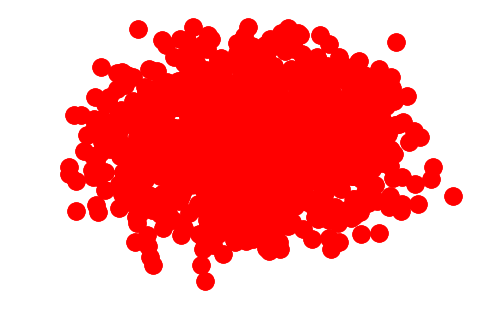

In [75]:
import matplotlib.pyplot as plt

G_Align=nx.Graph()
elist = unique_xmap
G_Align.add_weighted_edges_from(elist)
nx.draw(G_Align)
plt.show()

## compare node and edge connectivity
## compute largest connected component

In [64]:
print('Aligned graph have ',G_Align.number_of_nodes(),' nodes.')
print('Aligned graph have ',G_Align.number_of_edges(),' edges.')

Aligned graph have  5712  nodes.
Aligned graph have  9345  edges.


In [65]:
print('Target graph have ',G_target_na.number_of_nodes(),' nodes.')
print('Target graph have ',G_target_na.number_of_edges(), ' edges.')

Target graph have  6031  nodes.
Target graph have  21885  edges.


In [66]:
sum_weight=0
for i in range(len(unique_xmap)):
    sum_weight=sum_weight+ unique_xmap[i][2]
total_weight=0    
for i in range(len(nd1)):
    for j in range(len(nd2)):
        temp=G_target_na.get_edge_data(str(nd1[i]),str(nd2[j]))
        if(temp!=None):
            total_weight=total_weight+int(list(temp.values())[0])
print('Maximum Weight in Aligned graph: ',sum_weight) 
print('Total Weight in Target: ',total_weight)

Maximum Weight in Aligned graph:  1342617
Total Weight in Target:  2372525


In [67]:
# returns number of different connected components 
print('number of different connected components in Aligned graph: ',nx.number_connected_components(G_Align)) 
print('number of different connected components in Target graph: ',nx.number_connected_components(G_target_na))  

number of different connected components in Aligned graph:  1101
number of different connected components in Target graph:  1055


In [68]:
# returns list of nodes in different connected components 
cc_align=list(nx.connected_components(G_Align))
cc_target=list(nx.connected_components(G_target_na))
print(list(nx.connected_components(G_Align))) 
print(list(nx.connected_components(G_target_na)))

[{'sc949', 'dm2267', 'dm3878', 'dm147', 'sc503', 'dm10494', 'dm1922', 'sc1501', 'dm3659', 'dm87', 'sc192', 'dm13014', 'sc1593', 'dm2523', 'sc905', 'sc2505', 'dm3605', 'dm4769', 'dm3681', 'dm7180', 'dm7635', 'dm115', 'dm4175', 'sc86', 'dm10583', 'sc1333', 'dm1933', 'sc1193', 'sc1919', 'dm8741', 'dm6251', 'sc1581', 'sc447', 'sc143', 'sc3172', 'dm3003', 'sc453', 'dm7640', 'sc1290', 'sc2070', 'dm1865', 'dm2337', 'sc1650', 'dm7684', 'dm1160', 'dm5107', 'dm8868', 'sc1271', 'dm13253', 'sc2209', 'sc2249', 'dm3138', 'sc2103', 'sc1096', 'dm7827', 'sc765', 'dm8960', 'sc3122', 'dm6666', 'dm3676', 'sc888', 'sc539', 'dm2880', 'sc633', 'dm2575', 'sc3560', 'dm8065', 'sc2066', 'dm3236', 'sc670', 'dm10377', 'dm278', 'dm3791', 'dm1611', 'sc844', 'sc440', 'dm4845', 'dm2235', 'dm11951', 'sc38', 'sc2477', 'dm7695', 'dm782', 'dm12238', 'sc810', 'sc965', 'dm950', 'dm3107', 'dm367', 'sc1363', 'dm13662', 'dm116', 'dm8711', 'sc2193', 'sc922', 'dm4823', 'dm3529', 'sc3589', 'dm7896', 'sc2824', 'sc1643', 'dm13334',

In [69]:
# returns number of nodes to be removed 
# so that Graph becomes disconnected 
print(nx.node_connectivity(G_Align)) 
print(nx.node_connectivity(G_target_na))
# returns number of edges to be removed 
# so that Graph becomes disconnected 
print(nx.edge_connectivity(G_Align))
print(nx.edge_connectivity(G_target_na))

0
0
0
0


## check similarity of connected components

In [70]:
count=0
for i in range(len(cc_align)):
    for j in range(len(cc_target)):
        if(cc_align[i]==cc_target[j]):
            count=count+1
print(count)

1040


In [71]:
Gc = max(nx.connected_component_subgraphs(G_Align), key=len)
print('Largest common connected graph in Aligned graph: ',len(Gc))
Gct = max(nx.connected_component_subgraphs(G_target_na), key=len)
print('Largest common connected graph in Target graph: ',len(Gct))

Largest common connected graph in Aligned graph:  1533
Largest common connected graph in Target graph:  2240


### check for mistake align

In [55]:
for i in range(len(unique_xmap)):
    if (G_target_na.has_edge(unique_xmap[i][0], unique_xmap[i][1])==False):
        print(unique_xmap[i])
        print(i)
print('no exist error')    

no exist error


# draw graphs

In [0]:
nx.draw_networkx(G1, with_labels = True)

In [0]:
nx.draw_networkx(G2)

In [0]:
import matplotlib.pyplot as plt
nx.draw(G_target_na)
plt.show()

In [72]:
# total ec
total_ec=G_target_na.number_of_edges()/G1.number_of_edges()*100
ratio_ec=score_ec_temp/total_ec*100
print("total EC: ",total_ec)
print("ratio EC: ",ratio_ec)

total EC:  135.21779425393882
ratio EC:  42.69591044094129


In [73]:
# total ics
total_ics=G_target_na.number_of_edges()/count_induced*100
ratio_ics=score_ics_temp/total_ics*100
print("total ICS: ",total_ics)
print("ratio ICS: ",ratio_ics)

total ICS:  141.8984633339817
ratio ICS:  42.69591044094129


In [74]:
# total s3
total_s3=(G_target_na.number_of_edges()/(G1.number_of_edges()+count_induced-G_target_na.number_of_edges()))*100
ratio_s3=score_s3_temp/total_s3*100
print("total S3: ",total_s3)
print("ratio S3: ",ratio_s3)

total S3:  225.08485035482875
ratio S3:  18.64590088112074


# compute fc

In [1]:
import pickle
with open('sc-dm-weightGraph.pickle', 'rb') as f:
    unique_xmap = pickle.load(f)

In [2]:
tree=[[unique_xmap[i][0],unique_xmap[i][1]] for i in range(len(unique_xmap))]
tree

[['sc3481', 'dm11988'],
 ['sc437', 'dm1416'],
 ['sc3699', 'dm8964'],
 ['sc590', 'dm7846'],
 ['sc3226', 'dm7155'],
 ['sc2893', 'dm7772'],
 ['sc908', 'dm4675'],
 ['sc3134', 'dm7155'],
 ['sc3068', 'dm12075'],
 ['sc1992', 'dm5468'],
 ['sc4042', 'dm12562'],
 ['sc924', 'dm1911'],
 ['sc1461', 'dm2041'],
 ['sc4817', 'dm11125'],
 ['sc1964', 'dm4801'],
 ['sc282', 'dm539'],
 ['sc4372', 'dm9166'],
 ['sc366', 'dm7844'],
 ['sc3494', 'dm1097'],
 ['sc1103', 'dm2197'],
 ['sc142', 'dm1282'],
 ['sc4648', 'dm12336'],
 ['sc1869', 'dm3429'],
 ['sc5144', 'dm11632'],
 ['sc4042', 'dm12171'],
 ['sc1781', 'dm1345'],
 ['sc3819', 'dm12065'],
 ['sc2160', 'dm674'],
 ['sc2037', 'dm3710'],
 ['sc947', 'dm2365'],
 ['sc35', 'dm959'],
 ['sc153', 'dm1898'],
 ['sc2012', 'dm7586'],
 ['sc415', 'dm887'],
 ['sc2005', 'dm1549'],
 ['sc1420', 'dm3136'],
 ['sc270', 'dm533'],
 ['sc4605', 'dm476'],
 ['sc3390', 'dm10859'],
 ['sc5027', 'dm11585'],
 ['sc1152', 'dm8951'],
 ['sc1501', 'dm13320'],
 ['sc3544', 'dm2293'],
 ['sc156', 'dm649']

# load ontology and create DAG graph

In [3]:
import pandas as pd
f=open('go.dag.obo.txt').readlines()
df=pd.DataFrame(f)
df

,0
0,GO:0046431 GO:0019599\n
1,GO:0046430 GO:0019595\n
2,GO:0046432 GO:0019361\n
3,GO:0034198 GO:0060733\n
4,GO:0046343 GO:0019872\n
5,GO:0034193 GO:0034195\n
6,GO:0034192 GO:0034194\n
7,GO:0034190 GO:0034191\n
8,GO:0046437 GO:0030632 GO:0070179\n
9,GO:0046340 GO:0046342\n


In [4]:
# preprocessing
dag_list=[]
for i in range(len(df[0])):
    m1=str(df[0][i])
    m1=m1.replace('GO:','')
    m1=m1.replace('\n','')
    s=m1.split(' ')
    dag_list.append(s)
dag_list

[['0046431', '0019599'],
 ['0046430', '0019595'],
 ['0046432', '0019361'],
 ['0034198', '0060733'],
 ['0046343', '0019872'],
 ['0034193', '0034195'],
 ['0034192', '0034194'],
 ['0034190', '0034191'],
 ['0046437', '0030632', '0070179'],
 ['0046340', '0046342'],
 ['0030852', '0045658', '0030853', '0045643', '0030854', '0045640'],
 ['0030853', '0045659', '0045644', '0045641'],
 ['0030851', '0030221', '0030223', '0030222'],
 ['0030856',
  '0003339',
  '0030860',
  '0045601',
  '0030857',
  '0072182',
  '0030858',
  '0045616'],
 ['0030857', '0045602', '0030861', '0045617', '0072183'],
 ['0030854', '0045645', '0045642', '0045660'],
 ['0030855',
  '0030859',
  '0030216',
  '0072192',
  '0060671',
  '0072160',
  '0060742',
  '0035026',
  '0072311',
  '0060487',
  '0045446',
  '0060644',
  '0002065'],
 ['0030858', '0045603', '0030862', '0045618'],
 ['0030859', '0045198'],
 ['0031106', '0032186'],
 ['0031105', '0032151', '0032152'],
 ['0031103', '0014814', '0048673', '0014012'],
 ['0031102', '00

In [5]:
dag_nd=[]
for i in range(len(dag_list)):
    for j in range(len(dag_list[i])):
        dag_nd.append(dag_list[i][j])
dag_nodes=set(dag_nd)
print(dag_nodes)
print(len(dag_nodes))

{'0010912', '0032034', '0047374', '0033629', '0007309', '0031399', '0008482', '0015648', '0033220', '0033388', '0032594', '0003433', '0070920', '0018673', '0001797', '0000060', '0046624', '0006547', '0018121', '0032648', '0045899', '0051087', '0047696', '0010139', '0019086', '0061131', '0016166', '0060214', '0060990', '0046375', '0047277', '0004023', '0072212', '0000415', '0031977', '0050109', '0006517', '0003384', '0008188', '0034524', '0006965', '0033437', '0090009', '0046843', '0000706', '0007312', '0031716', '0090066', '0010719', '0003295', '0052264', '0031772', '0033872', '0046766', '0047098', '0042684', '0045283', '0030812', '0042342', '0070607', '0010753', '0017016', '0048304', '0032913', '0016529', '0007524', '0015351', '0047825', '0030134', '0018588', '0043365', '0034843', '0032212', '0014846', '0004326', '0047062', '0017080', '0047083', '0061016', '0060799', '0015747', '0031579', '0060629', '0006487', '0034756', '0030734', '0032986', '0071133', '0016247', '0072303', '0051993'

In [6]:
# create dag edges
dag_edges=[]
for i in range(len(dag_list)):
    for j in range(1,len(dag_list[i])):
        ed=[dag_list[i][0],dag_list[i][j]]
        dag_edges.append(ed)
dag_edges

[['0046431', '0019599'],
 ['0046430', '0019595'],
 ['0046432', '0019361'],
 ['0034198', '0060733'],
 ['0046343', '0019872'],
 ['0034193', '0034195'],
 ['0034192', '0034194'],
 ['0034190', '0034191'],
 ['0046437', '0030632'],
 ['0046437', '0070179'],
 ['0046340', '0046342'],
 ['0030852', '0045658'],
 ['0030852', '0030853'],
 ['0030852', '0045643'],
 ['0030852', '0030854'],
 ['0030852', '0045640'],
 ['0030853', '0045659'],
 ['0030853', '0045644'],
 ['0030853', '0045641'],
 ['0030851', '0030221'],
 ['0030851', '0030223'],
 ['0030851', '0030222'],
 ['0030856', '0003339'],
 ['0030856', '0030860'],
 ['0030856', '0045601'],
 ['0030856', '0030857'],
 ['0030856', '0072182'],
 ['0030856', '0030858'],
 ['0030856', '0045616'],
 ['0030857', '0045602'],
 ['0030857', '0030861'],
 ['0030857', '0045617'],
 ['0030857', '0072183'],
 ['0030854', '0045645'],
 ['0030854', '0045642'],
 ['0030854', '0045660'],
 ['0030855', '0030859'],
 ['0030855', '0030216'],
 ['0030855', '0072192'],
 ['0030855', '0060671'],


In [7]:
import networkx as nx
go=nx.DiGraph()
go.add_nodes_from(dag_nodes)
go.add_edges_from(dag_edges)
go

In [8]:
c=0
import numpy as np
na=tree
for i in range(len(tree)):
    for j in range(2):
        if ('sc' in tree[i][j] or 'dm' in tree[i][j]):
            s=tree[i][j][2:]
            x='0'*(7-len(s))
            y=x+s
            #print(y)
            na[i][j]=y
            c=c+1
print(len(tree),c)
print(len(na))

9422 18844
9422


In [9]:
fc=[]
for i in range(len(na)):
    if na[i][0] in dag_nodes:
        e=go.predecessors(na[i][0])
        if na[i][1] in dag_nodes: 
            f=go.predecessors(na[i][1])
            temp=[]
            for key in e:
                temp.append(key)
            for key in f:
                temp.append(key)
            # compute intersection/union 
            fc.append(sum([temp.count(temp[z])/len(temp) for z in range(len(temp))]))
        else:
            fc.append(0)
#print(fc)
# compute average of all fc 
func=np.average(fc)
print('functional coherence:',func)

functional coherence: 0.6204476389494875
